# dMdisk = 5e-9 * 5.972e27/3.154e7/150
# Did not fully converge

In [1]:
load_dep = True

In [2]:
import numpy as np
import os 
from dedalus import public as de
from dedalus.extras.plot_tools import quad_mesh, pad_limits
import matplotlib.pyplot as plt
from scipy.special import erf 
import logging
logger = logging.getLogger(__name__)

%matplotlib inline

import time

# from IPython.core.display import display, HTML
# display(HTML("<style>.container { width:100% !important; }</style>"))

from dedalus.extras import plot_tools 

In [3]:
a_1 = 1
AU = 1.496e13
Mp = 1 # Earth masses
T_disk = 300 *a_1**(-1/2)

rho_disk = 2.4e-9*a_1**(-11/4)
r_Hill = 2e11*a_1*(Mp)**(1/3)
r_Bondi = 4e10*a_1**(1/2)*Mp

print('disk temperature: ' + str(T_disk))
print('disk density: ' + str(rho_disk))
print('hill radius: {:.4e}'.format(r_Hill))
print('bondi radius: {:.4e}'.format(r_Bondi))

disk temperature: 300.0
disk density: 2.4e-09
hill radius: 2.0000e+11
bondi radius: 4.0000e+10


In [4]:
# Basis and domain

resolution = 256 #500
# normalization factors
r_0 = 1.2e8
T_0 = 1000
P_0 = 1 #1e5 #1
M_0 = 1e-12
m_0 = 1e25
L_0 = 3.144546892817586e+27
Dep_0 = 5.972e27/3.154e7 

# r_outer = 1.496e13/r_0
r_outer = r_Hill /r_0 # 3.4199512e11/r_0
r_inner = 1.2e9/r_0

log_inner = np.log(r_inner) 
log_outer = np.log(r_outer)

log_basis = de.Chebyshev('r', resolution, interval=(log_inner,log_outer))  
domain = de.Domain([log_basis], np.float64)

In [5]:
# Problem

ncc_cutoff = 1e-6 #1e-2
tolerance = 1e-6 #1e-2
# P and T are actually log(P) and log(T)
problem = de.NLBVP(domain,variables = ['lgP', 'lgT', 'lgM', 'lgZgr','m', 'L'], ncc_cutoff = ncc_cutoff)
R = np.log10(np.exp(domain.grid(0))*r_0)

In [6]:
# Parameters

problem.parameters['T_0'] = T_0 
problem.parameters['r_0'] = r_0
problem.parameters['P_0'] = P_0 # unused
problem.parameters['M_0'] = M_0
problem.parameters['m_0'] = m_0
problem.parameters['Dep_0'] = Dep_0
problem.parameters['L_0'] = L_0

lgP = domain.new_field(name='lgP')
lgT = domain.new_field(name='lgT')
lgZgr = domain.new_field(name='lgZgr')
lgM = domain.new_field(name='lgM')
m = domain.new_field(name='m')
L = domain.new_field(name='L')

r = domain.new_field(name='R')
r['g'] = domain.grid(0)
S = np.exp(r['g']) * r_0
ones = np.ones(len(r['g']))

pi = np.pi 
Core_mass = Mp*5.972e27
Mc = Core_mass # 5* mass of earth (in g)
mu = 2.34 * 1.6735575e-24 #mH multiplied by hydrogen atom mass 
kb = 1.38064852e-16 # g*cm**2/(K*s**2)
G = 6.67408e-8 # cm**3/(g*s**2)
dMtot = 0.2*1e-5* 5.972e27/3.154e7 # 10e-5* mass of earth, g/s #3.154e7 is conversion from yr to s
sig = 5.670367e-5 # (cgs units) e-5 in g/(K^4s^3), Stefan Boltzmann Const (normally it's e-8 in [W⋅m−2⋅K−4])
s0 = 1e-4 # cm
rho_o = 3 #g cm^-3 grain internal density
sigma_b = 5.6704e-5 # erg*cm^-2*s^-1*K^-4 Stefan Boltzmann 
rcore = 1.2e9
grad_rad_cst = - 3*dMtot/(64*np.pi*rcore*sig)
gm = G*Mc 

rhodisk = rho_disk # 7.5e-9 #g/cm**3
Tdisk = T_disk # 370 # kelvin

mdep = rho_o * 4/3 * pi *(1e4)**3
dMdisk = 5e-9 * 5.972e27/3.154e7/150


problem.parameters['pi'] = np.pi
problem.parameters['Mc'] = Core_mass 
problem.parameters['mu'] = 2.34 * 1.6735575e-24 #mH multiplied by hydrogen atom mass 
problem.parameters['kb'] = 1.38064852e-16 # g*cm**2/(K*s**2)
problem.parameters['G'] = 6.67408e-8 # cm**3/(g*s**2)
problem.parameters['dMtot'] = 0.2*1e-5*5.972e27/3.154e7 # 10e-5* mass of earth, g/s #3.154e7 is conversion from yr to s
problem.parameters['sig'] = 5.670367e-5 # (cgs units) e-5 in g/(K^4s^3), Stefan Boltzmann Const (normally it's e-8 in [W⋅m−2⋅K−4])
problem.parameters['s0'] = 1e-4 # cm
problem.parameters['rho_o'] = 3 #g cm^-3 grain internal density
problem.parameters['mdep'] = problem.parameters['rho_o']*4/3*np.pi*(1e-4)**(3)
problem.parameters['sigma_b'] = 5.6704e-5 # erg*cm^-2*s^-1*K^-4 Stefan Boltzmann 
rcore = 1.2e9
problem.parameters['grad_rad_cst'] = - 3*problem.parameters['dMtot']/(64*np.pi*rcore*problem.parameters['sig'])


# problem.parameters['rhodisk'] = 4e-9 # 1e-11 #g/cm**3
# problem.parameters['Tdisk'] = 370 # 150 # kelvin

problem.parameters['rhodisk'] = rhodisk #g/cm**3
problem.parameters['Tdisk'] = Tdisk # kelvin

problem.substitutions['s'] = '(exp(lgM)*M_0*3/(4*pi*rho_o))**(1/3)' # radius
s = (np.exp(lgM)*M_0*3/(4*pi*rho_o))**(1/3)


# Deposition Type (3 versions) 

-24.124463218608565


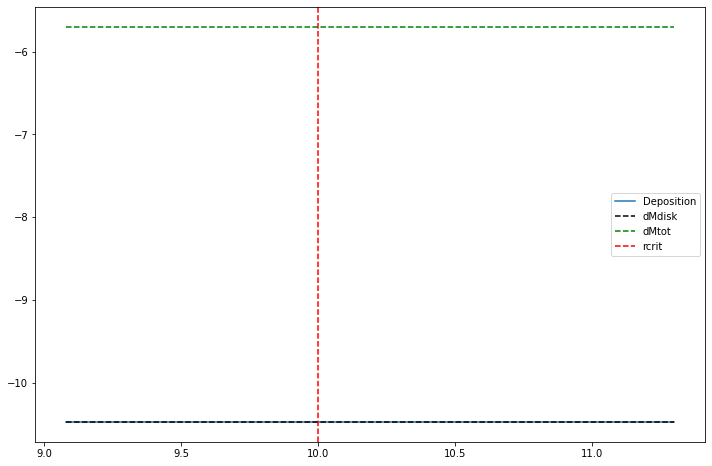

In [7]:
# # Mass deposition 
deposition_version = 'null'

if deposition_version == 0:
    lgdM = domain.new_field(name='lgdM')
    lgdM['g'] = np.loadtxt('M1dep.txt')

    d_r = log_basis.Differentiate(lgdM)
    dlgdM = d_r.evaluate()
    Mdep_fixed = lgdM['g']
    dlgdM_fixed = dlgdM['g']
    n_roll = Mdep_fixed.shape[0]//4
    Mdep_fixed_rolled =np.roll(Mdep_fixed, n_roll)
    dlgdM_fixed_rolled = np.roll(dlgdM_fixed, n_roll)

    # Correct leftmost values too low from wrapping around
    Mdep_fixed_rolled[:n_roll] = Mdep_fixed[0]
    dlgdM_fixed_rolled[:n_roll] = 0. # Zero gradient for constant value correction

    ones = lgdM['g']/lgdM['g']

    constant = np.log(ones*1e-5)
    dconstant = 0.*ones

    lgdM['g'] = Mdep_fixed_rolled
    dlgdM['g'] = dlgdM_fixed_rolled

    

elif deposition_version == 1:
    lgdM = domain.new_field(name='lgdM')
    lgdM['g'] = np.log(np.loadtxt('Deposition.txt')/Dep_0)
    d_r = log_basis.Differentiate(lgdM)
    dlgdM = d_r.evaluate()

# elif deposition_version=='None':
#     lgdM = domain.new_field(name='lgdM')
#     lgdM['g'] = np.log(np.loadtxt('Deposition.txt')/Dep_0)
#     d_r = log_basis.Differentiate(lgdM)
#     dlgdM = d_r.evaluate()

elif deposition_version=='null':
    location = 10 # in log10 
    smooth = 3
    X = r['g'] - np.log(10**location/r_0) 
    lgdM = domain.new_field(name='lgdM')
    lgdM['g'] = X*0
    lgdM['g'] = lgdM['g']+np.log(dMdisk/Dep_0)
    print(np.log(dMdisk/Dep_0))
    # DEP = dMdisk + (dMtot-dMdisk)*((erf(smooth*eX['g']) + 1)/2)
    d_r = log_basis.Differentiate(lgdM)
    dlgdM = d_r.evaluate()

else:
    location = 10 # in log10 
    smooth = 3
    X = r['g'] - np.log(10**location/r_0) 
    lgdM = domain.new_field(name='lgdM')
    lgdM['g'] = np.log((dMdisk + (dMtot-dMdisk)*((-erf(smooth*X) + 1)/2))/Dep_0)    
    # DEP = dMdisk + (dMtot-dMdisk)*((erf(smooth*eX['g']) + 1)/2)
    d_r = log_basis.Differentiate(lgdM)
    dlgdM = d_r.evaluate()
    
problem.parameters['lgDep'] = lgdM
problem.parameters['dlgDep'] = dlgdM

lgDep = domain.new_field(name='lgDep')
dlgDep = domain.new_field(name='dlgDep')
lgDep['g'] = lgdM['g']
dlgDep['g'] = dlgdM['g']

plt.figure(figsize=(12,8))
plt.plot(R, np.log10(np.exp(lgdM['g'])), label='Deposition')
plt.plot(R, np.log10(ones*dMdisk/Dep_0), 'k--', label='dMdisk')
plt.plot(R, np.log10(ones*dMtot/Dep_0), 'g--', label='dMtot')
if deposition_version != 1 and deposition_version !=0:
    plt.axvline(location, color = 'r', ls='--', label='rcrit')
plt.legend()
# plt.plot(R, np.log10(np.exp(dlgdM['g'])))

In [8]:
# Opacity

problem.substitutions['x'] = '2*pi*s*0.3/0.2898'
x = 2*pi*s*0.3/0.2898

# min(2,ex*T*T_0) 
k0 = -10. # -30.
problem.parameters['k0'] = k0

problem.substitutions['Qe'] = "(0.5*(2**k0 + (x*exp(lgT)*T_0)**k0))**(1/k0)"
Qe = (0.5*(2**k0 + (x*np.exp(lgT)*T_0)**k0))**(1/k0)

problem.substitutions['Qk_geo'] = "Qe*3/4*exp(lgZgr)/(s*rho_o)" 
Qk_geo = Qe*3/4*np.exp(lgZgr)/(s*rho_o)

k_gas_cst = 1e-8*(problem.parameters["mu"]/problem.parameters['kb'])**(2/3) # O(10^-14)
problem.parameters['k_gas_cst'] = k_gas_cst

problem.substitutions['k_gas'] = "k_gas_cst*(exp(lgT)*T_0)**(7/3)*(exp(lgP)*P_0)**(2/3)" 
k_gas = k_gas_cst*(np.exp(lgT)*T_0)**(7/3)*(np.exp(lgP)*P_0)**(2/3)

problem.substitutions['kappa'] = "k_gas + Qk_geo"
kappa = k_gas + Qk_geo 

In [9]:
# Gradient  


# problem.substitutions['grad_rad'] = "grad_rad_cst*kappa*exp(lgP)*P_0/(exp(lgT)*T_0)**4"

grad_ad = 0.28
problem.parameters['grad_ad'] = grad_ad


# problem.substitutions['grad_rad'] = '-3*kappa*exp(L)*L_0/(64*pi*sigma_b*gm) * exp(lgP)*P_0/(exp(lgT)*T_0)**4'
problem.substitutions['grad_rad'] = '3*kappa*L*L_0/(64*pi*sigma_b*gm) * exp(lgP)*P_0/(exp(lgT)*T_0)**4'
grad_rad = 3*kappa*L*L_0/(64*pi*sigma_b*gm) * np.exp(lgP)*P_0/(np.exp(lgT)*T_0)**4


# min
k1 = -10. # -30.
problem.parameters['k1'] = k1
problem.substitutions['grad'] = "(0.5*(grad_rad**k1 + (grad_ad)**k1))**(1/k1)" 
grad = (0.5*(grad_rad**k1 + (grad_ad)**k1))**(1/k1)

In [10]:
# Tstop: v_set = gm/r^2 * Tstop 

gm = problem.parameters['Mc']*problem.parameters['G']
problem.parameters['gm'] = gm

problem.substitutions['rho_g'] = '(exp(lgP)*P_0*mu)/(kb*exp(lgT)*T_0)'
rho_g = (np.exp(lgP)*P_0*mu)/(kb*np.exp(lgT)*T_0)

problem.substitutions['cg'] = 'sqrt(kb*exp(lgT)*T_0/mu)'
cg = np.sqrt(kb*np.exp(lgT)*T_0/mu)

problem.substitutions['Lg'] = '1e-9/rho_g'
Lg = 1e-9/rho_g

l = 30 #1 #15
problem.parameters['l'] = l

problem.substitutions['max'] = "(0.5*(1 + (9/4*s/Lg)**l))**(1/l)"
Max = (0.5*(1 + (s/Lg)**l))**(1/l)


problem.substitutions['Tstop'] = '(max*4*rho_o*s)/(9*cg*rho_g)'
Tstop = (Max*4*rho_o*s)/(9*cg*rho_g)

problem.substitutions['v_set'] = 'gm*Tstop/(exp(r)*r_0)**2'
v_set = gm*Tstop/(np.exp(r)*r_0)**2

In [11]:
# Tgrow 

problem.substitutions['v_bm'] = 'sqrt(16*kb*exp(lgT)*T_0/(pi*exp(lgM)*M_0))'
v_bm = np.sqrt(16*kb*np.exp(lgT)*T_0/(np.pi*np.exp(lgM)*M_0))

problem.substitutions['v_dd'] = '0.1*v_set'
v_dd = 0.1*v_set

problem.substitutions['Tgrow_inv'] = '3*exp(lgZgr)*rho_g*(v_bm+v_dd)/(rho_o*s)'
Tgrow_inv = 3*np.exp(lgZgr)*rho_g*(v_bm+v_dd)/(rho_o*s)

In [12]:
# Energy equation

# problem.substitutions['drho_dep'] = '-1/(4*pi*(exp(r)*r_0)**2) * dlgDep * 1e5'
problem.substitutions['drho_dep'] = '-1/(4*pi*(exp(r)*r_0)**3) * dlgDep * Dep_0 * exp(lgDep)'
drho_dep = -1/(4*pi*(np.exp(r)*r_0)**3) * dlgDep * Dep_0 * np.exp(lgDep)

Trelax = 1e30
problem.parameters['Trelax'] = Trelax

Lcore = problem.parameters['gm']*problem.parameters['dMtot']/(r_inner*r_0)
problem.parameters['Lcore'] = Lcore
print(problem.parameters['Lcore'])

1.2578187571270345e+26


In [13]:
# New equations

problem.add_equation('lgZgr = log(exp(lgDep)*Dep_0/(4*pi*gm*Tstop*rho_g))')
# problem.add_equation('lgZgr = log(dMdep/(4*pi*gm*Tstop*rho_g))')
problem.add_equation('dr(lgM) = -Tgrow_inv*(exp(r)*r_0)**3/(gm*Tstop) + dlgDep*(mdep-exp(lgM)*M_0)/(exp(lgM)*M_0)')

In [14]:
# Normalized equations

# problem.parameters['eq1cst'] = -1*problem.parameters['G']*problem.parameters['Mc']*problem.parameters['mu']/(T_0*r_0*problem.parameters['kb'])
problem.add_equation('dr(m) = 4*pi*(exp(r)*r_0)**3 * rho_g/m_0')
problem.add_equation('exp(r) * dr(lgP) = -G*(Mc+m*m_0)*mu/(T_0*r_0*kb*exp(lgT))')
problem.add_equation('dr(lgT) = dr(lgP)*grad')

# problem.add_equation('dr(L) = 4*pi*(exp(r)*r_0)* (G*(Mc+m*m_0)*drho_dep/(exp(r)*r_0))')
# problem.add_equation('dr(L)*L_0 = 4*pi*(exp(r)*r_0)**3 * (G*(Mc+m*m_0)*drho_dep/(exp(r)*r_0) + rho_g*cg*(exp(lgT)*T_0 - Tdisk)/Trelax )')
problem.add_equation('dr(L)*L_0 = (4*pi*(exp(r)*r_0)**3 * (G*(Mc+m*m_0)*drho_dep/(exp(r)*r_0) + rho_g*cg*(exp(lgT)*T_0 - Tdisk)/Trelax ))')


In [15]:
# Boundary Equations


problem.add_bc("right(lgT) = log(Tdisk/T_0)") # disk temp in kelvins
problem.add_bc("right(lgP) = log(rhodisk*kb*Tdisk/mu/P_0)") # gas law
problem.add_bc("right(lgZgr) = log(1e-3)")
problem.add_bc("left(m) = 0")
problem.add_bc("left(L) = Lcore/L_0")

In [16]:
# solver = problem.build_solver(de.timesteppers.RK443)
solver = problem.build_solver()

2020-12-06 04:53:59,851 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.0e+01/s


Text(0.5, 1.0, 'm')

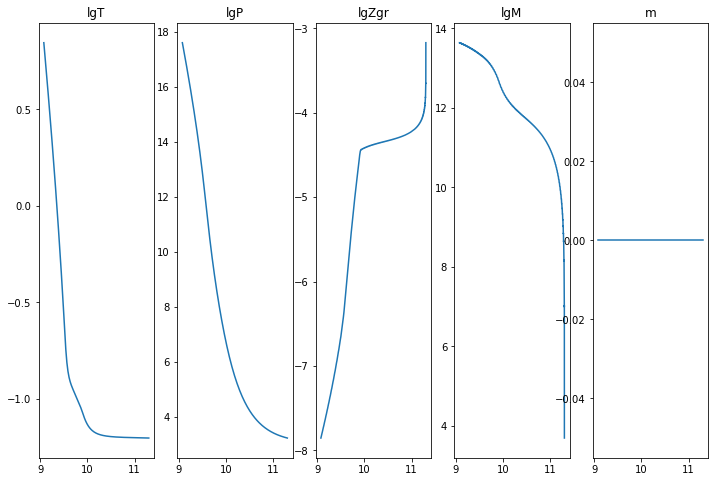

In [17]:
# initial conditions and referencing local grid state fields

lgr = domain.grid(0)
Rscale = np.log10(np.exp(domain.grid(0))*r_0)
lgT1 = solver.state['lgT']
lgP1 = solver.state['lgP']
lgZgr1 = solver.state['lgZgr']
lgM1 = solver.state['lgM']

L1 = solver.state['L']
m1= solver.state['m']

# Load from constant Mass and Zgr version

lgP_initial = np.loadtxt("Pressure.txt")
lgT_initial = np.loadtxt("Temperature.txt")
Zi = np.loadtxt('Zgr.txt')
Mi = np.loadtxt('M.txt')

lgP1['g'] = lgP_initial
lgT1['g'] = lgT_initial
ones = lgT1['g']/lgT1['g']

L1['g'] = ones*problem.parameters['Lcore']/L_0

lgZgr1['g'] = Zi 

lgM1['g'] = Mi
m1['g'] = ones*0


if load_dep: 
    lgP1['g'] = np.loadtxt("NPressure_dep.txt")
    lgT1['g'] = np.loadtxt("NTemperature_dep.txt")
    L1['g'] = np.loadtxt('NL_dep.txt')
    lgZgr1['g'] = np.loadtxt('NZgr_dep.txt') 
    lgM1['g'] = np.loadtxt('NM_dep.txt')
    m1['g'] = np.loadtxt('Nm_dep.txt')
    
    
plt.figure(figsize=(12,8))
plt.subplot(1,5,1)
plt.plot(Rscale,lgT1['g'])
plt.title("lgT")
plt.subplot(1,5,2)
plt.plot(Rscale, lgP1['g'])
plt.title("lgP")
plt.subplot(1,5,3)
plt.plot(Rscale, np.log10(np.exp(lgZgr1['g'])))
plt.title("lgZgr")
plt.subplot(1,5,4)
plt.plot(Rscale, lgM1['g'])
plt.title("lgM")
plt.subplot(1,5,5)
plt.plot(Rscale, m1['g'])
plt.title("m")

In [18]:

lgT_list = [np.copy(lgT1['g'])]
lgP_list = [np.copy(lgP1['g'])]
lgZgr_list = [np.copy(lgZgr1['g'])]
lgM_list = [np.copy(lgM1['g'])]
m_list = [np.copy(m1['g'])]
L_list = [np.copy(L1['g'])]

2020-12-06 04:54:06,723 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.8e+00/s
2020-12-06 04:54:08,197 __main__ 0/1 INFO :: Perturbation norm: 12.032031366798567
2020-12-06 04:54:08,202 __main__ 0/1 INFO :: lgT iterate: 0.8449310866152315
2020-12-06 04:54:08,206 __main__ 0/1 INFO :: lgP iterate: 17.581560615799383
2020-12-06 04:54:08,209 __main__ 0/1 INFO :: lgM iterate: 13.641076955802514
2020-12-06 04:54:08,213 __main__ 0/1 INFO :: lgZgr iterate: -18.069928661583493
2020-12-06 04:54:08,218 __main__ 0/1 INFO :: m iterate: 5.5042722198805905e-05
2020-12-06 04:54:08,223 __main__ 0/1 INFO :: L iterate: 0.04000000000000029


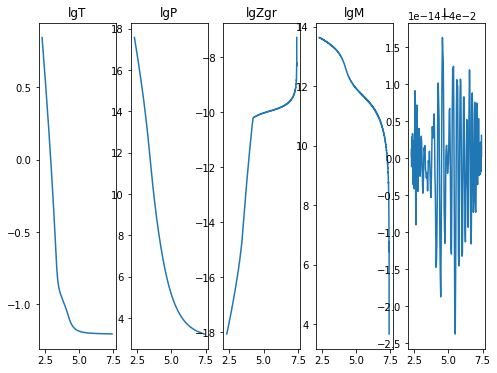

2020-12-06 04:54:12,531 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-12-06 04:54:13,460 __main__ 0/1 INFO :: Perturbation norm: 1.7403613706289467
2020-12-06 04:54:13,461 __main__ 0/1 INFO :: lgT iterate: 0.8455522960899977
2020-12-06 04:54:13,462 __main__ 0/1 INFO :: lgP iterate: 17.59681771675225
2020-12-06 04:54:13,463 __main__ 0/1 INFO :: lgM iterate: 13.6411155195519
2020-12-06 04:54:13,465 __main__ 0/1 INFO :: lgZgr iterate: -18.08428487315149
2020-12-06 04:54:13,466 __main__ 0/1 INFO :: m iterate: 5.587645483284831e-05
2020-12-06 04:54:13,467 __main__ 0/1 INFO :: L iterate: 0.04


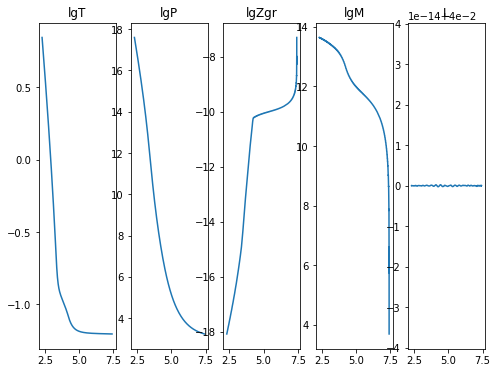

2020-12-06 04:54:17,106 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 04:54:18,199 __main__ 0/1 INFO :: Perturbation norm: 1.7404652596032852
2020-12-06 04:54:18,200 __main__ 0/1 INFO :: lgT iterate: 0.844929764383894
2020-12-06 04:54:18,201 __main__ 0/1 INFO :: lgP iterate: 17.581556446821654
2020-12-06 04:54:18,202 __main__ 0/1 INFO :: lgM iterate: 13.641074670313344
2020-12-06 04:54:18,203 __main__ 0/1 INFO :: lgZgr iterate: -18.069924952283884
2020-12-06 04:54:18,204 __main__ 0/1 INFO :: m iterate: 5.504256239152738e-05
2020-12-06 04:54:18,205 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


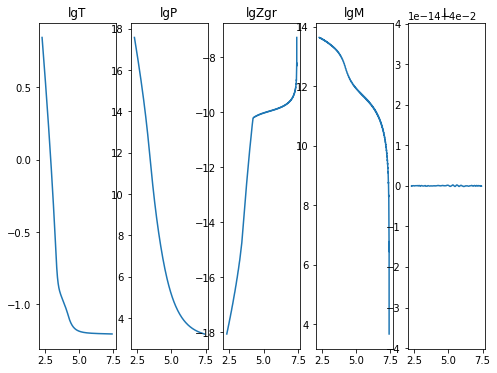

2020-12-06 04:54:21,900 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:54:22,774 __main__ 0/1 INFO :: Perturbation norm: 1.7404650066726202
2020-12-06 04:54:22,775 __main__ 0/1 INFO :: lgT iterate: 0.8455523061005856
2020-12-06 04:54:22,776 __main__ 0/1 INFO :: lgP iterate: 17.59681772116575
2020-12-06 04:54:22,777 __main__ 0/1 INFO :: lgM iterate: 13.641115571179167
2020-12-06 04:54:22,777 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895680625
2020-12-06 04:54:22,778 __main__ 0/1 INFO :: m iterate: 5.587645164073507e-05
2020-12-06 04:54:22,779 __main__ 0/1 INFO :: L iterate: 0.04


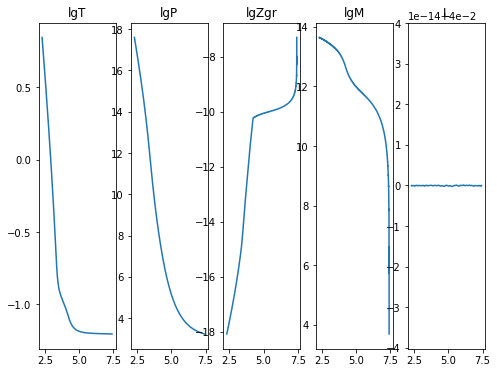

2020-12-06 04:54:26,488 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:54:27,542 __main__ 0/1 INFO :: Perturbation norm: 1.7404650300510196
2020-12-06 04:54:27,543 __main__ 0/1 INFO :: lgT iterate: 0.844929764667306
2020-12-06 04:54:27,544 __main__ 0/1 INFO :: lgP iterate: 17.58155645013991
2020-12-06 04:54:27,545 __main__ 0/1 INFO :: lgM iterate: 13.641074668476396
2020-12-06 04:54:27,546 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495395539
2020-12-06 04:54:27,547 __main__ 0/1 INFO :: m iterate: 5.504256284805109e-05
2020-12-06 04:54:27,548 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


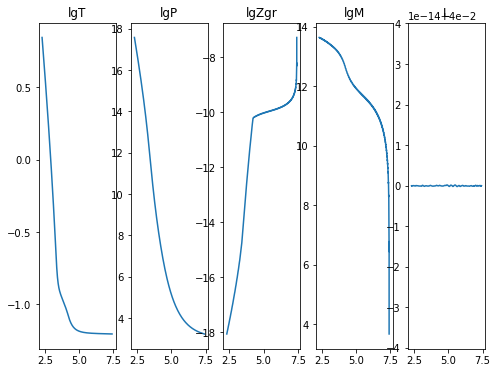

2020-12-06 04:54:31,300 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:54:32,153 __main__ 0/1 INFO :: Perturbation norm: 1.7404648588259968
2020-12-06 04:54:32,155 __main__ 0/1 INFO :: lgT iterate: 0.8455523060239759
2020-12-06 04:54:32,156 __main__ 0/1 INFO :: lgP iterate: 17.59681771940398
2020-12-06 04:54:32,157 __main__ 0/1 INFO :: lgM iterate: 13.641115570897004
2020-12-06 04:54:32,158 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489384647
2020-12-06 04:54:32,159 __main__ 0/1 INFO :: m iterate: 5.587645166382771e-05
2020-12-06 04:54:32,160 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


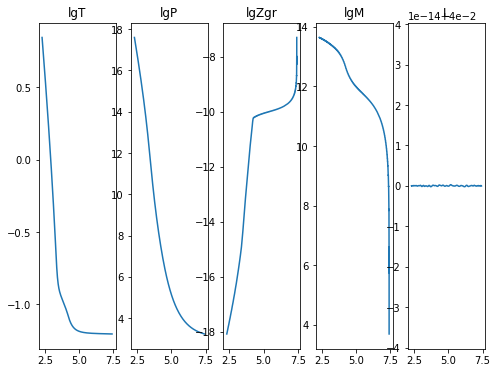

2020-12-06 04:54:35,867 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:54:36,830 __main__ 0/1 INFO :: Perturbation norm: 1.7404647066618573
2020-12-06 04:54:36,831 __main__ 0/1 INFO :: lgT iterate: 0.8449297647638865
2020-12-06 04:54:36,832 __main__ 0/1 INFO :: lgP iterate: 17.581556452527927
2020-12-06 04:54:36,833 __main__ 0/1 INFO :: lgM iterate: 13.641074669124395
2020-12-06 04:54:36,834 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956632356
2020-12-06 04:54:36,835 __main__ 0/1 INFO :: m iterate: 5.504256297861332e-05
2020-12-06 04:54:36,835 __main__ 0/1 INFO :: L iterate: 0.04


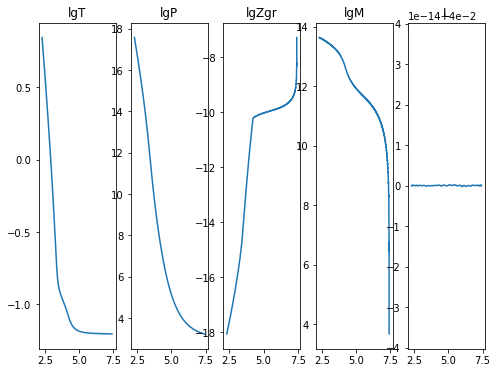

2020-12-06 04:54:40,405 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:54:41,310 __main__ 0/1 INFO :: Perturbation norm: 1.7404646842005496
2020-12-06 04:54:41,311 __main__ 0/1 INFO :: lgT iterate: 0.8455523060591258
2020-12-06 04:54:41,312 __main__ 0/1 INFO :: lgP iterate: 17.59681772043447
2020-12-06 04:54:41,313 __main__ 0/1 INFO :: lgM iterate: 13.641115571445749
2020-12-06 04:54:41,314 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489519035
2020-12-06 04:54:41,315 __main__ 0/1 INFO :: m iterate: 5.5876451733993804e-05
2020-12-06 04:54:41,316 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


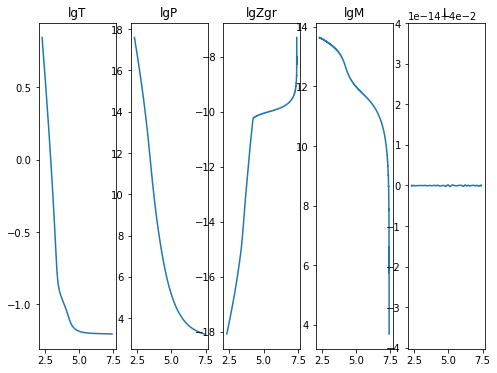

2020-12-06 04:54:45,009 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:54:46,017 __main__ 0/1 INFO :: Perturbation norm: 1.740464637792431
2020-12-06 04:54:46,018 __main__ 0/1 INFO :: lgT iterate: 0.8449297647739998
2020-12-06 04:54:46,019 __main__ 0/1 INFO :: lgP iterate: 17.581556452746206
2020-12-06 04:54:46,019 __main__ 0/1 INFO :: lgM iterate: 13.64107466905578
2020-12-06 04:54:46,020 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956789706
2020-12-06 04:54:46,021 __main__ 0/1 INFO :: m iterate: 5.504256300437049e-05
2020-12-06 04:54:46,022 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


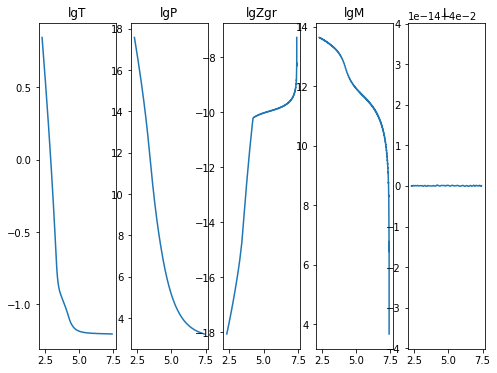

2020-12-06 04:54:49,729 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:54:50,576 __main__ 0/1 INFO :: Perturbation norm: 1.7404646353892166
2020-12-06 04:54:50,578 __main__ 0/1 INFO :: lgT iterate: 0.8455523060595285
2020-12-06 04:54:50,578 __main__ 0/1 INFO :: lgP iterate: 17.59681772044914
2020-12-06 04:54:50,579 __main__ 0/1 INFO :: lgM iterate: 13.641115571511992
2020-12-06 04:54:50,580 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895248633
2020-12-06 04:54:50,581 __main__ 0/1 INFO :: m iterate: 5.587645174287559e-05
2020-12-06 04:54:50,581 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


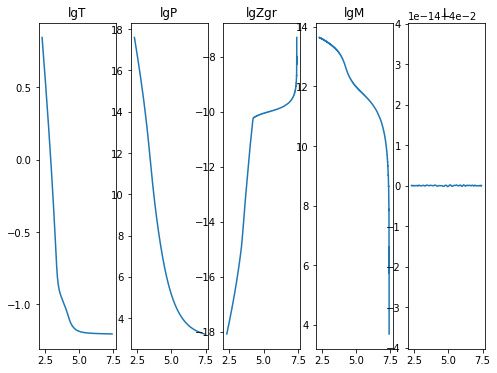

2020-12-06 04:54:54,910 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.8e+00/s
2020-12-06 04:54:56,200 __main__ 0/1 INFO :: Perturbation norm: 1.7404646257108134
2020-12-06 04:54:56,201 __main__ 0/1 INFO :: lgT iterate: 0.8449297647753484
2020-12-06 04:54:56,202 __main__ 0/1 INFO :: lgP iterate: 17.581556452782348
2020-12-06 04:54:56,203 __main__ 0/1 INFO :: lgM iterate: 13.641074669044018
2020-12-06 04:54:56,204 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956815996
2020-12-06 04:54:56,205 __main__ 0/1 INFO :: m iterate: 5.504256300081778e-05
2020-12-06 04:54:56,205 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


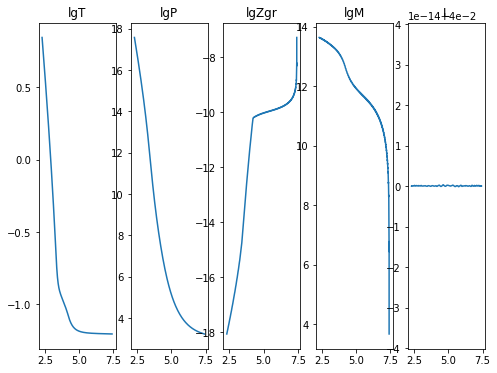

2020-12-06 04:54:59,776 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:55:00,604 __main__ 0/1 INFO :: Perturbation norm: 1.740464620132574
2020-12-06 04:55:00,605 __main__ 0/1 INFO :: lgT iterate: 0.8455523060537762
2020-12-06 04:55:00,606 __main__ 0/1 INFO :: lgP iterate: 17.5968177203017
2020-12-06 04:55:00,607 __main__ 0/1 INFO :: lgM iterate: 13.641115571508598
2020-12-06 04:55:00,607 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895107558
2020-12-06 04:55:00,608 __main__ 0/1 INFO :: m iterate: 5.5876451733993804e-05
2020-12-06 04:55:00,609 __main__ 0/1 INFO :: L iterate: 0.04


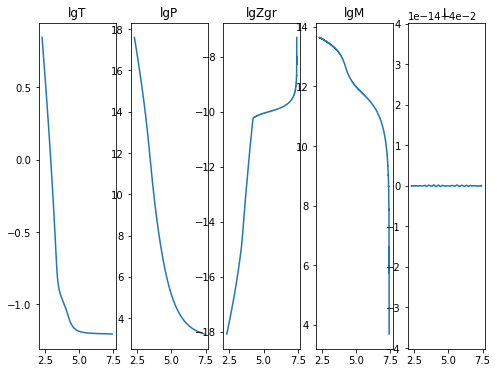

2020-12-06 04:55:04,341 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:55:05,521 __main__ 0/1 INFO :: Perturbation norm: 1.7404646143260365
2020-12-06 04:55:05,523 __main__ 0/1 INFO :: lgT iterate: 0.8449297647779037
2020-12-06 04:55:05,524 __main__ 0/1 INFO :: lgP iterate: 17.58155645284925
2020-12-06 04:55:05,525 __main__ 0/1 INFO :: lgM iterate: 13.641074669064281
2020-12-06 04:55:05,527 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495689262
2020-12-06 04:55:05,529 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 04:55:05,530 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


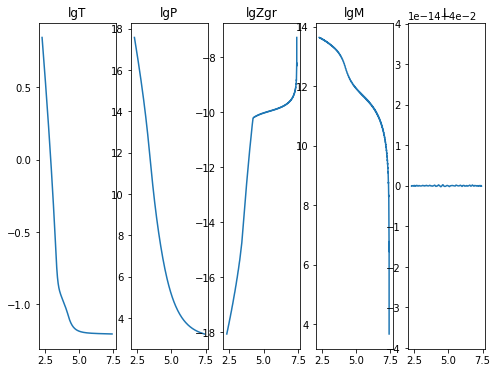

2020-12-06 04:55:09,646 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:55:10,844 __main__ 0/1 INFO :: Perturbation norm: 1.740464611070906
2020-12-06 04:55:10,848 __main__ 0/1 INFO :: lgT iterate: 0.8455523060522188
2020-12-06 04:55:10,849 __main__ 0/1 INFO :: lgP iterate: 17.5968177202653
2020-12-06 04:55:10,851 __main__ 0/1 INFO :: lgM iterate: 13.641115571520606
2020-12-06 04:55:10,852 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895081524
2020-12-06 04:55:10,853 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-12-06 04:55:10,855 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


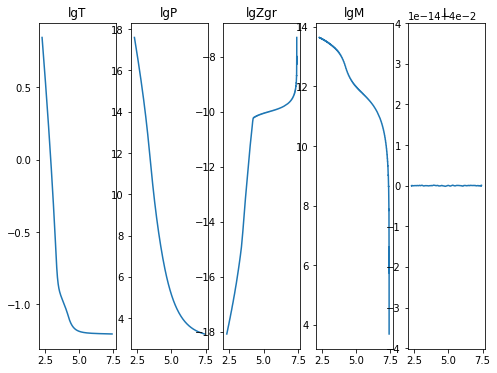

2020-12-06 04:55:14,871 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.1e+00/s
2020-12-06 04:55:16,018 __main__ 0/1 INFO :: Perturbation norm: 1.7404646075786363
2020-12-06 04:55:16,023 __main__ 0/1 INFO :: lgT iterate: 0.8449297647792617
2020-12-06 04:55:16,027 __main__ 0/1 INFO :: lgP iterate: 17.581556452883298
2020-12-06 04:55:16,042 __main__ 0/1 INFO :: lgM iterate: 13.64107466907221
2020-12-06 04:55:16,048 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495692994
2020-12-06 04:55:16,055 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-12-06 04:55:16,062 __main__ 0/1 INFO :: L iterate: 0.04000000000000005


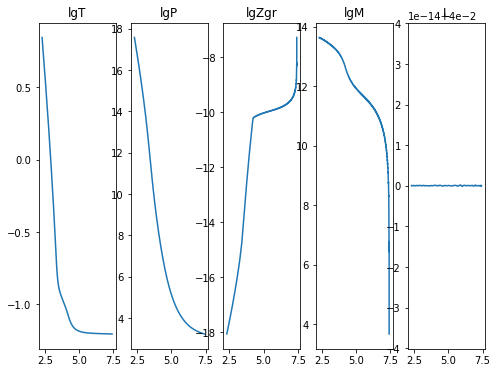

2020-12-06 04:55:19,889 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:55:20,741 __main__ 0/1 INFO :: Perturbation norm: 1.7404646064850955
2020-12-06 04:55:20,742 __main__ 0/1 INFO :: lgT iterate: 0.8455523060520145
2020-12-06 04:55:20,746 __main__ 0/1 INFO :: lgP iterate: 17.59681772026173
2020-12-06 04:55:20,747 __main__ 0/1 INFO :: lgM iterate: 13.64111557152868
2020-12-06 04:55:20,750 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489508365
2020-12-06 04:55:20,751 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-12-06 04:55:20,755 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


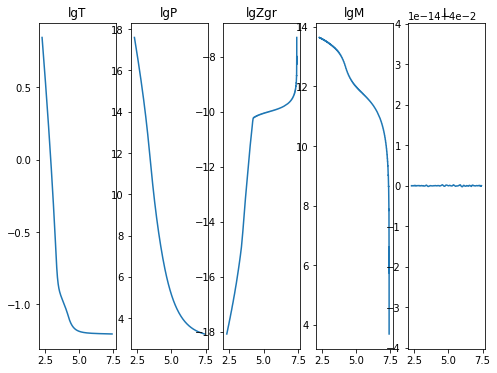

2020-12-06 04:55:24,462 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:55:25,529 __main__ 0/1 INFO :: Perturbation norm: 1.740464605046477
2020-12-06 04:55:25,530 __main__ 0/1 INFO :: lgT iterate: 0.8449297647796977
2020-12-06 04:55:25,531 __main__ 0/1 INFO :: lgP iterate: 17.58155645289414
2020-12-06 04:55:25,532 __main__ 0/1 INFO :: lgM iterate: 13.641074669073625
2020-12-06 04:55:25,533 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956941087
2020-12-06 04:55:25,534 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-12-06 04:55:25,535 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


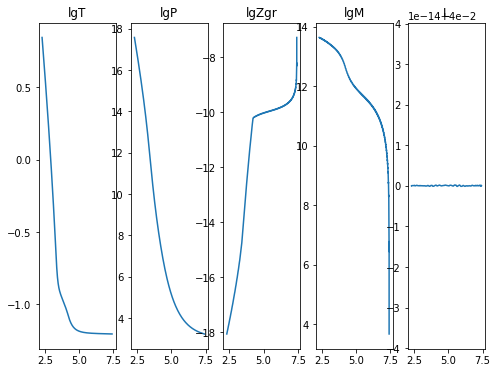

2020-12-06 04:55:29,166 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:55:29,934 __main__ 0/1 INFO :: Perturbation norm: 1.7404646046291452
2020-12-06 04:55:29,936 __main__ 0/1 INFO :: lgT iterate: 0.845552306051846
2020-12-06 04:55:29,936 __main__ 0/1 INFO :: lgP iterate: 17.59681772025786
2020-12-06 04:55:29,937 __main__ 0/1 INFO :: lgM iterate: 13.64111557153118
2020-12-06 04:55:29,938 __main__ 0/1 INFO :: lgZgr iterate: -18.0842848950817
2020-12-06 04:55:29,939 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 04:55:29,940 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


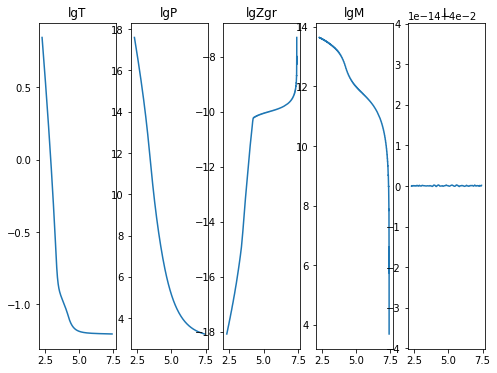

2020-12-06 04:55:33,561 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:55:34,631 __main__ 0/1 INFO :: Perturbation norm: 1.7404646040676994
2020-12-06 04:55:34,632 __main__ 0/1 INFO :: lgT iterate: 0.844929764779873
2020-12-06 04:55:34,633 __main__ 0/1 INFO :: lgP iterate: 17.581556452898536
2020-12-06 04:55:34,633 __main__ 0/1 INFO :: lgM iterate: 13.641074669074303
2020-12-06 04:55:34,634 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956945673
2020-12-06 04:55:34,636 __main__ 0/1 INFO :: m iterate: 5.5042563014140455e-05
2020-12-06 04:55:34,636 __main__ 0/1 INFO :: L iterate: 0.04


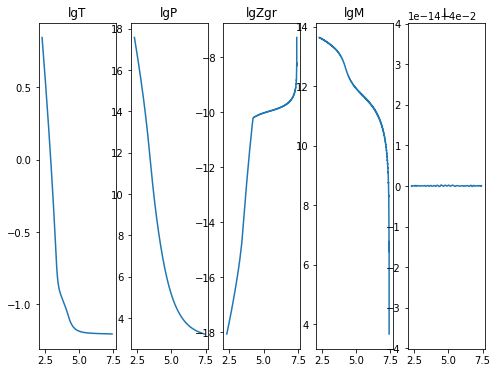

2020-12-06 04:55:38,273 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:55:39,114 __main__ 0/1 INFO :: Perturbation norm: 1.7404646038538973
2020-12-06 04:55:39,115 __main__ 0/1 INFO :: lgT iterate: 0.8455523060517284
2020-12-06 04:55:39,116 __main__ 0/1 INFO :: lgP iterate: 17.59681772025506
2020-12-06 04:55:39,117 __main__ 0/1 INFO :: lgM iterate: 13.641115571532128
2020-12-06 04:55:39,117 __main__ 0/1 INFO :: lgZgr iterate: -18.0842848950797
2020-12-06 04:55:39,118 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-12-06 04:55:39,119 __main__ 0/1 INFO :: L iterate: 0.040000000000000036


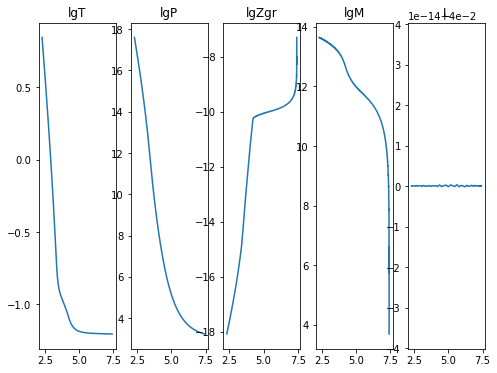

2020-12-06 04:55:42,815 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:55:43,793 __main__ 0/1 INFO :: Perturbation norm: 1.7404646035961622
2020-12-06 04:55:43,794 __main__ 0/1 INFO :: lgT iterate: 0.8449297647799611
2020-12-06 04:55:43,795 __main__ 0/1 INFO :: lgP iterate: 17.581556452900816
2020-12-06 04:55:43,796 __main__ 0/1 INFO :: lgM iterate: 13.641074669074806
2020-12-06 04:55:43,796 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956948153
2020-12-06 04:55:43,798 __main__ 0/1 INFO :: m iterate: 5.5042563014140455e-05
2020-12-06 04:55:43,798 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


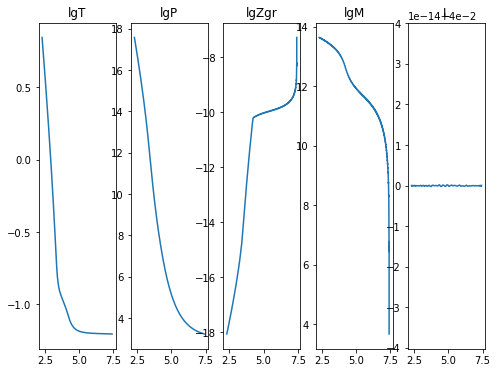

2020-12-06 04:55:47,414 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:55:48,242 __main__ 0/1 INFO :: Perturbation norm: 1.7404646034951978
2020-12-06 04:55:48,243 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516827
2020-12-06 04:55:48,244 __main__ 0/1 INFO :: lgP iterate: 17.59681772025401
2020-12-06 04:55:48,245 __main__ 0/1 INFO :: lgM iterate: 13.64111557153261
2020-12-06 04:55:48,245 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507906
2020-12-06 04:55:48,246 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-12-06 04:55:48,247 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


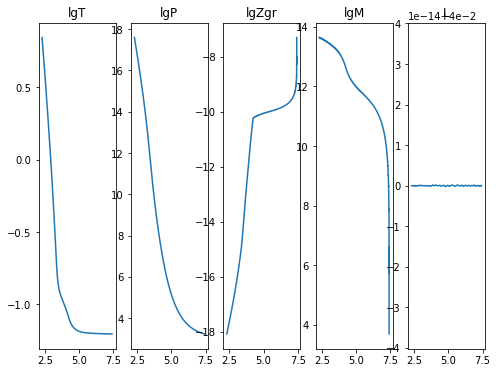

2020-12-06 04:55:51,987 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:55:53,045 __main__ 0/1 INFO :: Perturbation norm: 1.740464603374057
2020-12-06 04:55:53,050 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800027
2020-12-06 04:55:53,050 __main__ 0/1 INFO :: lgP iterate: 17.581556452901893
2020-12-06 04:55:53,051 __main__ 0/1 INFO :: lgM iterate: 13.641074669074982
2020-12-06 04:55:53,052 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495694927
2020-12-06 04:55:53,053 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 04:55:53,054 __main__ 0/1 INFO :: L iterate: 0.04


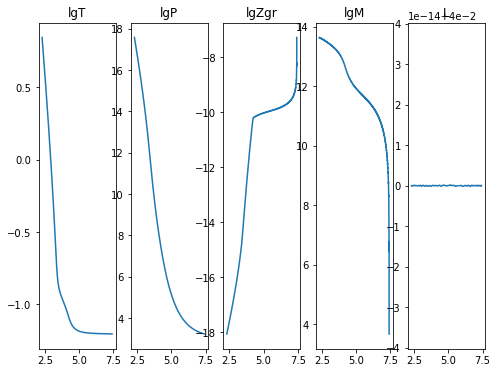

2020-12-06 04:55:56,768 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:55:57,631 __main__ 0/1 INFO :: Perturbation norm: 1.7404646033314592
2020-12-06 04:55:57,633 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516685
2020-12-06 04:55:57,634 __main__ 0/1 INFO :: lgP iterate: 17.596817720253625
2020-12-06 04:55:57,634 __main__ 0/1 INFO :: lgM iterate: 13.641115571532737
2020-12-06 04:55:57,635 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078778
2020-12-06 04:55:57,636 __main__ 0/1 INFO :: m iterate: 5.5876451733993804e-05
2020-12-06 04:55:57,637 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


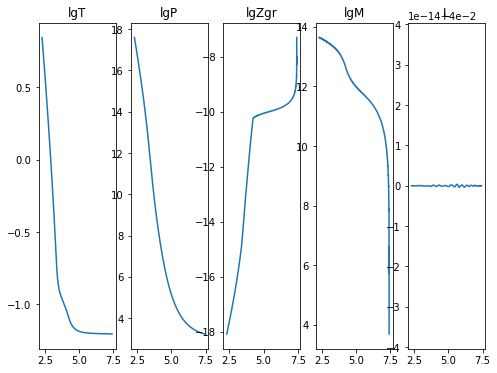

2020-12-06 04:56:01,491 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.1e+00/s
2020-12-06 04:56:02,921 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032781304
2020-12-06 04:56:02,922 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800229
2020-12-06 04:56:02,922 __main__ 0/1 INFO :: lgP iterate: 17.581556452902333
2020-12-06 04:56:02,925 __main__ 0/1 INFO :: lgM iterate: 13.641074669075104
2020-12-06 04:56:02,926 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956949777
2020-12-06 04:56:02,927 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-12-06 04:56:02,928 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


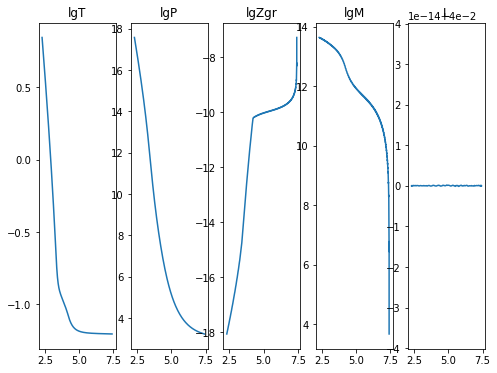

2020-12-06 04:56:07,568 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 2.0e+00/s
2020-12-06 04:56:08,679 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032598814
2020-12-06 04:56:08,689 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516581
2020-12-06 04:56:08,690 __main__ 0/1 INFO :: lgP iterate: 17.596817720253448
2020-12-06 04:56:08,691 __main__ 0/1 INFO :: lgM iterate: 13.641115571532957
2020-12-06 04:56:08,692 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078756
2020-12-06 04:56:08,693 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-12-06 04:56:08,694 __main__ 0/1 INFO :: L iterate: 0.04


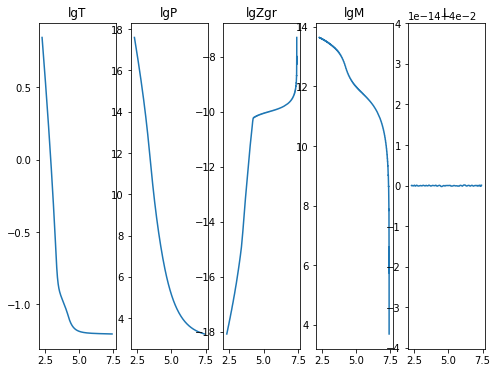

2020-12-06 04:56:12,351 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:56:13,310 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032371796
2020-12-06 04:56:13,311 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800296
2020-12-06 04:56:13,315 __main__ 0/1 INFO :: lgP iterate: 17.58155645290251
2020-12-06 04:56:13,318 __main__ 0/1 INFO :: lgM iterate: 13.641074669075081
2020-12-06 04:56:13,321 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956949926
2020-12-06 04:56:13,324 __main__ 0/1 INFO :: m iterate: 5.504256301147592e-05
2020-12-06 04:56:13,328 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


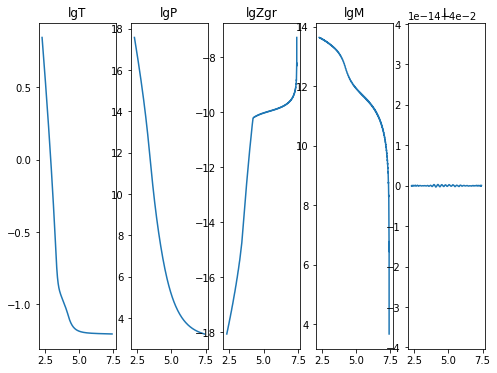

2020-12-06 04:56:16,927 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:56:17,726 __main__ 0/1 INFO :: Perturbation norm: 1.740464603229127
2020-12-06 04:56:17,728 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516554
2020-12-06 04:56:17,728 __main__ 0/1 INFO :: lgP iterate: 17.596817720253334
2020-12-06 04:56:17,729 __main__ 0/1 INFO :: lgM iterate: 13.641115571532916
2020-12-06 04:56:17,730 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078632
2020-12-06 04:56:17,731 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-12-06 04:56:17,732 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


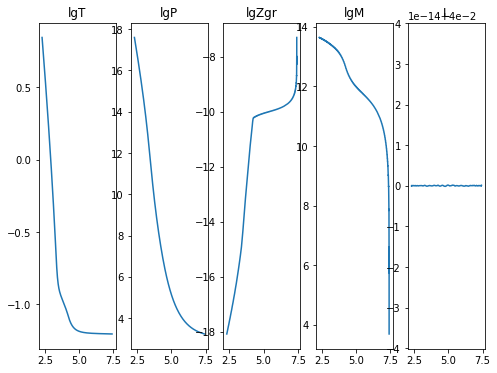

2020-12-06 04:56:21,406 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:56:22,383 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032192268
2020-12-06 04:56:22,384 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800322
2020-12-06 04:56:22,384 __main__ 0/1 INFO :: lgP iterate: 17.581556452902603
2020-12-06 04:56:22,385 __main__ 0/1 INFO :: lgM iterate: 13.64107466907512
2020-12-06 04:56:22,386 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950036
2020-12-06 04:56:22,386 __main__ 0/1 INFO :: m iterate: 5.5042563003482314e-05
2020-12-06 04:56:22,387 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


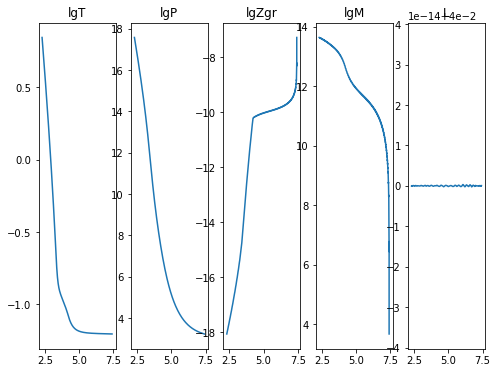

2020-12-06 04:56:26,006 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 04:56:26,871 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032155462
2020-12-06 04:56:26,872 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516532
2020-12-06 04:56:26,874 __main__ 0/1 INFO :: lgP iterate: 17.596817720253277
2020-12-06 04:56:26,875 __main__ 0/1 INFO :: lgM iterate: 13.64111557153294
2020-12-06 04:56:26,876 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507859
2020-12-06 04:56:26,877 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-12-06 04:56:26,878 __main__ 0/1 INFO :: L iterate: 0.04


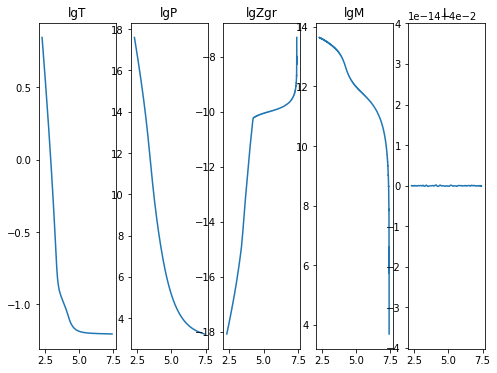

2020-12-06 04:56:30,482 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:56:31,463 __main__ 0/1 INFO :: Perturbation norm: 1.740464603211386
2020-12-06 04:56:31,464 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800309
2020-12-06 04:56:31,464 __main__ 0/1 INFO :: lgP iterate: 17.581556452902625
2020-12-06 04:56:31,465 __main__ 0/1 INFO :: lgM iterate: 13.641074669075106
2020-12-06 04:56:31,466 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950054
2020-12-06 04:56:31,467 __main__ 0/1 INFO :: m iterate: 5.504256300525867e-05
2020-12-06 04:56:31,467 __main__ 0/1 INFO :: L iterate: 0.04


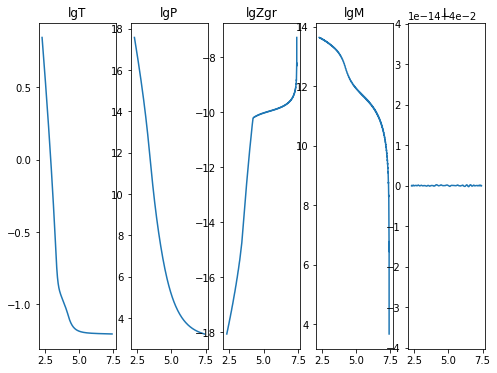

2020-12-06 04:56:35,355 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.6e+00/s
2020-12-06 04:56:36,753 __main__ 0/1 INFO :: Perturbation norm: 1.740464603209857
2020-12-06 04:56:36,754 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516523
2020-12-06 04:56:36,754 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 04:56:36,755 __main__ 0/1 INFO :: lgM iterate: 13.64111557153292
2020-12-06 04:56:36,756 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078593
2020-12-06 04:56:36,757 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-12-06 04:56:36,757 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


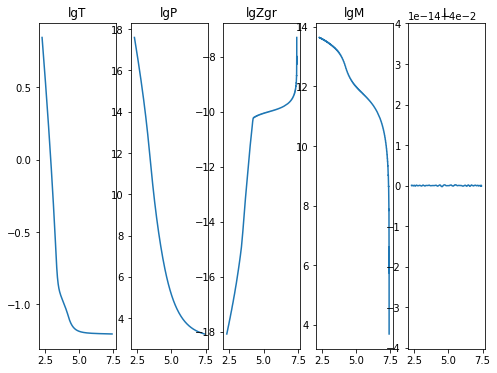

2020-12-06 04:56:41,114 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 04:56:42,260 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032075122
2020-12-06 04:56:42,261 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800372
2020-12-06 04:56:42,262 __main__ 0/1 INFO :: lgP iterate: 17.58155645290265
2020-12-06 04:56:42,262 __main__ 0/1 INFO :: lgM iterate: 13.64107466907513
2020-12-06 04:56:42,263 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950082
2020-12-06 04:56:42,264 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 04:56:42,265 __main__ 0/1 INFO :: L iterate: 0.04


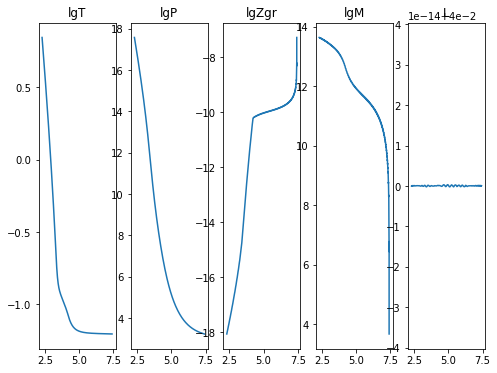

2020-12-06 04:56:45,953 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 04:56:46,760 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032063429
2020-12-06 04:56:46,761 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516523
2020-12-06 04:56:46,761 __main__ 0/1 INFO :: lgP iterate: 17.596817720253284
2020-12-06 04:56:46,762 __main__ 0/1 INFO :: lgM iterate: 13.641115571532993
2020-12-06 04:56:46,763 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-12-06 04:56:46,764 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-12-06 04:56:46,765 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


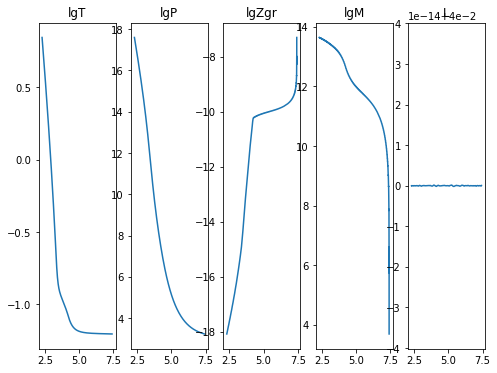

2020-12-06 04:56:50,417 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:56:51,403 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032052793
2020-12-06 04:56:51,404 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800339
2020-12-06 04:56:51,405 __main__ 0/1 INFO :: lgP iterate: 17.581556452902642
2020-12-06 04:56:51,406 __main__ 0/1 INFO :: lgM iterate: 13.641074669075063
2020-12-06 04:56:51,407 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950036
2020-12-06 04:56:51,408 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-12-06 04:56:51,409 __main__ 0/1 INFO :: L iterate: 0.04


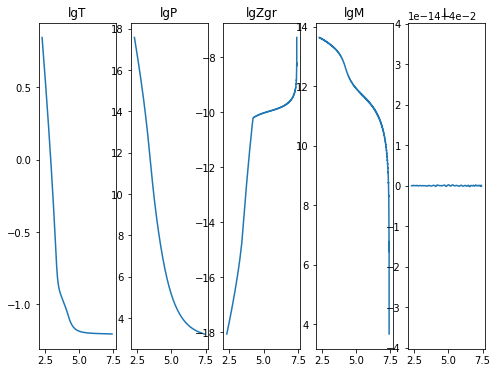

2020-12-06 04:56:55,086 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:56:55,965 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032048423
2020-12-06 04:56:55,966 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516543
2020-12-06 04:56:55,967 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 04:56:55,968 __main__ 0/1 INFO :: lgM iterate: 13.641115571532978
2020-12-06 04:56:55,969 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078632
2020-12-06 04:56:55,970 __main__ 0/1 INFO :: m iterate: 5.587645172422384e-05
2020-12-06 04:56:55,971 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


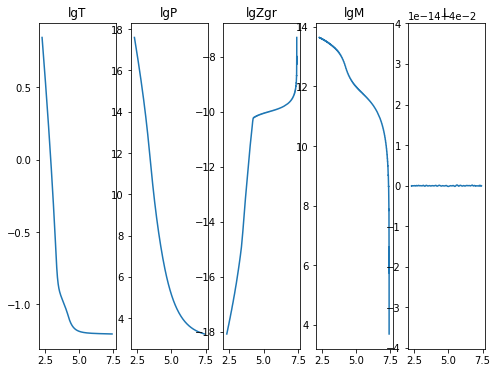

2020-12-06 04:57:00,109 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.9e+00/s
2020-12-06 04:57:01,390 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039297
2020-12-06 04:57:01,391 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800356
2020-12-06 04:57:01,392 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 04:57:01,393 __main__ 0/1 INFO :: lgM iterate: 13.641074669075145
2020-12-06 04:57:01,393 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950118
2020-12-06 04:57:01,394 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-12-06 04:57:01,395 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


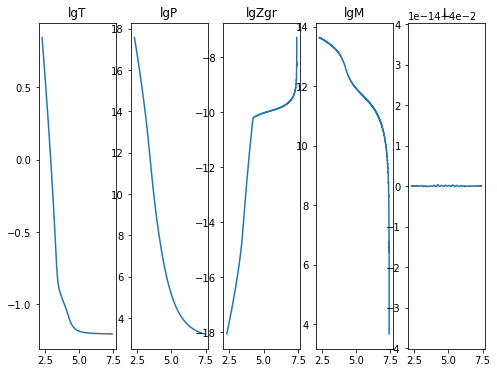

2020-12-06 04:57:06,076 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-12-06 04:57:07,296 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035422
2020-12-06 04:57:07,297 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516525
2020-12-06 04:57:07,298 __main__ 0/1 INFO :: lgP iterate: 17.59681772025327
2020-12-06 04:57:07,299 __main__ 0/1 INFO :: lgM iterate: 13.641115571532945
2020-12-06 04:57:07,300 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078593
2020-12-06 04:57:07,303 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-12-06 04:57:07,305 __main__ 0/1 INFO :: L iterate: 0.04


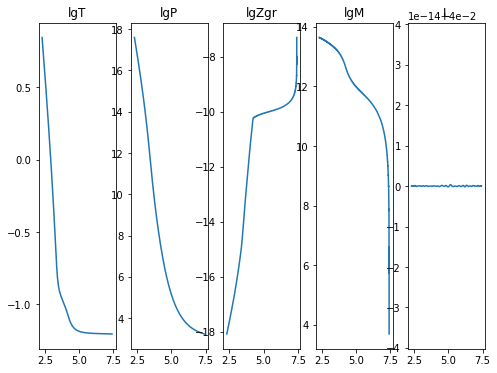

2020-12-06 04:57:11,490 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.0e+00/s
2020-12-06 04:57:12,492 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032032802
2020-12-06 04:57:12,493 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800352
2020-12-06 04:57:12,494 __main__ 0/1 INFO :: lgP iterate: 17.58155645290269
2020-12-06 04:57:12,495 __main__ 0/1 INFO :: lgM iterate: 13.641074669075142
2020-12-06 04:57:12,496 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950132
2020-12-06 04:57:12,497 __main__ 0/1 INFO :: m iterate: 5.5042563002594136e-05
2020-12-06 04:57:12,498 __main__ 0/1 INFO :: L iterate: 0.04


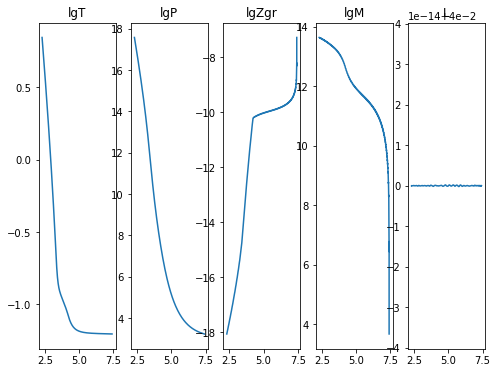

2020-12-06 04:57:17,396 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.9e+00/s
2020-12-06 04:57:19,176 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203394
2020-12-06 04:57:19,180 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516523
2020-12-06 04:57:19,183 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 04:57:19,187 __main__ 0/1 INFO :: lgM iterate: 13.641115571532938
2020-12-06 04:57:19,191 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078603
2020-12-06 04:57:19,196 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-12-06 04:57:19,200 __main__ 0/1 INFO :: L iterate: 0.039999999999999966


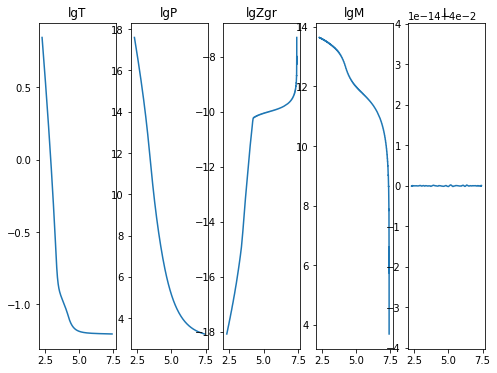

2020-12-06 04:57:23,208 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 04:57:24,235 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032030762
2020-12-06 04:57:24,236 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800382
2020-12-06 04:57:24,237 __main__ 0/1 INFO :: lgP iterate: 17.581556452902696
2020-12-06 04:57:24,238 __main__ 0/1 INFO :: lgM iterate: 13.641074669075103
2020-12-06 04:57:24,239 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950114
2020-12-06 04:57:24,240 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-12-06 04:57:24,240 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


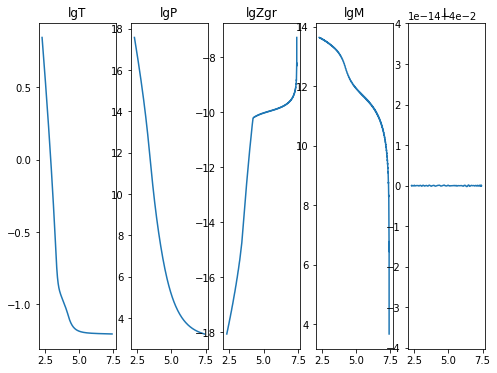

2020-12-06 04:57:27,914 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 04:57:28,727 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037314
2020-12-06 04:57:28,729 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516523
2020-12-06 04:57:28,729 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 04:57:28,730 __main__ 0/1 INFO :: lgM iterate: 13.641115571532893
2020-12-06 04:57:28,731 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078575
2020-12-06 04:57:28,732 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-12-06 04:57:28,733 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


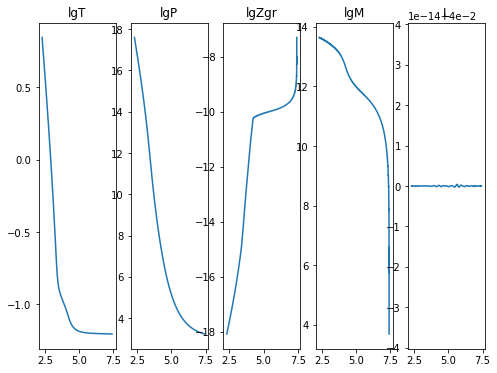

2020-12-06 04:57:32,467 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 04:57:33,461 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032047064
2020-12-06 04:57:33,462 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800352
2020-12-06 04:57:33,462 __main__ 0/1 INFO :: lgP iterate: 17.581556452902653
2020-12-06 04:57:33,463 __main__ 0/1 INFO :: lgM iterate: 13.641074669075085
2020-12-06 04:57:33,464 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695006
2020-12-06 04:57:33,465 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-12-06 04:57:33,466 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


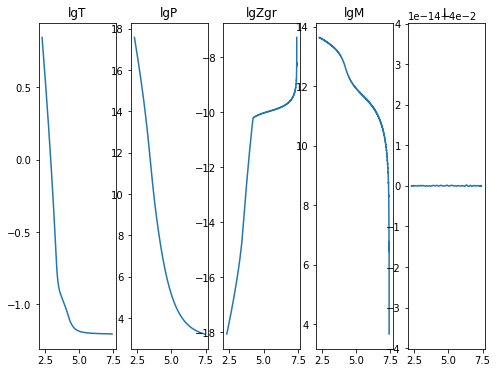

2020-12-06 04:57:37,752 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.0e+00/s
2020-12-06 04:57:38,976 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204294
2020-12-06 04:57:38,977 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516528
2020-12-06 04:57:38,978 __main__ 0/1 INFO :: lgP iterate: 17.596817720253263
2020-12-06 04:57:38,980 __main__ 0/1 INFO :: lgM iterate: 13.641115571532897
2020-12-06 04:57:38,982 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078543
2020-12-06 04:57:38,983 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 04:57:38,984 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


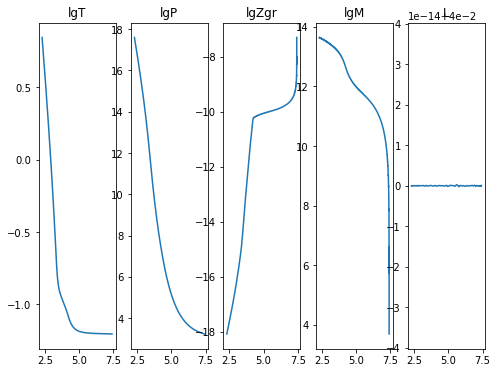

2020-12-06 04:57:44,297 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.8e+00/s
2020-12-06 04:57:45,337 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042774
2020-12-06 04:57:45,338 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800338
2020-12-06 04:57:45,339 __main__ 0/1 INFO :: lgP iterate: 17.58155645290265
2020-12-06 04:57:45,339 __main__ 0/1 INFO :: lgM iterate: 13.641074669075103
2020-12-06 04:57:45,340 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950068
2020-12-06 04:57:45,341 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-12-06 04:57:45,342 __main__ 0/1 INFO :: L iterate: 0.04


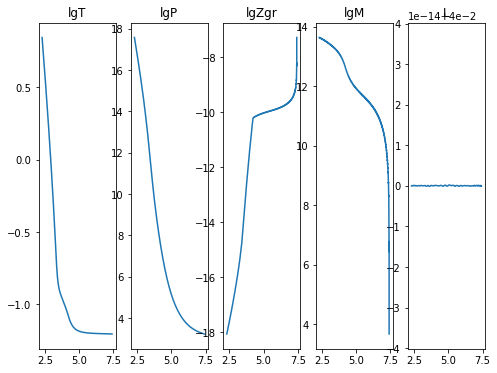

2020-12-06 04:57:49,703 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 2.0e+00/s
2020-12-06 04:57:53,164 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043392
2020-12-06 04:57:53,165 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516537
2020-12-06 04:57:53,166 __main__ 0/1 INFO :: lgP iterate: 17.59681772025331
2020-12-06 04:57:53,167 __main__ 0/1 INFO :: lgM iterate: 13.641115571532932
2020-12-06 04:57:53,168 __main__ 0/1 INFO :: lgZgr iterate: -18.0842848950786
2020-12-06 04:57:53,181 __main__ 0/1 INFO :: m iterate: 5.58764517260002e-05
2020-12-06 04:57:53,185 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


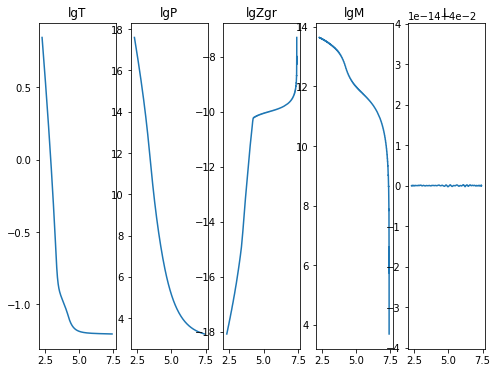

2020-12-06 04:57:58,424 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.1e+00/s
2020-12-06 04:58:01,081 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039304
2020-12-06 04:58:01,083 __main__ 0/1 INFO :: lgT iterate: 0.844929764780038
2020-12-06 04:58:01,083 __main__ 0/1 INFO :: lgP iterate: 17.581556452902685
2020-12-06 04:58:01,084 __main__ 0/1 INFO :: lgM iterate: 13.64107466907518
2020-12-06 04:58:01,085 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950153
2020-12-06 04:58:01,086 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 04:58:01,087 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


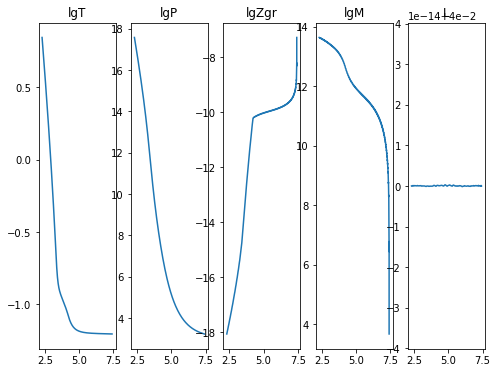

2020-12-06 04:58:05,739 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.5e+00/s
2020-12-06 04:58:09,441 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039113
2020-12-06 04:58:09,443 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516537
2020-12-06 04:58:09,444 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-12-06 04:58:09,445 __main__ 0/1 INFO :: lgM iterate: 13.641115571532954
2020-12-06 04:58:09,446 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-12-06 04:58:09,446 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-12-06 04:58:09,447 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


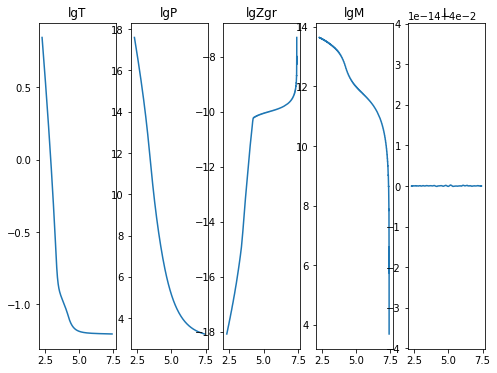

2020-12-06 04:58:13,721 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-12-06 04:58:15,618 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038094
2020-12-06 04:58:15,619 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800366
2020-12-06 04:58:15,620 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-12-06 04:58:15,645 __main__ 0/1 INFO :: lgM iterate: 13.641074669075094
2020-12-06 04:58:15,650 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-12-06 04:58:15,653 __main__ 0/1 INFO :: m iterate: 5.50425630123641e-05
2020-12-06 04:58:15,656 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


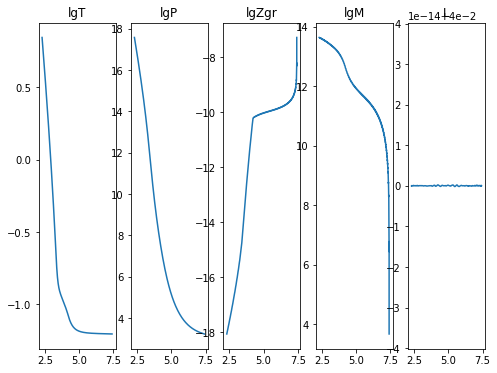

2020-12-06 04:58:19,877 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-12-06 04:58:22,445 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038729
2020-12-06 04:58:22,446 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516524
2020-12-06 04:58:22,447 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-12-06 04:58:22,447 __main__ 0/1 INFO :: lgM iterate: 13.641115571532916
2020-12-06 04:58:22,448 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-12-06 04:58:22,449 __main__ 0/1 INFO :: m iterate: 5.587645173754652e-05
2020-12-06 04:58:22,450 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


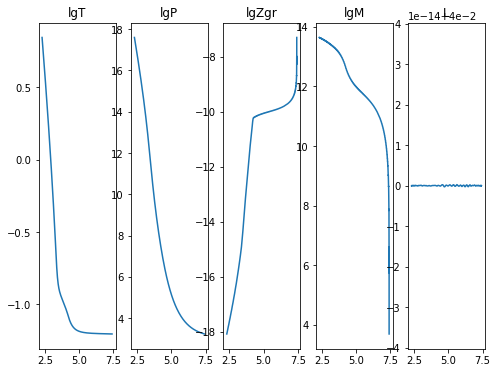

2020-12-06 04:58:26,676 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-12-06 04:58:29,077 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039264
2020-12-06 04:58:29,082 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800363
2020-12-06 04:58:29,085 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-12-06 04:58:29,088 __main__ 0/1 INFO :: lgM iterate: 13.641074669075122
2020-12-06 04:58:29,090 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-12-06 04:58:29,093 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-12-06 04:58:29,096 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


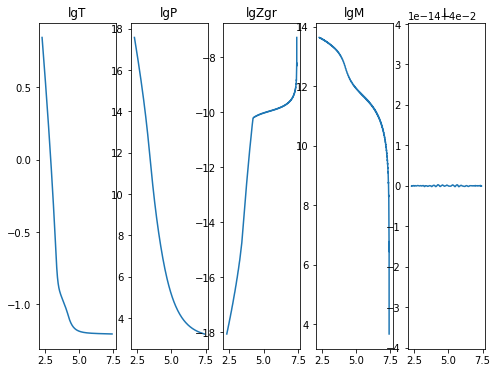

2020-12-06 04:58:33,197 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-12-06 04:58:35,636 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032030742
2020-12-06 04:58:35,637 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-12-06 04:58:35,638 __main__ 0/1 INFO :: lgP iterate: 17.596817720253284
2020-12-06 04:58:35,639 __main__ 0/1 INFO :: lgM iterate: 13.64111557153292
2020-12-06 04:58:35,640 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507859
2020-12-06 04:58:35,641 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-12-06 04:58:35,642 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


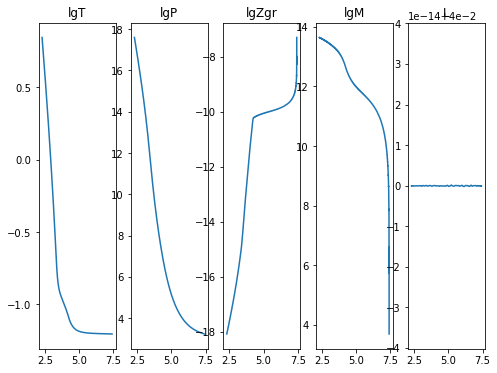

2020-12-06 04:58:39,887 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-12-06 04:58:42,159 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032019957
2020-12-06 04:58:42,160 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800375
2020-12-06 04:58:42,161 __main__ 0/1 INFO :: lgP iterate: 17.581556452902692
2020-12-06 04:58:42,162 __main__ 0/1 INFO :: lgM iterate: 13.641074669075099
2020-12-06 04:58:42,163 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-12-06 04:58:42,166 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-12-06 04:58:42,167 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


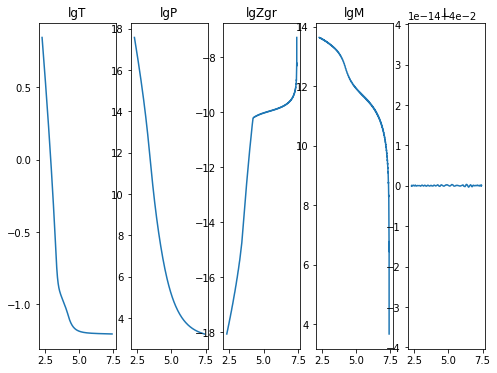

2020-12-06 04:58:46,416 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-12-06 04:58:49,198 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032020472
2020-12-06 04:58:49,199 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516531
2020-12-06 04:58:49,199 __main__ 0/1 INFO :: lgP iterate: 17.59681772025328
2020-12-06 04:58:49,200 __main__ 0/1 INFO :: lgM iterate: 13.641115571532955
2020-12-06 04:58:49,201 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507859
2020-12-06 04:58:49,203 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-12-06 04:58:49,204 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


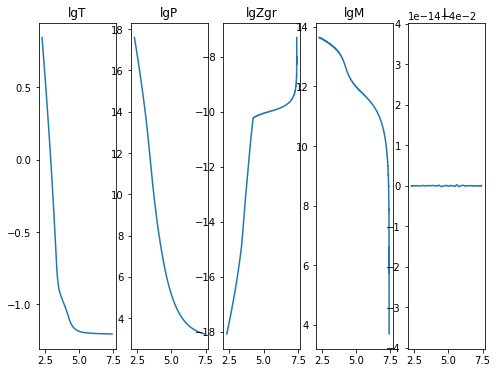

2020-12-06 04:58:53,343 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-12-06 04:58:55,263 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032028694
2020-12-06 04:58:55,265 __main__ 0/1 INFO :: lgT iterate: 0.844929764780036
2020-12-06 04:58:55,266 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 04:58:55,267 __main__ 0/1 INFO :: lgM iterate: 13.641074669075108
2020-12-06 04:58:55,268 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-12-06 04:58:55,269 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-12-06 04:58:55,270 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


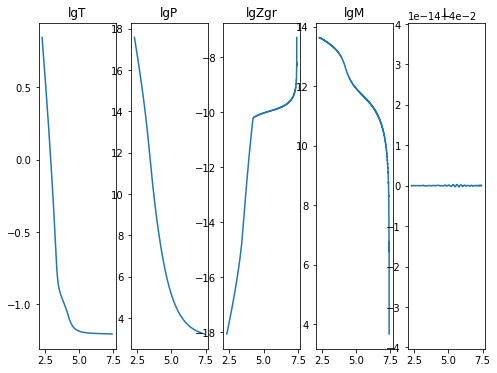

2020-12-06 04:58:59,465 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-12-06 04:59:02,186 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203778
2020-12-06 04:59:02,188 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516537
2020-12-06 04:59:02,189 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-12-06 04:59:02,190 __main__ 0/1 INFO :: lgM iterate: 13.641115571532927
2020-12-06 04:59:02,191 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078596
2020-12-06 04:59:02,191 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-12-06 04:59:02,192 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


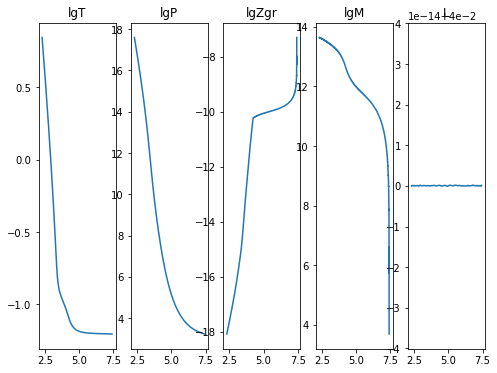

2020-12-06 04:59:06,474 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-12-06 04:59:09,036 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204193
2020-12-06 04:59:09,037 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800348
2020-12-06 04:59:09,037 __main__ 0/1 INFO :: lgP iterate: 17.581556452902678
2020-12-06 04:59:09,050 __main__ 0/1 INFO :: lgM iterate: 13.641074669075095
2020-12-06 04:59:09,072 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-12-06 04:59:09,077 __main__ 0/1 INFO :: m iterate: 5.504256300525867e-05
2020-12-06 04:59:09,084 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


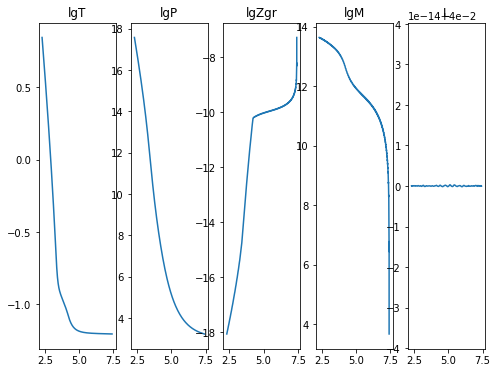

2020-12-06 04:59:13,264 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-12-06 04:59:15,788 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204201
2020-12-06 04:59:15,789 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516531
2020-12-06 04:59:15,790 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 04:59:15,791 __main__ 0/1 INFO :: lgM iterate: 13.641115571532946
2020-12-06 04:59:15,792 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-12-06 04:59:15,793 __main__ 0/1 INFO :: m iterate: 5.58764517260002e-05
2020-12-06 04:59:15,802 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


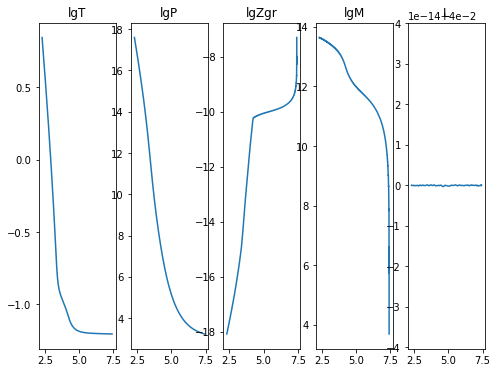

2020-12-06 04:59:20,279 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-12-06 04:59:22,635 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044453
2020-12-06 04:59:22,636 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800359
2020-12-06 04:59:22,640 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-12-06 04:59:22,650 __main__ 0/1 INFO :: lgM iterate: 13.641074669075072
2020-12-06 04:59:22,653 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950068
2020-12-06 04:59:22,656 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-12-06 04:59:22,657 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


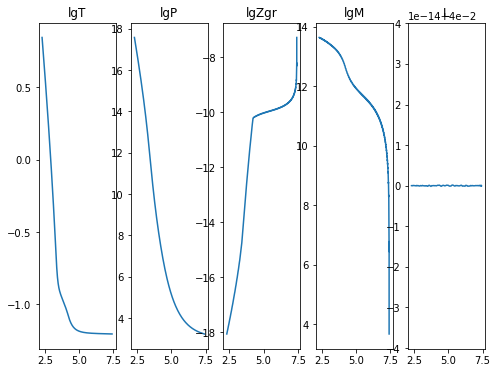

2020-12-06 04:59:26,910 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-12-06 04:59:29,471 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032048796
2020-12-06 04:59:29,472 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516519
2020-12-06 04:59:29,473 __main__ 0/1 INFO :: lgP iterate: 17.596817720253323
2020-12-06 04:59:29,490 __main__ 0/1 INFO :: lgM iterate: 13.641115571532952
2020-12-06 04:59:29,492 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078646
2020-12-06 04:59:29,493 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 04:59:29,494 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


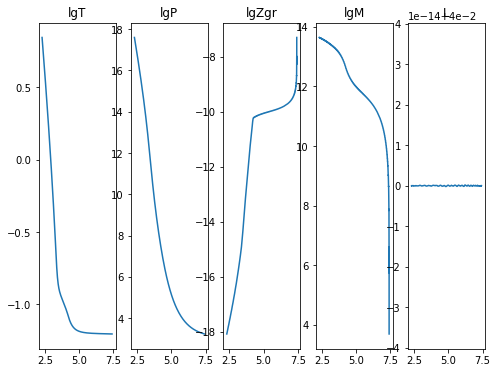

2020-12-06 04:59:33,914 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.1e+00/s
2020-12-06 04:59:35,977 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032052364
2020-12-06 04:59:35,979 __main__ 0/1 INFO :: lgT iterate: 0.844929764780034
2020-12-06 04:59:35,980 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-12-06 04:59:35,980 __main__ 0/1 INFO :: lgM iterate: 13.641074669075135
2020-12-06 04:59:35,981 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950107
2020-12-06 04:59:35,983 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 04:59:35,983 __main__ 0/1 INFO :: L iterate: 0.04


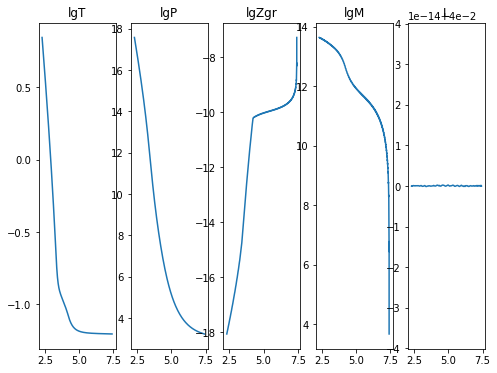

2020-12-06 04:59:40,263 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-12-06 04:59:42,751 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046482
2020-12-06 04:59:42,752 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516521
2020-12-06 04:59:42,754 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-12-06 04:59:42,755 __main__ 0/1 INFO :: lgM iterate: 13.641115571532954
2020-12-06 04:59:42,756 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078614
2020-12-06 04:59:42,764 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-12-06 04:59:42,768 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


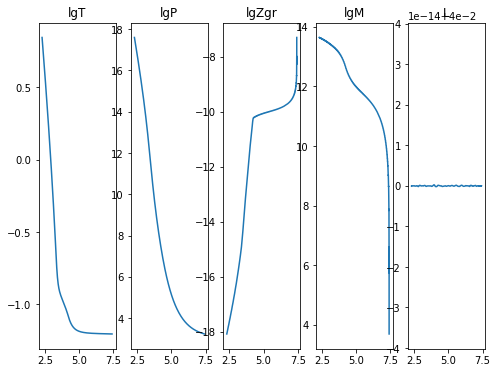

2020-12-06 04:59:47,038 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-12-06 04:59:48,606 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043933
2020-12-06 04:59:48,607 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800365
2020-12-06 04:59:48,608 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-12-06 04:59:48,609 __main__ 0/1 INFO :: lgM iterate: 13.641074669075142
2020-12-06 04:59:48,610 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950103
2020-12-06 04:59:48,612 __main__ 0/1 INFO :: m iterate: 5.504256300437049e-05
2020-12-06 04:59:48,613 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


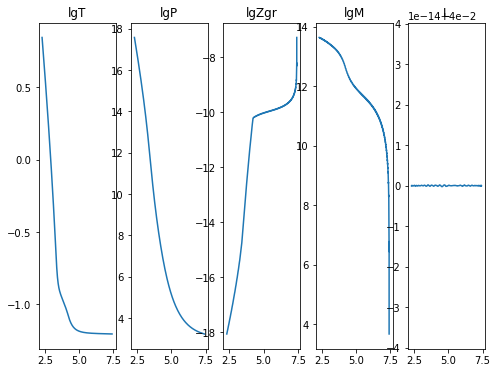

2020-12-06 04:59:52,842 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-12-06 04:59:55,822 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044924
2020-12-06 04:59:55,823 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516532
2020-12-06 04:59:55,824 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 04:59:55,825 __main__ 0/1 INFO :: lgM iterate: 13.641115571532941
2020-12-06 04:59:55,826 __main__ 0/1 INFO :: lgZgr iterate: -18.0842848950786
2020-12-06 04:59:55,827 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-12-06 04:59:55,828 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


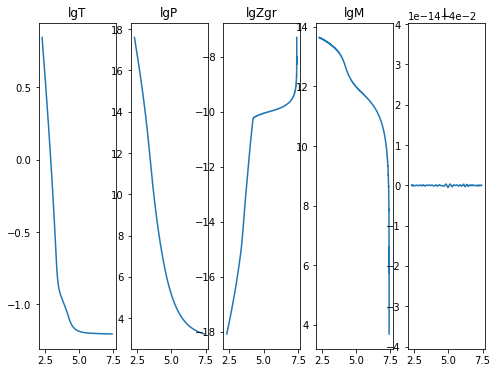

2020-12-06 05:00:00,151 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-12-06 05:00:02,560 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044089
2020-12-06 05:00:02,562 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800351
2020-12-06 05:00:02,563 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-12-06 05:00:02,564 __main__ 0/1 INFO :: lgM iterate: 13.641074669075126
2020-12-06 05:00:02,565 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-12-06 05:00:02,566 __main__ 0/1 INFO :: m iterate: 5.504256300081778e-05
2020-12-06 05:00:02,567 __main__ 0/1 INFO :: L iterate: 0.04


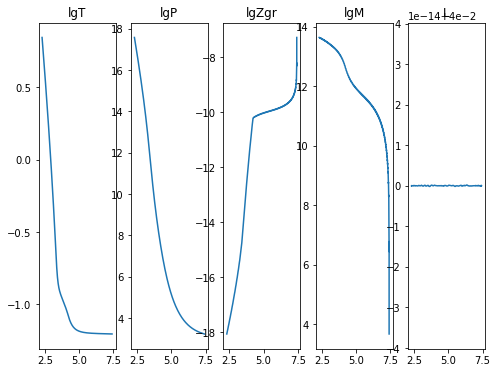

2020-12-06 05:00:06,764 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-12-06 05:00:09,126 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046427
2020-12-06 05:00:09,127 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516534
2020-12-06 05:00:09,128 __main__ 0/1 INFO :: lgP iterate: 17.596817720253327
2020-12-06 05:00:09,129 __main__ 0/1 INFO :: lgM iterate: 13.641115571532946
2020-12-06 05:00:09,130 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078632
2020-12-06 05:00:09,131 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-12-06 05:00:09,132 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


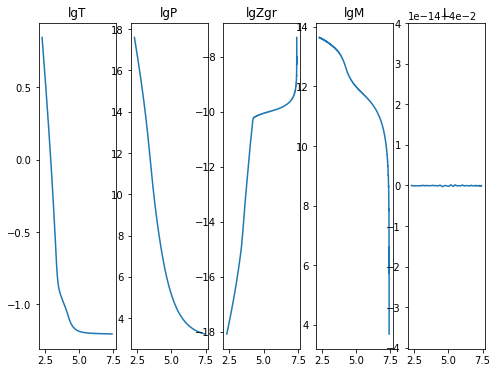

2020-12-06 05:00:13,409 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-12-06 05:00:15,245 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044089
2020-12-06 05:00:15,246 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800382
2020-12-06 05:00:15,247 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 05:00:15,248 __main__ 0/1 INFO :: lgM iterate: 13.641074669075095
2020-12-06 05:00:15,249 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950086
2020-12-06 05:00:15,250 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-12-06 05:00:15,251 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


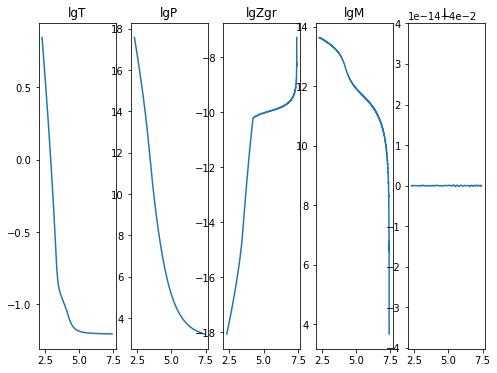

2020-12-06 05:00:19,538 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-12-06 05:00:21,890 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046058
2020-12-06 05:00:21,892 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-12-06 05:00:21,892 __main__ 0/1 INFO :: lgP iterate: 17.596817720253323
2020-12-06 05:00:21,893 __main__ 0/1 INFO :: lgM iterate: 13.64111557153298
2020-12-06 05:00:21,895 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507866
2020-12-06 05:00:21,896 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-12-06 05:00:21,897 __main__ 0/1 INFO :: L iterate: 0.04


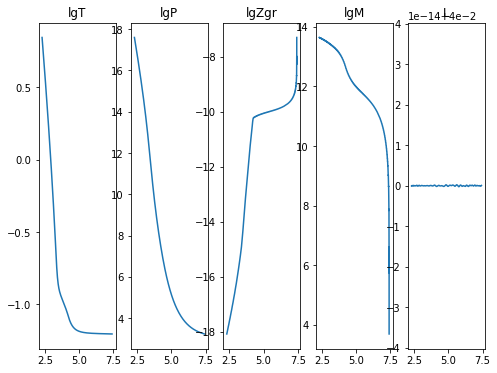

2020-12-06 05:00:26,201 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-12-06 05:00:27,840 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032052964
2020-12-06 05:00:27,858 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800345
2020-12-06 05:00:27,859 __main__ 0/1 INFO :: lgP iterate: 17.58155645290264
2020-12-06 05:00:27,870 __main__ 0/1 INFO :: lgM iterate: 13.641074669075088
2020-12-06 05:00:27,871 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950047
2020-12-06 05:00:27,873 __main__ 0/1 INFO :: m iterate: 5.5042563002594136e-05
2020-12-06 05:00:27,876 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


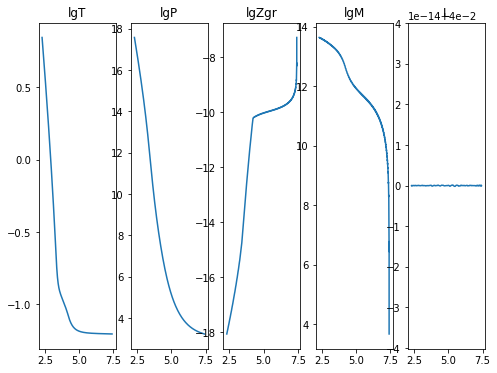

2020-12-06 05:00:31,680 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:00:32,848 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032048974
2020-12-06 05:00:32,849 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516532
2020-12-06 05:00:32,851 __main__ 0/1 INFO :: lgP iterate: 17.596817720253316
2020-12-06 05:00:32,853 __main__ 0/1 INFO :: lgM iterate: 13.641115571532982
2020-12-06 05:00:32,854 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078653
2020-12-06 05:00:32,856 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-12-06 05:00:32,857 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


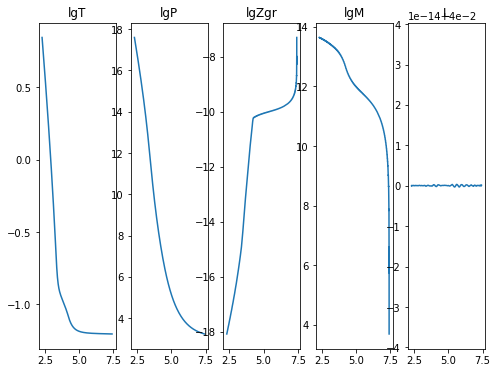

2020-12-06 05:00:36,715 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:00:38,005 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032045616
2020-12-06 05:00:38,006 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800355
2020-12-06 05:00:38,006 __main__ 0/1 INFO :: lgP iterate: 17.581556452902657
2020-12-06 05:00:38,007 __main__ 0/1 INFO :: lgM iterate: 13.64107466907507
2020-12-06 05:00:38,008 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950054
2020-12-06 05:00:38,009 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-12-06 05:00:38,010 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


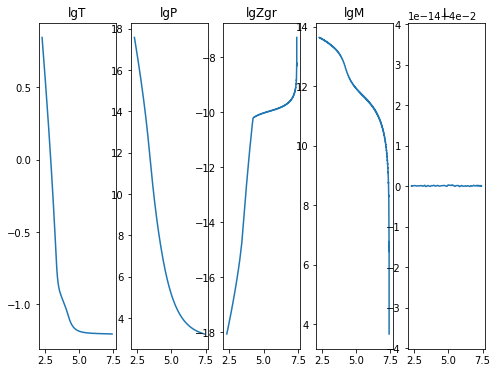

2020-12-06 05:00:41,867 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:00:42,706 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042803
2020-12-06 05:00:42,708 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-12-06 05:00:42,709 __main__ 0/1 INFO :: lgP iterate: 17.59681772025331
2020-12-06 05:00:42,709 __main__ 0/1 INFO :: lgM iterate: 13.641115571532941
2020-12-06 05:00:42,710 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-12-06 05:00:42,711 __main__ 0/1 INFO :: m iterate: 5.5876451733993804e-05
2020-12-06 05:00:42,712 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


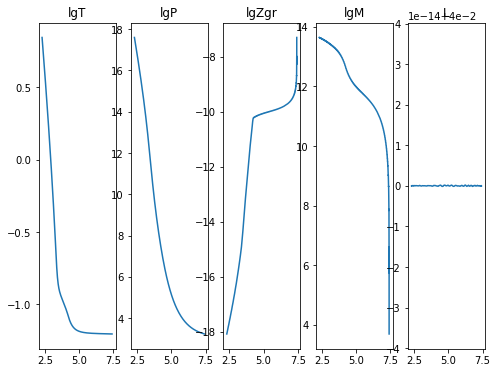

2020-12-06 05:00:46,602 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:00:47,582 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039282
2020-12-06 05:00:47,583 __main__ 0/1 INFO :: lgT iterate: 0.844929764780035
2020-12-06 05:00:47,584 __main__ 0/1 INFO :: lgP iterate: 17.581556452902646
2020-12-06 05:00:47,584 __main__ 0/1 INFO :: lgM iterate: 13.641074669075095
2020-12-06 05:00:47,585 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950064
2020-12-06 05:00:47,586 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 05:00:47,587 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


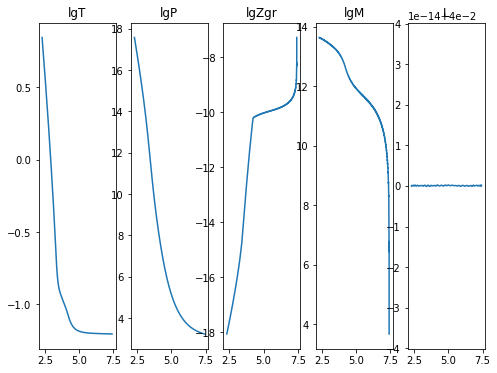

2020-12-06 05:00:51,376 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:00:52,198 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039013
2020-12-06 05:00:52,199 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516527
2020-12-06 05:00:52,200 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-12-06 05:00:52,201 __main__ 0/1 INFO :: lgM iterate: 13.641115571532934
2020-12-06 05:00:52,201 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-12-06 05:00:52,202 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-12-06 05:00:52,203 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


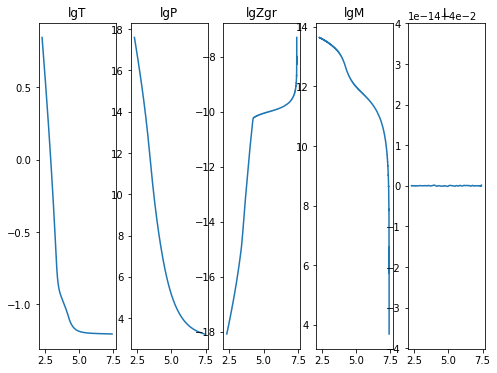

2020-12-06 05:00:55,808 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:00:56,789 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038602
2020-12-06 05:00:56,790 __main__ 0/1 INFO :: lgT iterate: 0.844929764780034
2020-12-06 05:00:56,791 __main__ 0/1 INFO :: lgP iterate: 17.58155645290265
2020-12-06 05:00:56,792 __main__ 0/1 INFO :: lgM iterate: 13.641074669075113
2020-12-06 05:00:56,793 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695008
2020-12-06 05:00:56,794 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 05:00:56,795 __main__ 0/1 INFO :: L iterate: 0.04


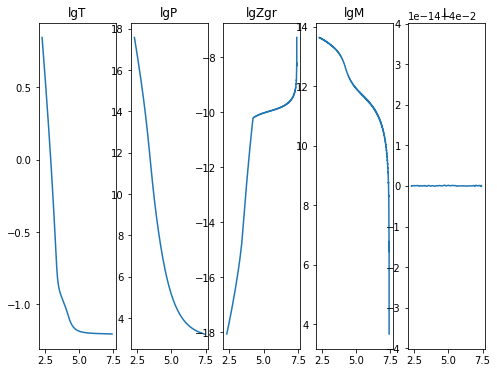

2020-12-06 05:01:00,402 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:01:01,255 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203357
2020-12-06 05:01:01,257 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516527
2020-12-06 05:01:01,257 __main__ 0/1 INFO :: lgP iterate: 17.596817720253284
2020-12-06 05:01:01,258 __main__ 0/1 INFO :: lgM iterate: 13.641115571532934
2020-12-06 05:01:01,259 __main__ 0/1 INFO :: lgZgr iterate: -18.0842848950786
2020-12-06 05:01:01,260 __main__ 0/1 INFO :: m iterate: 5.587645172333566e-05
2020-12-06 05:01:01,260 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


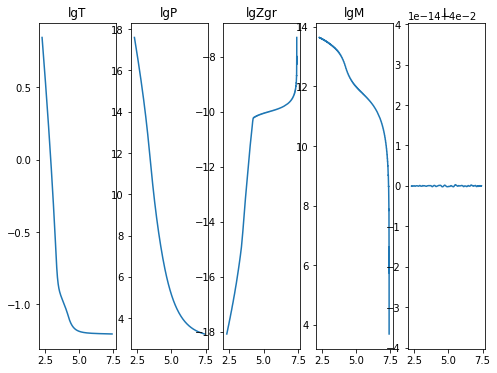

2020-12-06 05:01:05,137 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:01:06,195 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032029747
2020-12-06 05:01:06,196 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800377
2020-12-06 05:01:06,197 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-12-06 05:01:06,198 __main__ 0/1 INFO :: lgM iterate: 13.64107466907511
2020-12-06 05:01:06,199 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-12-06 05:01:06,200 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-12-06 05:01:06,200 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


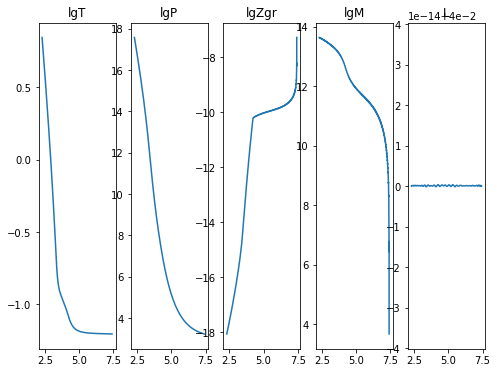

2020-12-06 05:01:09,997 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:01:10,839 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032032969
2020-12-06 05:01:10,840 __main__ 0/1 INFO :: lgT iterate: 0.845552306051652
2020-12-06 05:01:10,841 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 05:01:10,842 __main__ 0/1 INFO :: lgM iterate: 13.64111557153296
2020-12-06 05:01:10,843 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507862
2020-12-06 05:01:10,844 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-12-06 05:01:10,845 __main__ 0/1 INFO :: L iterate: 0.039999999999999966


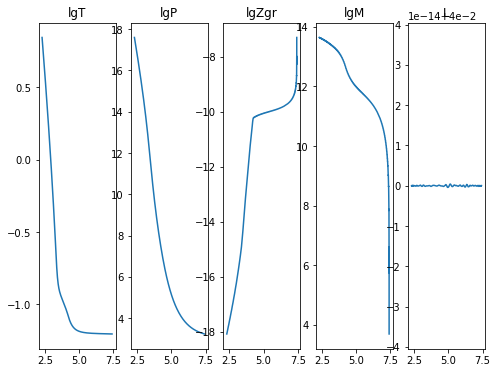

2020-12-06 05:01:14,616 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:01:15,621 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203411
2020-12-06 05:01:15,622 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800376
2020-12-06 05:01:15,623 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-12-06 05:01:15,624 __main__ 0/1 INFO :: lgM iterate: 13.641074669075111
2020-12-06 05:01:15,625 __main__ 0/1 INFO :: lgZgr iterate: -18.0699249569501
2020-12-06 05:01:15,626 __main__ 0/1 INFO :: m iterate: 5.50425630123641e-05
2020-12-06 05:01:15,627 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


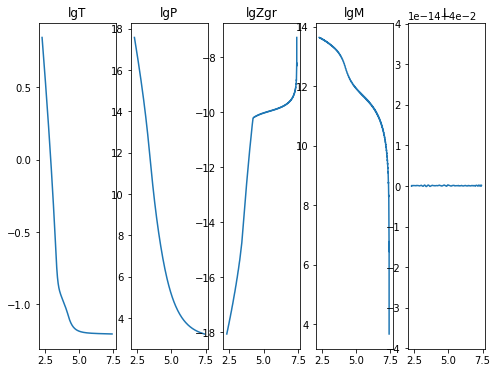

2020-12-06 05:01:19,462 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:01:20,326 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032036224
2020-12-06 05:01:20,327 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516531
2020-12-06 05:01:20,328 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-12-06 05:01:20,329 __main__ 0/1 INFO :: lgM iterate: 13.641115571533003
2020-12-06 05:01:20,330 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507864
2020-12-06 05:01:20,331 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 05:01:20,332 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


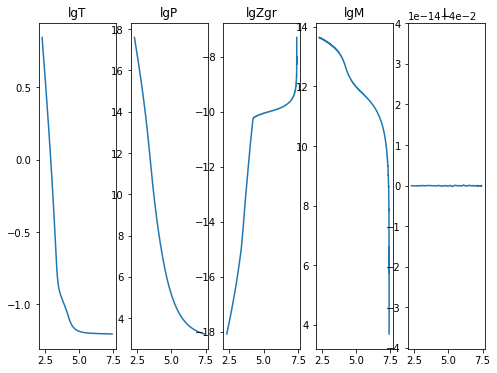

2020-12-06 05:01:24,256 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:01:25,317 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037077
2020-12-06 05:01:25,318 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800378
2020-12-06 05:01:25,319 __main__ 0/1 INFO :: lgP iterate: 17.581556452902696
2020-12-06 05:01:25,320 __main__ 0/1 INFO :: lgM iterate: 13.641074669075115
2020-12-06 05:01:25,321 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950125
2020-12-06 05:01:25,322 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-12-06 05:01:25,323 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


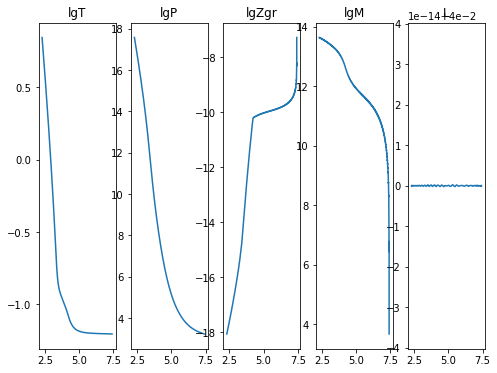

2020-12-06 05:01:29,113 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:01:29,971 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038067
2020-12-06 05:01:29,973 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516528
2020-12-06 05:01:29,974 __main__ 0/1 INFO :: lgP iterate: 17.596817720253284
2020-12-06 05:01:29,975 __main__ 0/1 INFO :: lgM iterate: 13.641115571532932
2020-12-06 05:01:29,975 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078596
2020-12-06 05:01:29,976 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-12-06 05:01:29,977 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


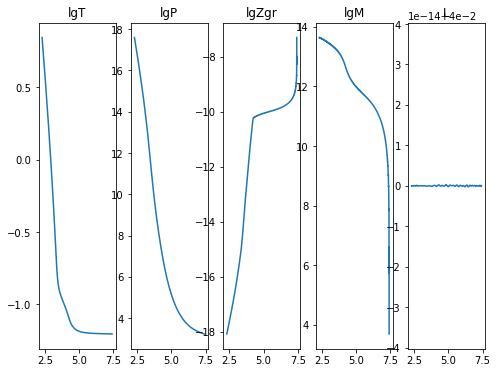

2020-12-06 05:01:33,755 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:01:34,738 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041313
2020-12-06 05:01:34,739 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800365
2020-12-06 05:01:34,740 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-12-06 05:01:34,741 __main__ 0/1 INFO :: lgM iterate: 13.641074669075119
2020-12-06 05:01:34,742 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-12-06 05:01:34,743 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-12-06 05:01:34,744 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


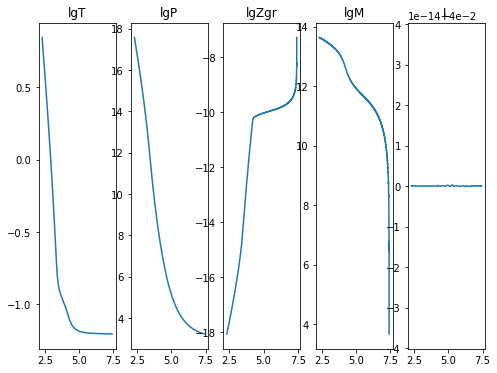

2020-12-06 05:01:38,511 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:01:39,337 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043463
2020-12-06 05:01:39,338 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516532
2020-12-06 05:01:39,339 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-12-06 05:01:39,340 __main__ 0/1 INFO :: lgM iterate: 13.641115571532925
2020-12-06 05:01:39,340 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078607
2020-12-06 05:01:39,342 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-12-06 05:01:39,343 __main__ 0/1 INFO :: L iterate: 0.03999999999999995


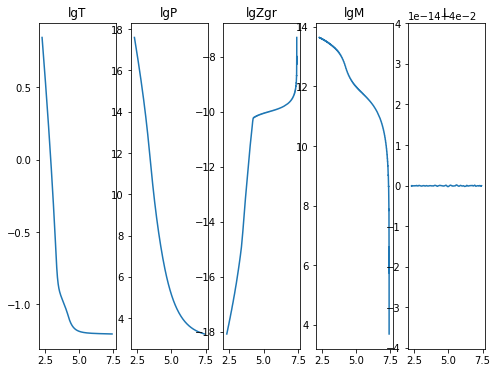

2020-12-06 05:01:43,081 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:01:44,105 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204713
2020-12-06 05:01:44,106 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800349
2020-12-06 05:01:44,107 __main__ 0/1 INFO :: lgP iterate: 17.581556452902653
2020-12-06 05:01:44,107 __main__ 0/1 INFO :: lgM iterate: 13.641074669075115
2020-12-06 05:01:44,108 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950075
2020-12-06 05:01:44,109 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-12-06 05:01:44,110 __main__ 0/1 INFO :: L iterate: 0.04


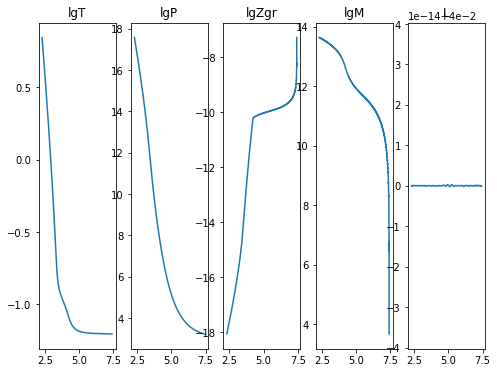

2020-12-06 05:01:47,760 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:01:48,535 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038764
2020-12-06 05:01:48,536 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516538
2020-12-06 05:01:48,537 __main__ 0/1 INFO :: lgP iterate: 17.596817720253302
2020-12-06 05:01:48,538 __main__ 0/1 INFO :: lgM iterate: 13.641115571532946
2020-12-06 05:01:48,539 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-12-06 05:01:48,540 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-12-06 05:01:48,541 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


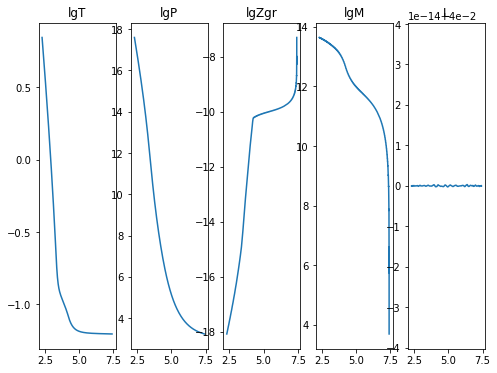

2020-12-06 05:01:52,195 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:01:53,154 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032029099
2020-12-06 05:01:53,155 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800371
2020-12-06 05:01:53,156 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 05:01:53,157 __main__ 0/1 INFO :: lgM iterate: 13.641074669075103
2020-12-06 05:01:53,158 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-12-06 05:01:53,160 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-12-06 05:01:53,161 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


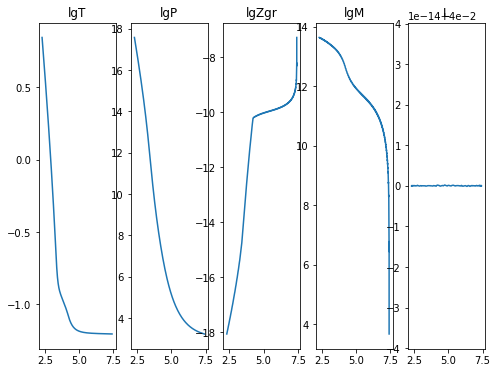

2020-12-06 05:01:56,831 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:01:57,687 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032030595
2020-12-06 05:01:57,688 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516523
2020-12-06 05:01:57,689 __main__ 0/1 INFO :: lgP iterate: 17.596817720253277
2020-12-06 05:01:57,689 __main__ 0/1 INFO :: lgM iterate: 13.641115571532927
2020-12-06 05:01:57,690 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078575
2020-12-06 05:01:57,691 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 05:01:57,692 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


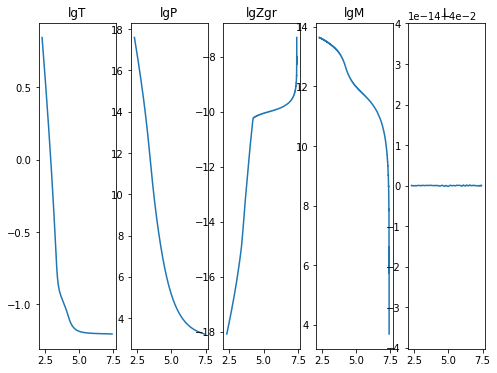

2020-12-06 05:02:01,411 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:02:02,385 __main__ 0/1 INFO :: Perturbation norm: 1.74046460320334
2020-12-06 05:02:02,386 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800366
2020-12-06 05:02:02,387 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 05:02:02,388 __main__ 0/1 INFO :: lgM iterate: 13.641074669075099
2020-12-06 05:02:02,388 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950082
2020-12-06 05:02:02,389 __main__ 0/1 INFO :: m iterate: 5.5042563014140455e-05
2020-12-06 05:02:02,390 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


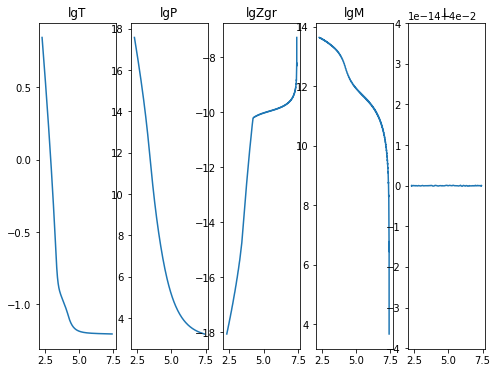

2020-12-06 05:02:06,006 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:02:06,911 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037867
2020-12-06 05:02:06,912 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516529
2020-12-06 05:02:06,913 __main__ 0/1 INFO :: lgP iterate: 17.596817720253284
2020-12-06 05:02:06,914 __main__ 0/1 INFO :: lgM iterate: 13.64111557153295
2020-12-06 05:02:06,915 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078596
2020-12-06 05:02:06,917 __main__ 0/1 INFO :: m iterate: 5.5876451733105625e-05
2020-12-06 05:02:06,918 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


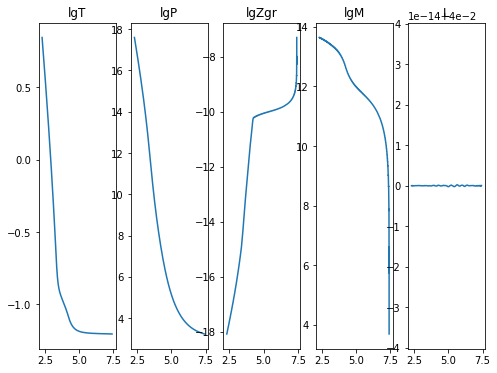

2020-12-06 05:02:10,539 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:02:11,525 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043936
2020-12-06 05:02:11,526 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800349
2020-12-06 05:02:11,527 __main__ 0/1 INFO :: lgP iterate: 17.581556452902657
2020-12-06 05:02:11,528 __main__ 0/1 INFO :: lgM iterate: 13.64107466907506
2020-12-06 05:02:11,529 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695005
2020-12-06 05:02:11,530 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-12-06 05:02:11,530 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


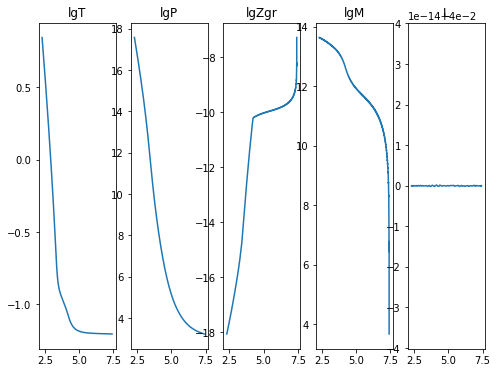

2020-12-06 05:02:15,144 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:02:15,947 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032048106
2020-12-06 05:02:15,948 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516541
2020-12-06 05:02:15,949 __main__ 0/1 INFO :: lgP iterate: 17.596817720253302
2020-12-06 05:02:15,950 __main__ 0/1 INFO :: lgM iterate: 13.641115571532929
2020-12-06 05:02:15,950 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078603
2020-12-06 05:02:15,951 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 05:02:15,952 __main__ 0/1 INFO :: L iterate: 0.04


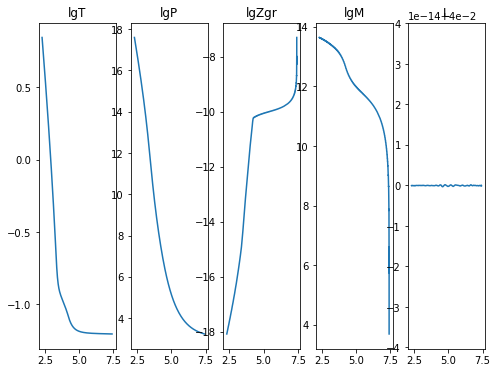

2020-12-06 05:02:20,120 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:02:21,349 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032048907
2020-12-06 05:02:21,351 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800355
2020-12-06 05:02:21,352 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 05:02:21,355 __main__ 0/1 INFO :: lgM iterate: 13.641074669075104
2020-12-06 05:02:21,356 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950093
2020-12-06 05:02:21,358 __main__ 0/1 INFO :: m iterate: 5.504256300437049e-05
2020-12-06 05:02:21,359 __main__ 0/1 INFO :: L iterate: 0.04


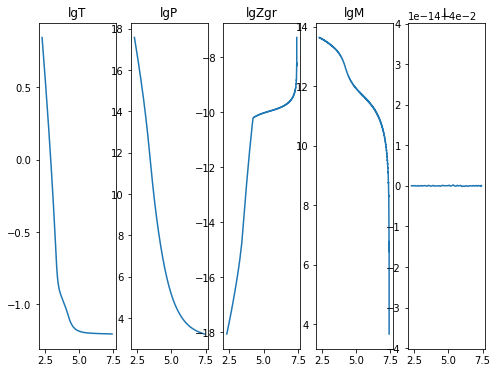

2020-12-06 05:02:25,491 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:02:26,298 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043016
2020-12-06 05:02:26,300 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516524
2020-12-06 05:02:26,300 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-12-06 05:02:26,301 __main__ 0/1 INFO :: lgM iterate: 13.641115571532971
2020-12-06 05:02:26,302 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-12-06 05:02:26,303 __main__ 0/1 INFO :: m iterate: 5.5876451733105625e-05
2020-12-06 05:02:26,304 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


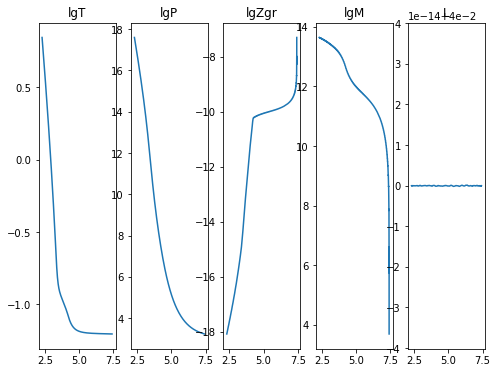

2020-12-06 05:02:29,959 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:02:31,118 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039544
2020-12-06 05:02:31,119 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800375
2020-12-06 05:02:31,120 __main__ 0/1 INFO :: lgP iterate: 17.581556452902692
2020-12-06 05:02:31,121 __main__ 0/1 INFO :: lgM iterate: 13.641074669075149
2020-12-06 05:02:31,121 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950143
2020-12-06 05:02:31,122 __main__ 0/1 INFO :: m iterate: 5.504256300170596e-05
2020-12-06 05:02:31,123 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


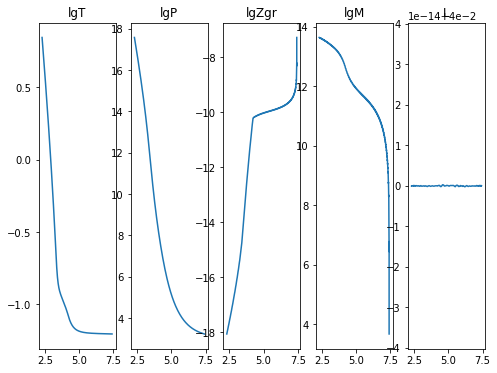

2020-12-06 05:02:35,236 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:02:36,056 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043214
2020-12-06 05:02:36,057 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516543
2020-12-06 05:02:36,058 __main__ 0/1 INFO :: lgP iterate: 17.596817720253327
2020-12-06 05:02:36,059 __main__ 0/1 INFO :: lgM iterate: 13.641115571532964
2020-12-06 05:02:36,060 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078646
2020-12-06 05:02:36,061 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-12-06 05:02:36,062 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


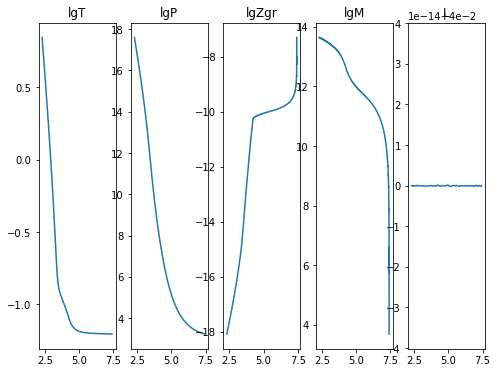

2020-12-06 05:02:39,783 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:02:40,734 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043511
2020-12-06 05:02:40,735 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800357
2020-12-06 05:02:40,736 __main__ 0/1 INFO :: lgP iterate: 17.581556452902685
2020-12-06 05:02:40,737 __main__ 0/1 INFO :: lgM iterate: 13.6410746690751
2020-12-06 05:02:40,738 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-12-06 05:02:40,739 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-12-06 05:02:40,740 __main__ 0/1 INFO :: L iterate: 0.040000000000000036


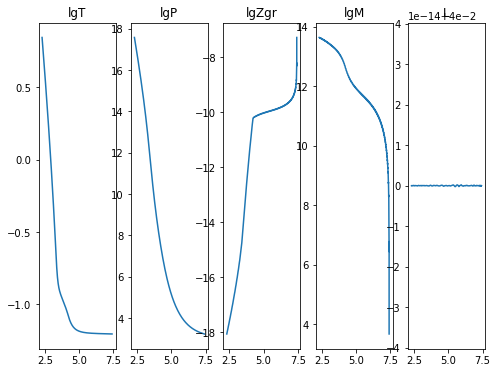

2020-12-06 05:02:44,356 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:02:45,221 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046072
2020-12-06 05:02:45,223 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516535
2020-12-06 05:02:45,224 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-12-06 05:02:45,225 __main__ 0/1 INFO :: lgM iterate: 13.641115571532971
2020-12-06 05:02:45,226 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078635
2020-12-06 05:02:45,227 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-12-06 05:02:45,228 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


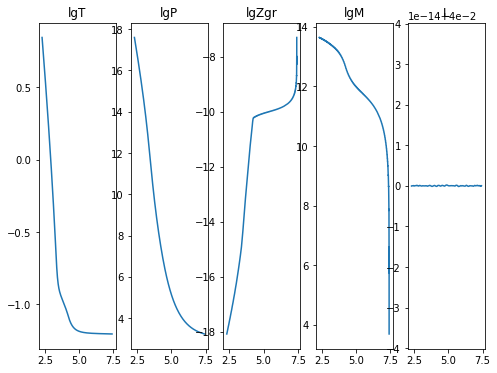

2020-12-06 05:02:49,017 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:02:50,029 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032049267
2020-12-06 05:02:50,031 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800346
2020-12-06 05:02:50,032 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 05:02:50,054 __main__ 0/1 INFO :: lgM iterate: 13.641074669075099
2020-12-06 05:02:50,058 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-12-06 05:02:50,066 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-12-06 05:02:50,068 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


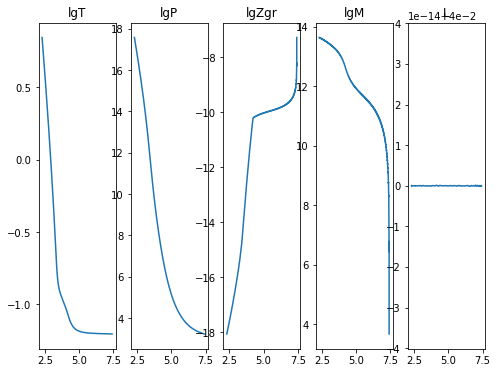

2020-12-06 05:02:53,809 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:02:54,652 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204649
2020-12-06 05:02:54,656 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516527
2020-12-06 05:02:54,657 __main__ 0/1 INFO :: lgP iterate: 17.596817720253295
2020-12-06 05:02:54,662 __main__ 0/1 INFO :: lgM iterate: 13.64111557153295
2020-12-06 05:02:54,663 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078607
2020-12-06 05:02:54,667 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-12-06 05:02:54,671 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


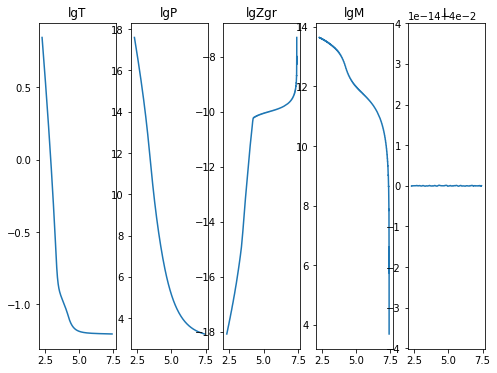

2020-12-06 05:02:58,525 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:02:59,529 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032047943
2020-12-06 05:02:59,530 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800378
2020-12-06 05:02:59,531 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-12-06 05:02:59,532 __main__ 0/1 INFO :: lgM iterate: 13.641074669075143
2020-12-06 05:02:59,533 __main__ 0/1 INFO :: lgZgr iterate: -18.0699249569501
2020-12-06 05:02:59,533 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-12-06 05:02:59,534 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


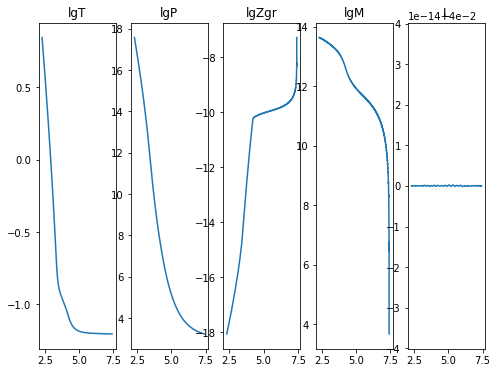

2020-12-06 05:03:03,291 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:03:04,140 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204605
2020-12-06 05:03:04,141 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516519
2020-12-06 05:03:04,142 __main__ 0/1 INFO :: lgP iterate: 17.59681772025327
2020-12-06 05:03:04,143 __main__ 0/1 INFO :: lgM iterate: 13.641115571532882
2020-12-06 05:03:04,144 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078547
2020-12-06 05:03:04,145 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-12-06 05:03:04,146 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


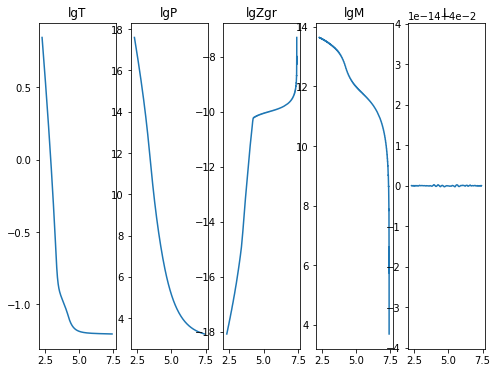

2020-12-06 05:03:07,956 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:03:08,950 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043978
2020-12-06 05:03:08,951 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800353
2020-12-06 05:03:08,952 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 05:03:08,953 __main__ 0/1 INFO :: lgM iterate: 13.641074669075136
2020-12-06 05:03:08,954 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950118
2020-12-06 05:03:08,955 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-12-06 05:03:08,956 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


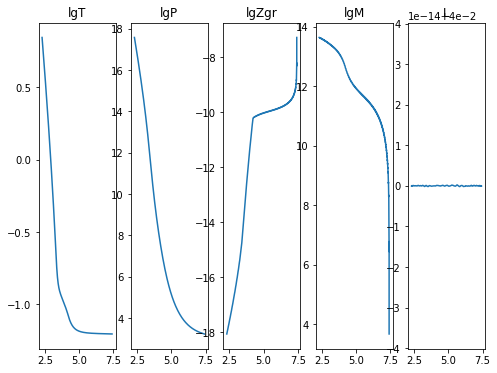

2020-12-06 05:03:12,754 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:03:13,619 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043027
2020-12-06 05:03:13,620 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-12-06 05:03:13,621 __main__ 0/1 INFO :: lgP iterate: 17.596817720253295
2020-12-06 05:03:13,622 __main__ 0/1 INFO :: lgM iterate: 13.641115571532966
2020-12-06 05:03:13,623 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-12-06 05:03:13,624 __main__ 0/1 INFO :: m iterate: 5.5876451733105625e-05
2020-12-06 05:03:13,625 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


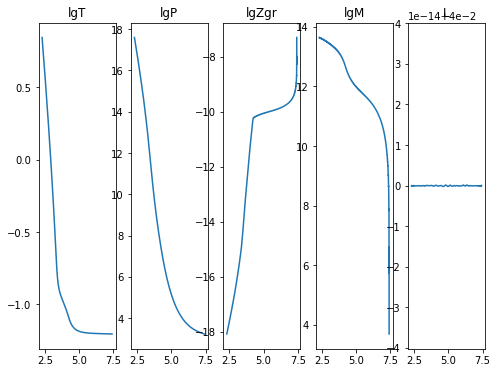

2020-12-06 05:03:17,466 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:03:18,752 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042095
2020-12-06 05:03:18,753 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800356
2020-12-06 05:03:18,754 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 05:03:18,755 __main__ 0/1 INFO :: lgM iterate: 13.641074669075167
2020-12-06 05:03:18,756 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950146
2020-12-06 05:03:18,757 __main__ 0/1 INFO :: m iterate: 5.5042563003482314e-05
2020-12-06 05:03:18,758 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


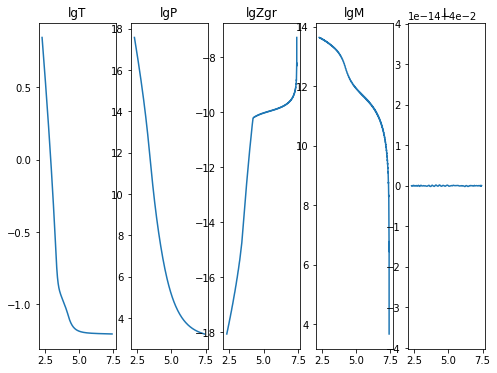

2020-12-06 05:03:22,644 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:03:23,464 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041202
2020-12-06 05:03:23,465 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516539
2020-12-06 05:03:23,466 __main__ 0/1 INFO :: lgP iterate: 17.596817720253295
2020-12-06 05:03:23,467 __main__ 0/1 INFO :: lgM iterate: 13.641115571532975
2020-12-06 05:03:23,468 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078632
2020-12-06 05:03:23,469 __main__ 0/1 INFO :: m iterate: 5.587645173665834e-05
2020-12-06 05:03:23,470 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


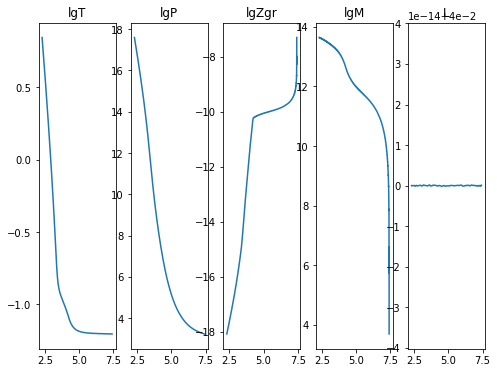

2020-12-06 05:03:27,222 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:03:28,185 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040474
2020-12-06 05:03:28,187 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800365
2020-12-06 05:03:28,187 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-12-06 05:03:28,188 __main__ 0/1 INFO :: lgM iterate: 13.641074669075124
2020-12-06 05:03:28,189 __main__ 0/1 INFO :: lgZgr iterate: -18.0699249569501
2020-12-06 05:03:28,190 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 05:03:28,191 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


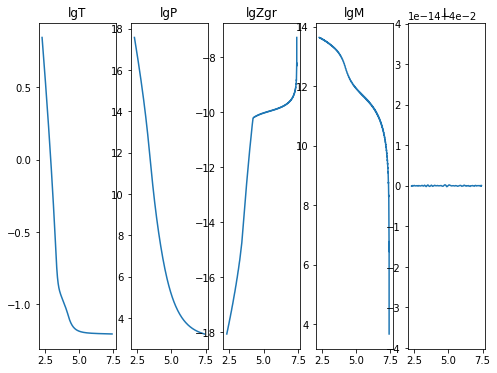

2020-12-06 05:03:31,949 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:03:32,789 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039999
2020-12-06 05:03:32,790 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516527
2020-12-06 05:03:32,791 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 05:03:32,792 __main__ 0/1 INFO :: lgM iterate: 13.641115571532914
2020-12-06 05:03:32,793 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507859
2020-12-06 05:03:32,795 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-12-06 05:03:32,795 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


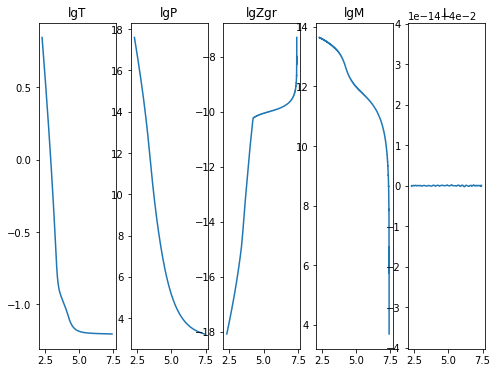

2020-12-06 05:03:36,642 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:03:37,634 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203987
2020-12-06 05:03:37,636 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800376
2020-12-06 05:03:37,636 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-12-06 05:03:37,637 __main__ 0/1 INFO :: lgM iterate: 13.641074669075115
2020-12-06 05:03:37,638 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-12-06 05:03:37,639 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 05:03:37,640 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


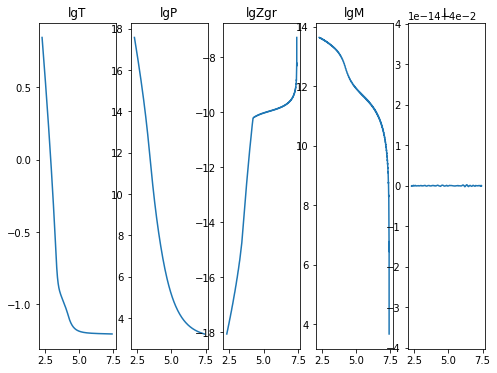

2020-12-06 05:03:41,393 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:03:42,287 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039097
2020-12-06 05:03:42,288 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516534
2020-12-06 05:03:42,289 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-12-06 05:03:42,289 __main__ 0/1 INFO :: lgM iterate: 13.64111557153296
2020-12-06 05:03:42,290 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078635
2020-12-06 05:03:42,291 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 05:03:42,292 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


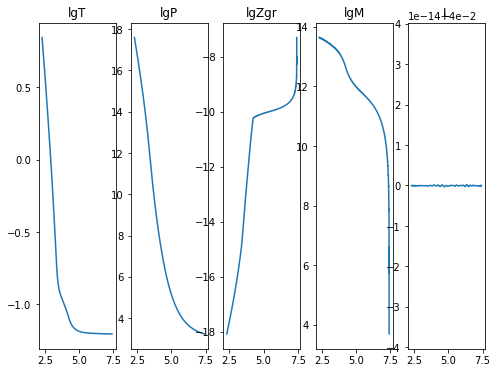

2020-12-06 05:03:46,060 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:03:47,022 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032033455
2020-12-06 05:03:47,023 __main__ 0/1 INFO :: lgT iterate: 0.844929764780036
2020-12-06 05:03:47,024 __main__ 0/1 INFO :: lgP iterate: 17.58155645290271
2020-12-06 05:03:47,025 __main__ 0/1 INFO :: lgM iterate: 13.641074669075143
2020-12-06 05:03:47,026 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950153
2020-12-06 05:03:47,027 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-12-06 05:03:47,028 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


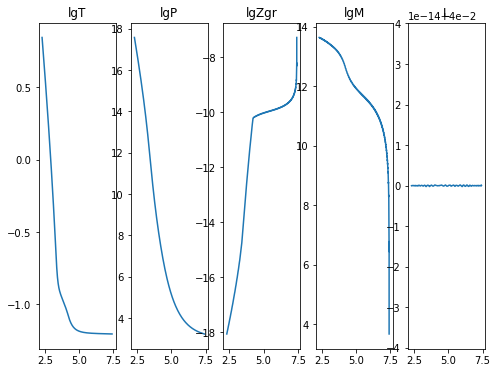

2020-12-06 05:03:50,674 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:03:51,486 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203184
2020-12-06 05:03:51,487 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516532
2020-12-06 05:03:51,488 __main__ 0/1 INFO :: lgP iterate: 17.596817720253327
2020-12-06 05:03:51,489 __main__ 0/1 INFO :: lgM iterate: 13.641115571532954
2020-12-06 05:03:51,490 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078643
2020-12-06 05:03:51,491 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 05:03:51,491 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


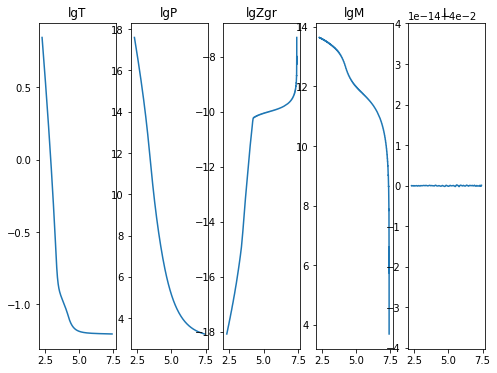

2020-12-06 05:03:55,221 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:03:56,230 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032032283
2020-12-06 05:03:56,231 __main__ 0/1 INFO :: lgT iterate: 0.844929764780036
2020-12-06 05:03:56,232 __main__ 0/1 INFO :: lgP iterate: 17.581556452902706
2020-12-06 05:03:56,233 __main__ 0/1 INFO :: lgM iterate: 13.641074669075145
2020-12-06 05:03:56,235 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950153
2020-12-06 05:03:56,237 __main__ 0/1 INFO :: m iterate: 5.50425630123641e-05
2020-12-06 05:03:56,238 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


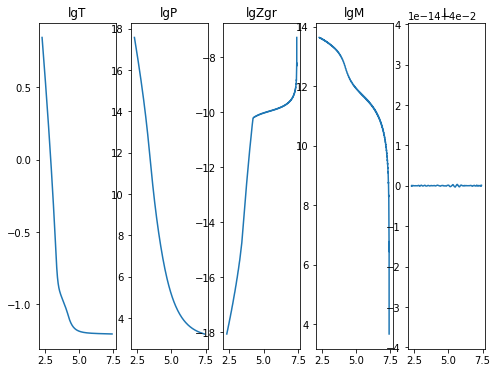

2020-12-06 05:03:59,908 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:04:00,715 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043325
2020-12-06 05:04:00,716 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516529
2020-12-06 05:04:00,717 __main__ 0/1 INFO :: lgP iterate: 17.596817720253323
2020-12-06 05:04:00,717 __main__ 0/1 INFO :: lgM iterate: 13.641115571533028
2020-12-06 05:04:00,718 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078692
2020-12-06 05:04:00,719 __main__ 0/1 INFO :: m iterate: 5.5876451733993804e-05
2020-12-06 05:04:00,720 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


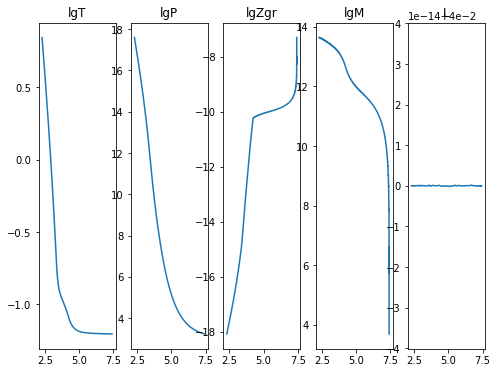

2020-12-06 05:04:04,371 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:04:05,378 __main__ 0/1 INFO :: Perturbation norm: 1.740464603205334
2020-12-06 05:04:05,379 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800346
2020-12-06 05:04:05,380 __main__ 0/1 INFO :: lgP iterate: 17.581556452902678
2020-12-06 05:04:05,381 __main__ 0/1 INFO :: lgM iterate: 13.641074669075087
2020-12-06 05:04:05,382 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950086
2020-12-06 05:04:05,383 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-12-06 05:04:05,384 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


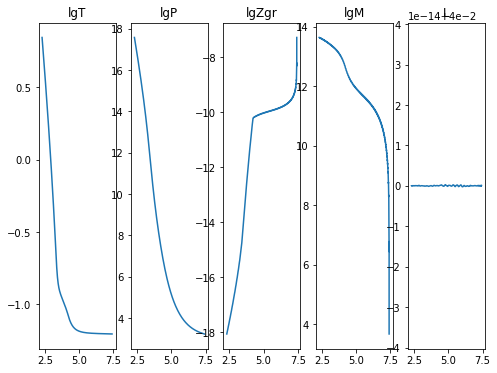

2020-12-06 05:04:09,051 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:04:09,838 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032052689
2020-12-06 05:04:09,839 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516541
2020-12-06 05:04:09,840 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-12-06 05:04:09,841 __main__ 0/1 INFO :: lgM iterate: 13.641115571532941
2020-12-06 05:04:09,842 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-12-06 05:04:09,842 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-12-06 05:04:09,843 __main__ 0/1 INFO :: L iterate: 0.040000000000000036


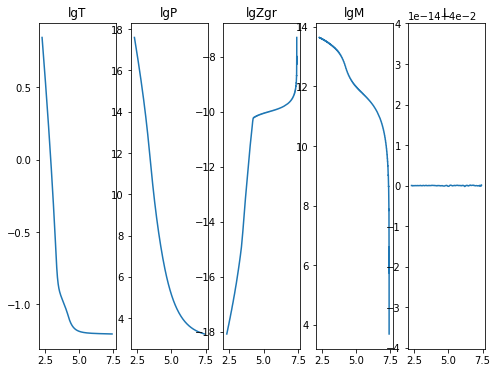

2020-12-06 05:04:13,542 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:04:14,483 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032053677
2020-12-06 05:04:14,485 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800353
2020-12-06 05:04:14,486 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-12-06 05:04:14,487 __main__ 0/1 INFO :: lgM iterate: 13.641074669075067
2020-12-06 05:04:14,488 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950057
2020-12-06 05:04:14,489 __main__ 0/1 INFO :: m iterate: 5.504256301147592e-05
2020-12-06 05:04:14,490 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


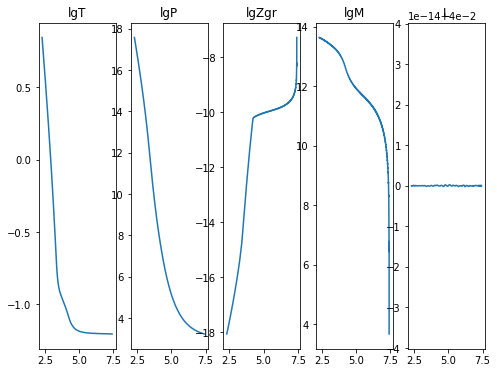

2020-12-06 05:04:18,178 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:04:19,011 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032050723
2020-12-06 05:04:19,012 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516523
2020-12-06 05:04:19,013 __main__ 0/1 INFO :: lgP iterate: 17.596817720253284
2020-12-06 05:04:19,014 __main__ 0/1 INFO :: lgM iterate: 13.641115571532898
2020-12-06 05:04:19,015 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078568
2020-12-06 05:04:19,016 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-12-06 05:04:19,017 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


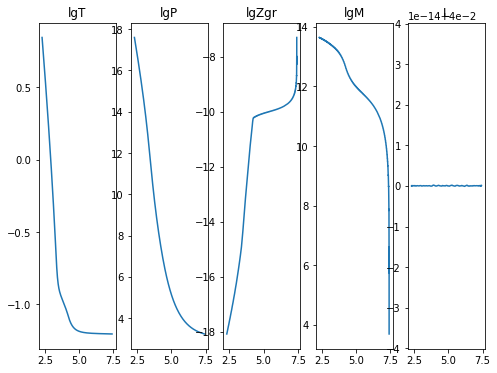

2020-12-06 05:04:22,714 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:04:23,707 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032049262
2020-12-06 05:04:23,708 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800369
2020-12-06 05:04:23,709 __main__ 0/1 INFO :: lgP iterate: 17.581556452902703
2020-12-06 05:04:23,734 __main__ 0/1 INFO :: lgM iterate: 13.64107466907516
2020-12-06 05:04:23,735 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950143
2020-12-06 05:04:23,736 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-12-06 05:04:23,737 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


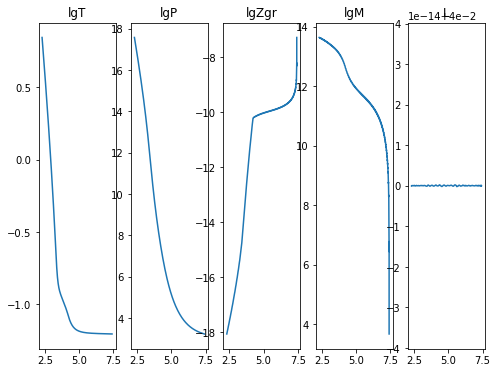

2020-12-06 05:04:27,380 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:04:28,195 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032052626
2020-12-06 05:04:28,196 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516539
2020-12-06 05:04:28,197 __main__ 0/1 INFO :: lgP iterate: 17.596817720253316
2020-12-06 05:04:28,198 __main__ 0/1 INFO :: lgM iterate: 13.64111557153297
2020-12-06 05:04:28,199 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078653
2020-12-06 05:04:28,200 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-12-06 05:04:28,201 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


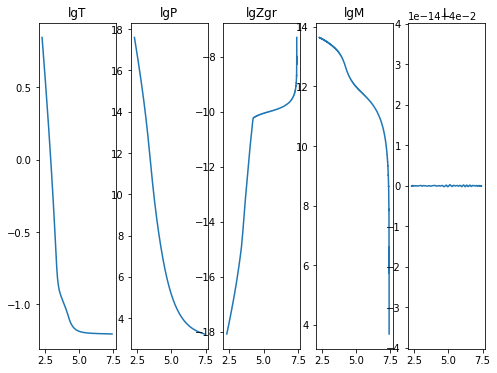

2020-12-06 05:04:31,943 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:04:32,925 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032055098
2020-12-06 05:04:32,926 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800356
2020-12-06 05:04:32,927 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 05:04:32,928 __main__ 0/1 INFO :: lgM iterate: 13.641074669075127
2020-12-06 05:04:32,929 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950118
2020-12-06 05:04:32,930 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 05:04:32,931 __main__ 0/1 INFO :: L iterate: 0.039999999999999945


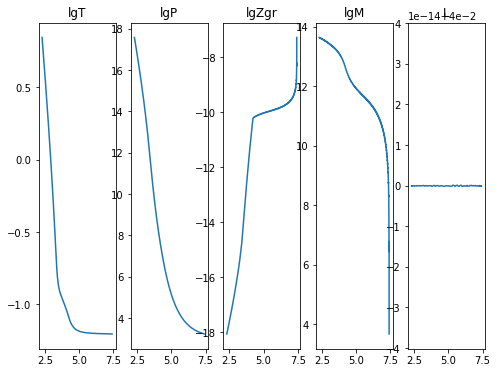

2020-12-06 05:04:36,582 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:04:37,357 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032049544
2020-12-06 05:04:37,358 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516521
2020-12-06 05:04:37,360 __main__ 0/1 INFO :: lgP iterate: 17.596817720253302
2020-12-06 05:04:37,361 __main__ 0/1 INFO :: lgM iterate: 13.641115571532978
2020-12-06 05:04:37,362 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078632
2020-12-06 05:04:37,363 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 05:04:37,364 __main__ 0/1 INFO :: L iterate: 0.03999999999999996


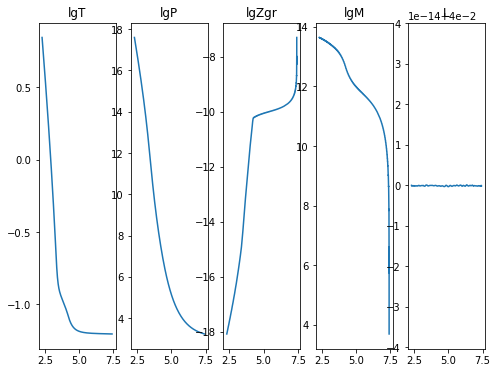

2020-12-06 05:04:41,018 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:04:42,011 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044533
2020-12-06 05:04:42,012 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800352
2020-12-06 05:04:42,013 __main__ 0/1 INFO :: lgP iterate: 17.581556452902696
2020-12-06 05:04:42,014 __main__ 0/1 INFO :: lgM iterate: 13.64107466907508
2020-12-06 05:04:42,015 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-12-06 05:04:42,016 __main__ 0/1 INFO :: m iterate: 5.504256300525867e-05
2020-12-06 05:04:42,017 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


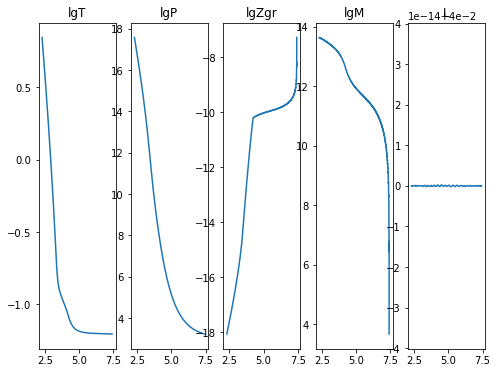

2020-12-06 05:04:45,705 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:04:46,521 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044953
2020-12-06 05:04:46,522 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-12-06 05:04:46,523 __main__ 0/1 INFO :: lgP iterate: 17.596817720253277
2020-12-06 05:04:46,524 __main__ 0/1 INFO :: lgM iterate: 13.641115571532948
2020-12-06 05:04:46,524 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507859
2020-12-06 05:04:46,525 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 05:04:46,526 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


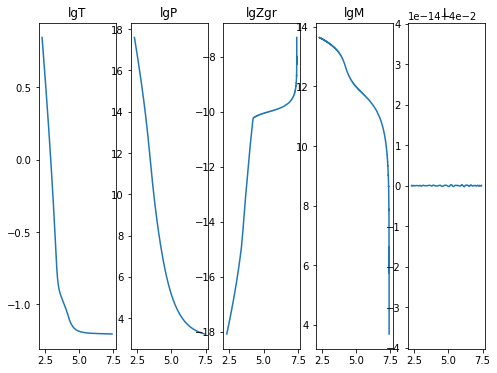

2020-12-06 05:04:50,251 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:04:51,197 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032049964
2020-12-06 05:04:51,198 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800377
2020-12-06 05:04:51,199 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-12-06 05:04:51,200 __main__ 0/1 INFO :: lgM iterate: 13.641074669075138
2020-12-06 05:04:51,201 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950107
2020-12-06 05:04:51,202 __main__ 0/1 INFO :: m iterate: 5.5042563003482314e-05
2020-12-06 05:04:51,203 __main__ 0/1 INFO :: L iterate: 0.04000000000000004


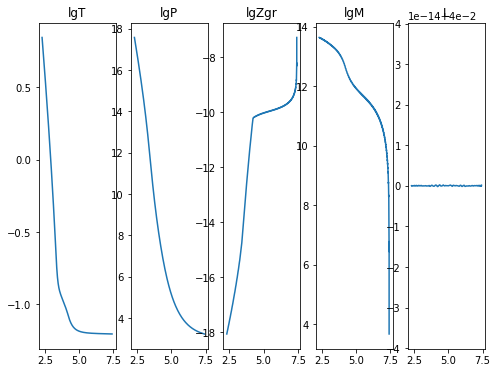

2020-12-06 05:04:54,910 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:04:55,740 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032048503
2020-12-06 05:04:55,741 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516523
2020-12-06 05:04:55,742 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 05:04:55,743 __main__ 0/1 INFO :: lgM iterate: 13.641115571532989
2020-12-06 05:04:55,744 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507864
2020-12-06 05:04:55,745 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-12-06 05:04:55,746 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


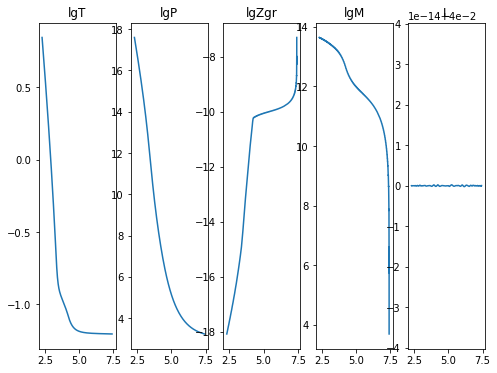

2020-12-06 05:04:59,428 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:05:00,428 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204468
2020-12-06 05:05:00,429 __main__ 0/1 INFO :: lgT iterate: 0.844929764780036
2020-12-06 05:05:00,429 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-12-06 05:05:00,430 __main__ 0/1 INFO :: lgM iterate: 13.641074669075095
2020-12-06 05:05:00,431 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695007
2020-12-06 05:05:00,432 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-12-06 05:05:00,433 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


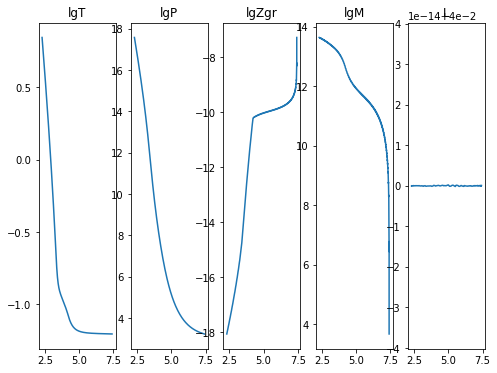

2020-12-06 05:05:04,098 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:05:04,997 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204241
2020-12-06 05:05:04,998 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516524
2020-12-06 05:05:04,998 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-12-06 05:05:04,999 __main__ 0/1 INFO :: lgM iterate: 13.641115571532957
2020-12-06 05:05:05,000 __main__ 0/1 INFO :: lgZgr iterate: -18.0842848950786
2020-12-06 05:05:05,000 __main__ 0/1 INFO :: m iterate: 5.587645172511202e-05
2020-12-06 05:05:05,001 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


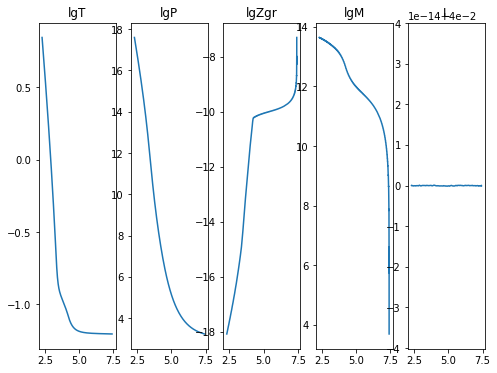

2020-12-06 05:05:08,772 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:05:09,741 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041602
2020-12-06 05:05:09,742 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800343
2020-12-06 05:05:09,743 __main__ 0/1 INFO :: lgP iterate: 17.581556452902664
2020-12-06 05:05:09,743 __main__ 0/1 INFO :: lgM iterate: 13.641074669075072
2020-12-06 05:05:09,744 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950064
2020-12-06 05:05:09,745 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-12-06 05:05:09,746 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


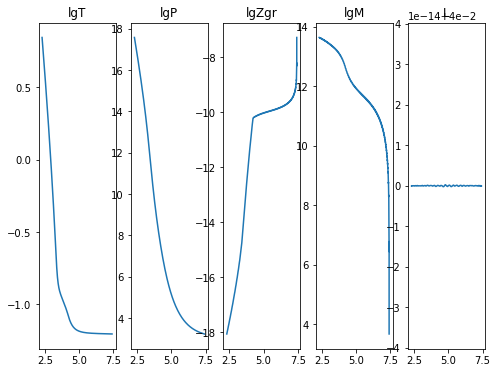

2020-12-06 05:05:13,432 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:05:14,200 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204609
2020-12-06 05:05:14,201 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516534
2020-12-06 05:05:14,202 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-12-06 05:05:14,203 __main__ 0/1 INFO :: lgM iterate: 13.641115571532977
2020-12-06 05:05:14,204 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507864
2020-12-06 05:05:14,205 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 05:05:14,206 __main__ 0/1 INFO :: L iterate: 0.039999999999999966


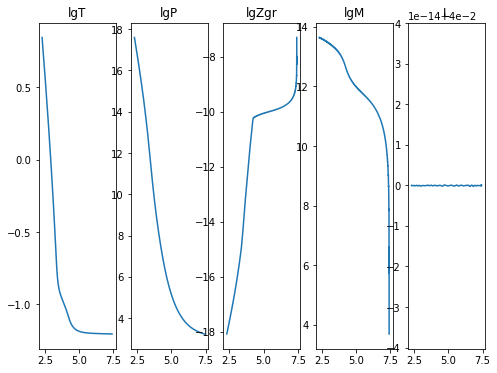

2020-12-06 05:05:17,894 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:05:19,142 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032050537
2020-12-06 05:05:19,143 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800353
2020-12-06 05:05:19,143 __main__ 0/1 INFO :: lgP iterate: 17.58155645290264
2020-12-06 05:05:19,144 __main__ 0/1 INFO :: lgM iterate: 13.64107466907512
2020-12-06 05:05:19,145 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695007
2020-12-06 05:05:19,145 __main__ 0/1 INFO :: m iterate: 5.504256300437049e-05
2020-12-06 05:05:19,146 __main__ 0/1 INFO :: L iterate: 0.03999999999999993


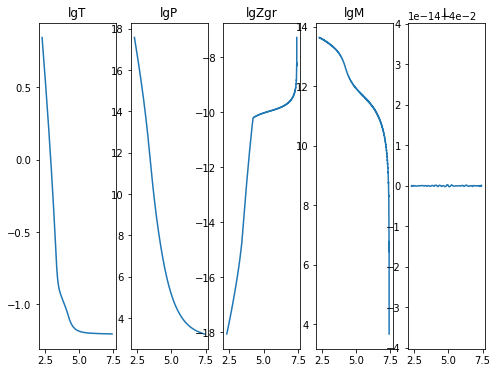

2020-12-06 05:05:22,930 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-12-06 05:05:23,742 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044349
2020-12-06 05:05:23,743 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516527
2020-12-06 05:05:23,744 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 05:05:23,746 __main__ 0/1 INFO :: lgM iterate: 13.641115571532954
2020-12-06 05:05:23,747 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078614
2020-12-06 05:05:23,748 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-12-06 05:05:23,749 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


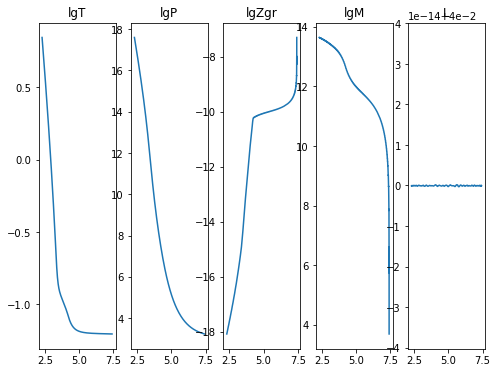

2020-12-06 05:05:27,522 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:05:28,522 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203474
2020-12-06 05:05:28,523 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800369
2020-12-06 05:05:28,524 __main__ 0/1 INFO :: lgP iterate: 17.5815564529027
2020-12-06 05:05:28,525 __main__ 0/1 INFO :: lgM iterate: 13.641074669075163
2020-12-06 05:05:28,526 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950167
2020-12-06 05:05:28,526 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-12-06 05:05:28,527 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


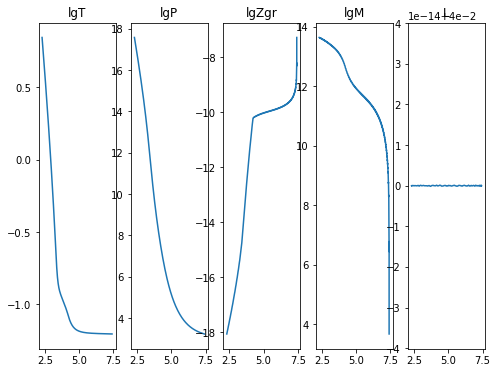

2020-12-06 05:05:32,207 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:05:33,074 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032034283
2020-12-06 05:05:33,075 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-12-06 05:05:33,076 __main__ 0/1 INFO :: lgP iterate: 17.596817720253288
2020-12-06 05:05:33,077 __main__ 0/1 INFO :: lgM iterate: 13.641115571532959
2020-12-06 05:05:33,077 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507862
2020-12-06 05:05:33,078 __main__ 0/1 INFO :: m iterate: 5.587645173665834e-05
2020-12-06 05:05:33,079 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


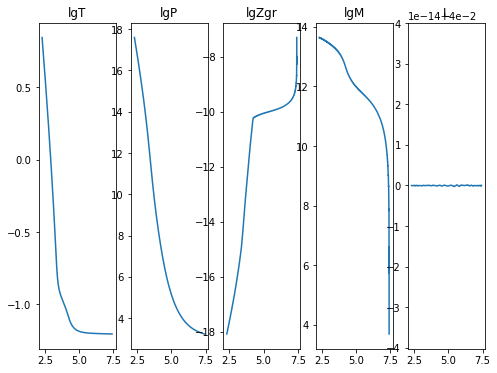

2020-12-06 05:05:36,793 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:05:37,993 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037534
2020-12-06 05:05:37,994 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800356
2020-12-06 05:05:37,995 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-12-06 05:05:37,996 __main__ 0/1 INFO :: lgM iterate: 13.641074669075117
2020-12-06 05:05:37,997 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-12-06 05:05:37,998 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-12-06 05:05:37,999 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


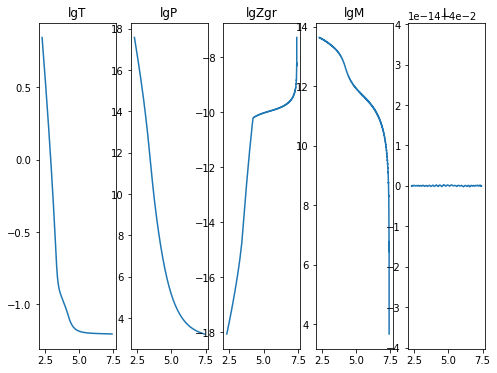

2020-12-06 05:05:43,131 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.8e+00/s
2020-12-06 05:05:44,231 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204086
2020-12-06 05:05:44,232 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-12-06 05:05:44,233 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-12-06 05:05:44,233 __main__ 0/1 INFO :: lgM iterate: 13.641115571533
2020-12-06 05:05:44,234 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507866
2020-12-06 05:05:44,235 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 05:05:44,236 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


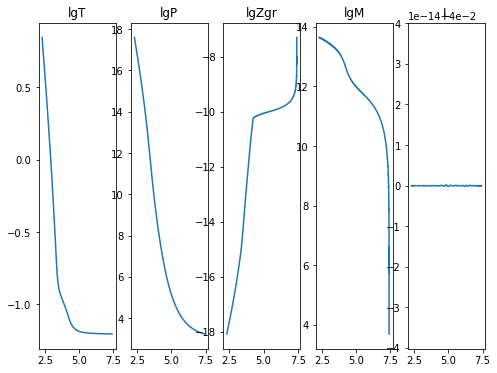

2020-12-06 05:05:48,480 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:05:49,510 __main__ 0/1 INFO :: Perturbation norm: 1.74046460320421
2020-12-06 05:05:49,511 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800367
2020-12-06 05:05:49,512 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-12-06 05:05:49,513 __main__ 0/1 INFO :: lgM iterate: 13.641074669075131
2020-12-06 05:05:49,514 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950125
2020-12-06 05:05:49,515 __main__ 0/1 INFO :: m iterate: 5.5042563003482314e-05
2020-12-06 05:05:49,516 __main__ 0/1 INFO :: L iterate: 0.04


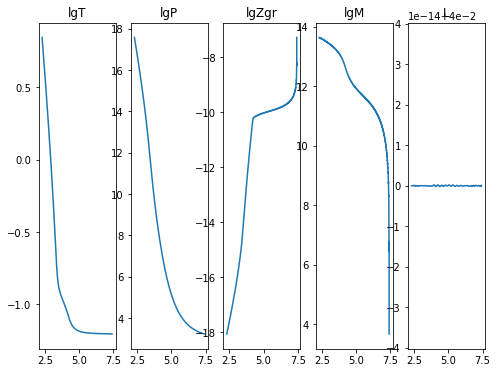

2020-12-06 05:05:53,147 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:05:53,992 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044868
2020-12-06 05:05:53,993 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516548
2020-12-06 05:05:53,994 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 05:05:53,994 __main__ 0/1 INFO :: lgM iterate: 13.641115571532948
2020-12-06 05:05:53,995 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078607
2020-12-06 05:05:53,996 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-12-06 05:05:53,997 __main__ 0/1 INFO :: L iterate: 0.04


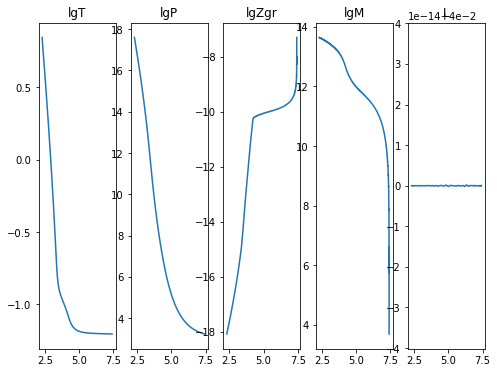

2020-12-06 05:05:58,086 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:05:59,072 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032049202
2020-12-06 05:05:59,073 __main__ 0/1 INFO :: lgT iterate: 0.844929764780035
2020-12-06 05:05:59,074 __main__ 0/1 INFO :: lgP iterate: 17.58155645290265
2020-12-06 05:05:59,075 __main__ 0/1 INFO :: lgM iterate: 13.64107466907507
2020-12-06 05:05:59,076 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950047
2020-12-06 05:05:59,077 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 05:05:59,078 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


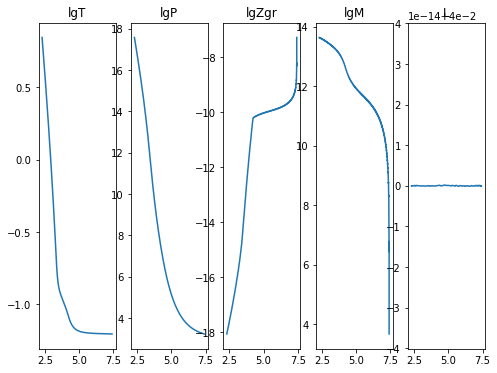

2020-12-06 05:06:02,746 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:06:03,567 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204546
2020-12-06 05:06:03,568 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516523
2020-12-06 05:06:03,569 __main__ 0/1 INFO :: lgP iterate: 17.596817720253267
2020-12-06 05:06:03,570 __main__ 0/1 INFO :: lgM iterate: 13.641115571532932
2020-12-06 05:06:03,571 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507857
2020-12-06 05:06:03,572 __main__ 0/1 INFO :: m iterate: 5.58764517260002e-05
2020-12-06 05:06:03,573 __main__ 0/1 INFO :: L iterate: 0.04


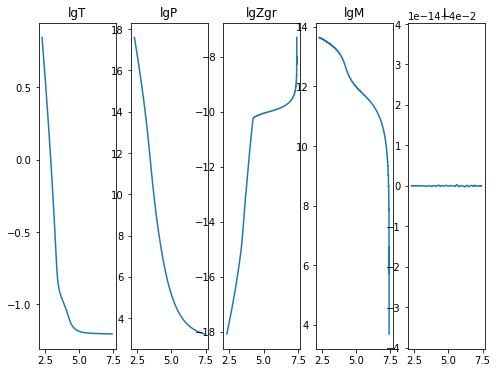

2020-12-06 05:06:07,319 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:06:08,322 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044466
2020-12-06 05:06:08,323 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800342
2020-12-06 05:06:08,324 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-12-06 05:06:08,325 __main__ 0/1 INFO :: lgM iterate: 13.641074669075069
2020-12-06 05:06:08,327 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695007
2020-12-06 05:06:08,328 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-12-06 05:06:08,329 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


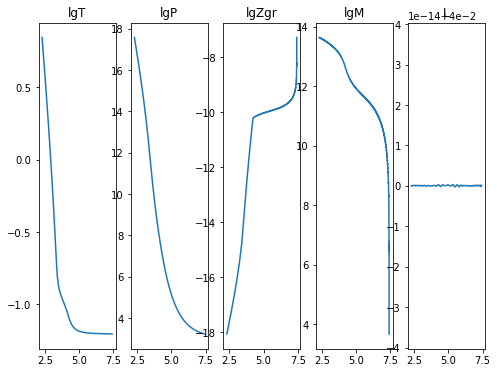

2020-12-06 05:06:12,118 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:06:12,968 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032049274
2020-12-06 05:06:12,969 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516525
2020-12-06 05:06:12,971 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 05:06:12,971 __main__ 0/1 INFO :: lgM iterate: 13.641115571532866
2020-12-06 05:06:12,972 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078554
2020-12-06 05:06:12,973 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 05:06:12,974 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


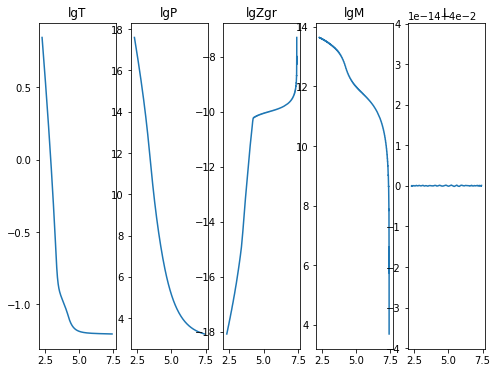

2020-12-06 05:06:16,785 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:06:17,752 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032053173
2020-12-06 05:06:17,753 __main__ 0/1 INFO :: lgT iterate: 0.844929764780038
2020-12-06 05:06:17,754 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-12-06 05:06:17,755 __main__ 0/1 INFO :: lgM iterate: 13.641074669075188
2020-12-06 05:06:17,756 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695014
2020-12-06 05:06:17,757 __main__ 0/1 INFO :: m iterate: 5.504256300437049e-05
2020-12-06 05:06:17,757 __main__ 0/1 INFO :: L iterate: 0.04


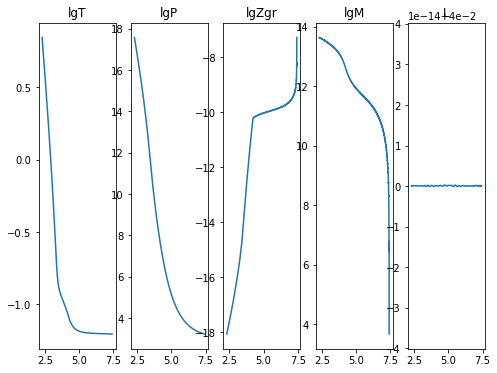

2020-12-06 05:06:21,528 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:06:22,328 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032049045
2020-12-06 05:06:22,329 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516538
2020-12-06 05:06:22,330 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-12-06 05:06:22,331 __main__ 0/1 INFO :: lgM iterate: 13.64111557153301
2020-12-06 05:06:22,332 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078667
2020-12-06 05:06:22,333 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-12-06 05:06:22,334 __main__ 0/1 INFO :: L iterate: 0.03999999999999996


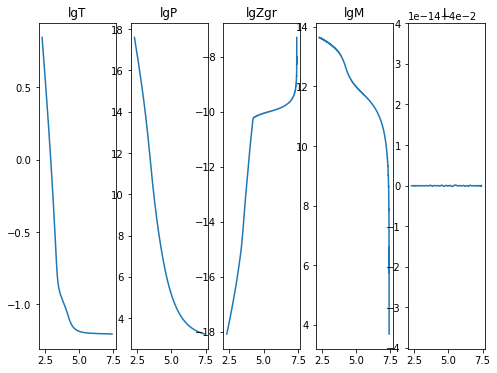

2020-12-06 05:06:26,189 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:06:27,219 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042135
2020-12-06 05:06:27,220 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800362
2020-12-06 05:06:27,221 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-12-06 05:06:27,222 __main__ 0/1 INFO :: lgM iterate: 13.64107466907512
2020-12-06 05:06:27,222 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950103
2020-12-06 05:06:27,224 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 05:06:27,225 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


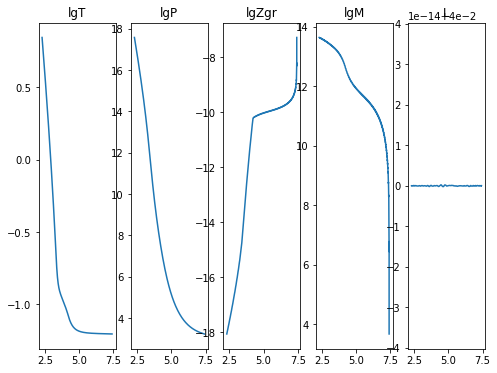

2020-12-06 05:06:31,411 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:06:32,219 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042226
2020-12-06 05:06:32,220 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516521
2020-12-06 05:06:32,221 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-12-06 05:06:32,221 __main__ 0/1 INFO :: lgM iterate: 13.64111557153296
2020-12-06 05:06:32,222 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078632
2020-12-06 05:06:32,223 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-12-06 05:06:32,224 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


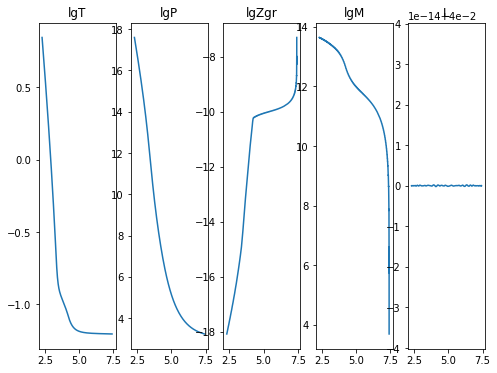

2020-12-06 05:06:36,014 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:06:36,970 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044826
2020-12-06 05:06:36,972 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800352
2020-12-06 05:06:36,972 __main__ 0/1 INFO :: lgP iterate: 17.58155645290265
2020-12-06 05:06:36,973 __main__ 0/1 INFO :: lgM iterate: 13.641074669075103
2020-12-06 05:06:36,974 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950068
2020-12-06 05:06:36,975 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-12-06 05:06:36,975 __main__ 0/1 INFO :: L iterate: 0.039999999999999966


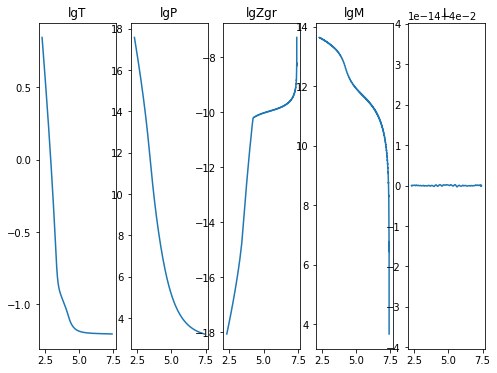

2020-12-06 05:06:40,643 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:06:41,498 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032045177
2020-12-06 05:06:41,499 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516533
2020-12-06 05:06:41,500 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 05:06:41,501 __main__ 0/1 INFO :: lgM iterate: 13.64111557153294
2020-12-06 05:06:41,501 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-12-06 05:06:41,502 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-12-06 05:06:41,503 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


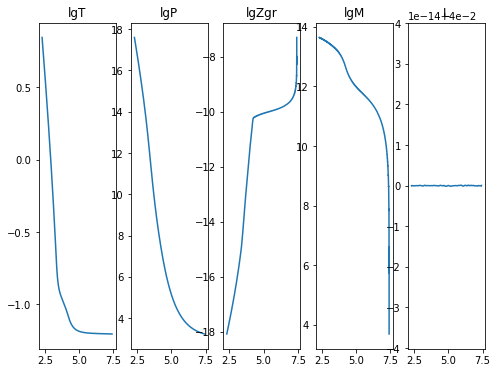

2020-12-06 05:06:45,224 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:06:46,242 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043676
2020-12-06 05:06:46,244 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800376
2020-12-06 05:06:46,245 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-12-06 05:06:46,246 __main__ 0/1 INFO :: lgM iterate: 13.641074669075167
2020-12-06 05:06:46,247 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950132
2020-12-06 05:06:46,248 __main__ 0/1 INFO :: m iterate: 5.504256300525867e-05
2020-12-06 05:06:46,249 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


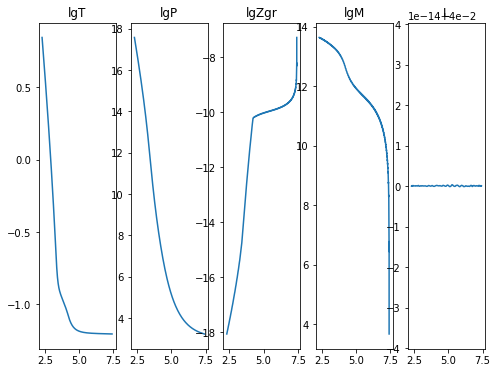

2020-12-06 05:06:49,888 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:06:50,710 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044502
2020-12-06 05:06:50,711 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-12-06 05:06:50,712 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-12-06 05:06:50,713 __main__ 0/1 INFO :: lgM iterate: 13.64111557153293
2020-12-06 05:06:50,714 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-12-06 05:06:50,715 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-12-06 05:06:50,715 __main__ 0/1 INFO :: L iterate: 0.039999999999999966


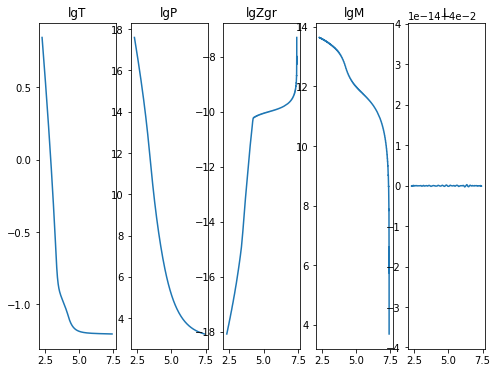

2020-12-06 05:06:54,360 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:06:55,318 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046385
2020-12-06 05:06:55,319 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800365
2020-12-06 05:06:55,320 __main__ 0/1 INFO :: lgP iterate: 17.581556452902657
2020-12-06 05:06:55,321 __main__ 0/1 INFO :: lgM iterate: 13.641074669075142
2020-12-06 05:06:55,321 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-12-06 05:06:55,322 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-12-06 05:06:55,323 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


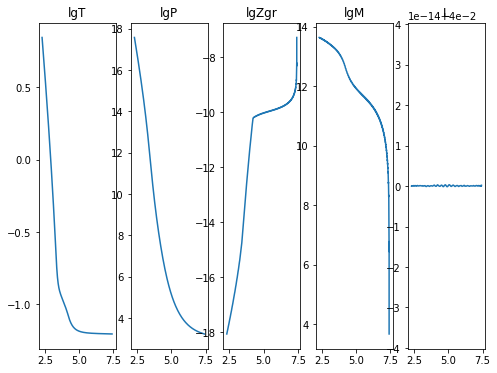

2020-12-06 05:06:58,975 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:06:59,748 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044164
2020-12-06 05:06:59,749 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516532
2020-12-06 05:06:59,750 __main__ 0/1 INFO :: lgP iterate: 17.596817720253295
2020-12-06 05:06:59,751 __main__ 0/1 INFO :: lgM iterate: 13.641115571532948
2020-12-06 05:06:59,751 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-12-06 05:06:59,752 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-12-06 05:06:59,753 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


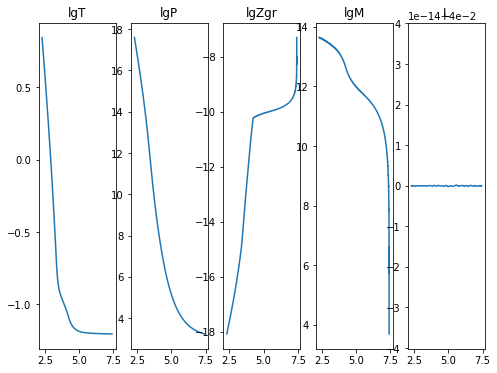

2020-12-06 05:07:03,493 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:07:04,500 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042301
2020-12-06 05:07:04,501 __main__ 0/1 INFO :: lgT iterate: 0.844929764780037
2020-12-06 05:07:04,502 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-12-06 05:07:04,503 __main__ 0/1 INFO :: lgM iterate: 13.641074669075145
2020-12-06 05:07:04,504 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950118
2020-12-06 05:07:04,505 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-12-06 05:07:04,506 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


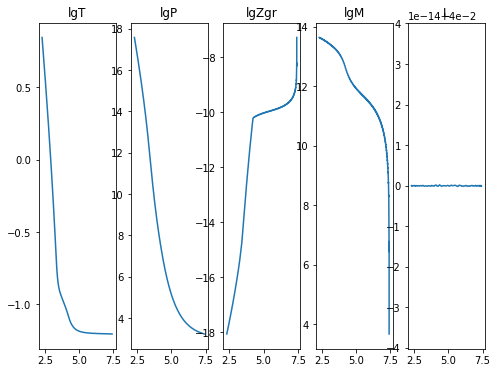

2020-12-06 05:07:08,201 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:07:09,046 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041307
2020-12-06 05:07:09,047 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516534
2020-12-06 05:07:09,048 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-12-06 05:07:09,049 __main__ 0/1 INFO :: lgM iterate: 13.641115571532948
2020-12-06 05:07:09,050 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507862
2020-12-06 05:07:09,051 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-12-06 05:07:09,052 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


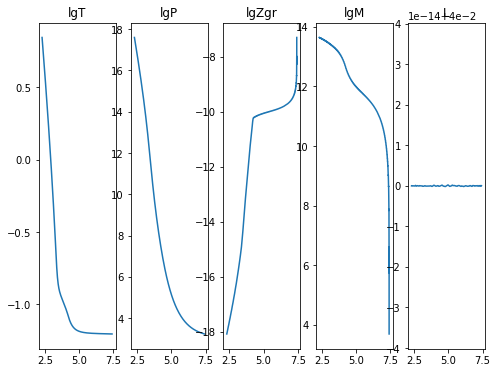

2020-12-06 05:07:12,720 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:07:13,672 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040478
2020-12-06 05:07:13,673 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800361
2020-12-06 05:07:13,674 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-12-06 05:07:13,675 __main__ 0/1 INFO :: lgM iterate: 13.641074669075127
2020-12-06 05:07:13,676 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950103
2020-12-06 05:07:13,677 __main__ 0/1 INFO :: m iterate: 5.504256300170596e-05
2020-12-06 05:07:13,677 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


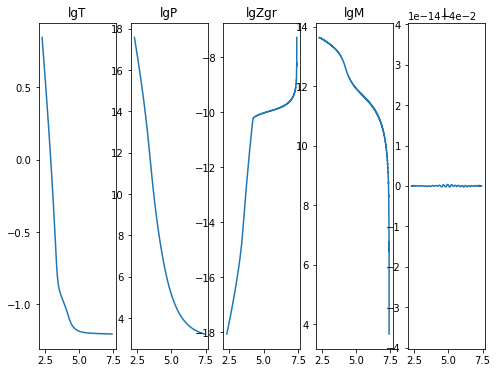

2020-12-06 05:07:17,347 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:07:18,241 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203679
2020-12-06 05:07:18,242 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516529
2020-12-06 05:07:18,243 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-12-06 05:07:18,245 __main__ 0/1 INFO :: lgM iterate: 13.641115571532971
2020-12-06 05:07:18,246 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507862
2020-12-06 05:07:18,247 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-12-06 05:07:18,248 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


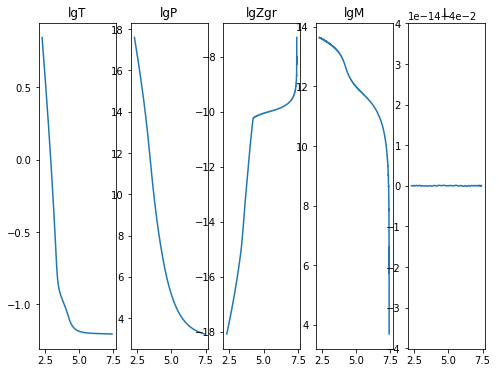

2020-12-06 05:07:22,129 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:07:23,097 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035016
2020-12-06 05:07:23,099 __main__ 0/1 INFO :: lgT iterate: 0.844929764780036
2020-12-06 05:07:23,099 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 05:07:23,100 __main__ 0/1 INFO :: lgM iterate: 13.641074669075106
2020-12-06 05:07:23,101 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-12-06 05:07:23,102 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 05:07:23,103 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


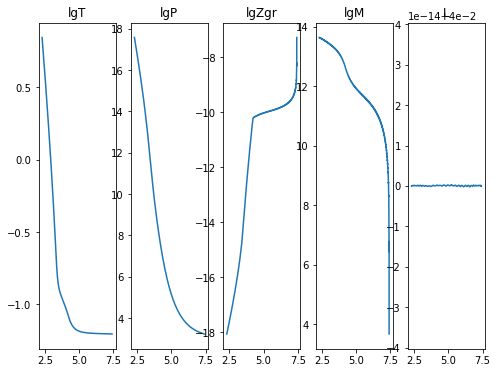

2020-12-06 05:07:26,786 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:07:27,634 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037663
2020-12-06 05:07:27,635 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516515
2020-12-06 05:07:27,636 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-12-06 05:07:27,637 __main__ 0/1 INFO :: lgM iterate: 13.641115571532948
2020-12-06 05:07:27,637 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-12-06 05:07:27,638 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-12-06 05:07:27,639 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


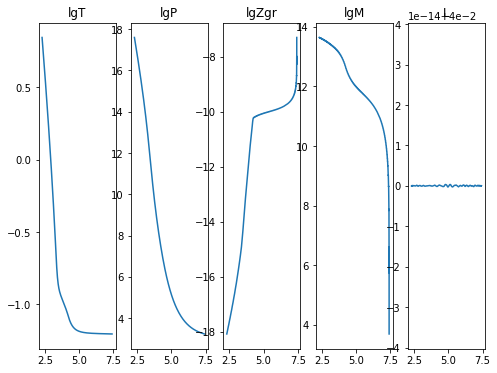

2020-12-06 05:07:31,310 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:07:32,276 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035034
2020-12-06 05:07:32,277 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800371
2020-12-06 05:07:32,278 __main__ 0/1 INFO :: lgP iterate: 17.581556452902703
2020-12-06 05:07:32,278 __main__ 0/1 INFO :: lgM iterate: 13.64107466907511
2020-12-06 05:07:32,279 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950118
2020-12-06 05:07:32,280 __main__ 0/1 INFO :: m iterate: 5.504256300525867e-05
2020-12-06 05:07:32,281 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


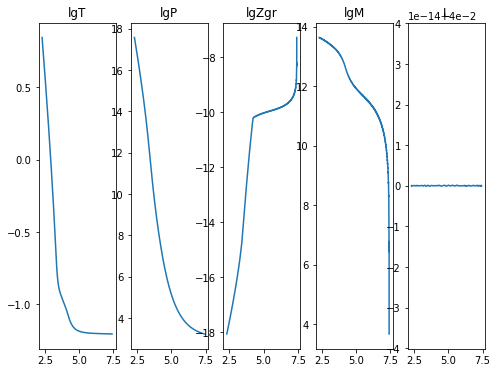

2020-12-06 05:07:35,923 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:07:36,739 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035929
2020-12-06 05:07:36,740 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516525
2020-12-06 05:07:36,740 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-12-06 05:07:36,741 __main__ 0/1 INFO :: lgM iterate: 13.641115571532954
2020-12-06 05:07:36,742 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507862
2020-12-06 05:07:36,743 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-12-06 05:07:36,744 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


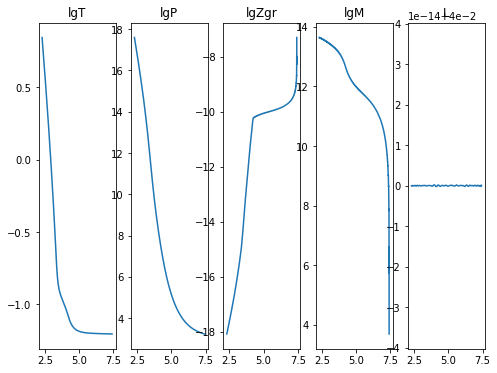

2020-12-06 05:07:40,465 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:07:41,513 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039728
2020-12-06 05:07:41,514 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800361
2020-12-06 05:07:41,515 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-12-06 05:07:41,516 __main__ 0/1 INFO :: lgM iterate: 13.641074669075133
2020-12-06 05:07:41,517 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-12-06 05:07:41,518 __main__ 0/1 INFO :: m iterate: 5.504256300437049e-05
2020-12-06 05:07:41,519 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


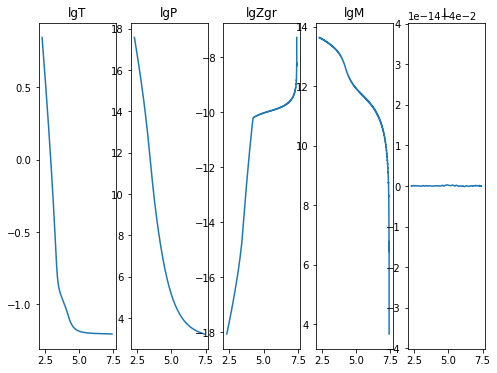

2020-12-06 05:07:45,175 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:07:46,000 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035833
2020-12-06 05:07:46,001 __main__ 0/1 INFO :: lgT iterate: 0.845552306051652
2020-12-06 05:07:46,002 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-12-06 05:07:46,003 __main__ 0/1 INFO :: lgM iterate: 13.641115571532907
2020-12-06 05:07:46,004 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078575
2020-12-06 05:07:46,005 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-12-06 05:07:46,006 __main__ 0/1 INFO :: L iterate: 0.039999999999999966


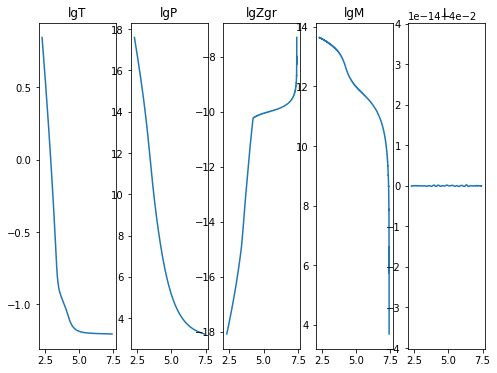

2020-12-06 05:07:49,668 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:07:50,637 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032031292
2020-12-06 05:07:50,638 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800353
2020-12-06 05:07:50,639 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 05:07:50,640 __main__ 0/1 INFO :: lgM iterate: 13.641074669075065
2020-12-06 05:07:50,640 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695007
2020-12-06 05:07:50,641 __main__ 0/1 INFO :: m iterate: 5.504256300437049e-05
2020-12-06 05:07:50,642 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


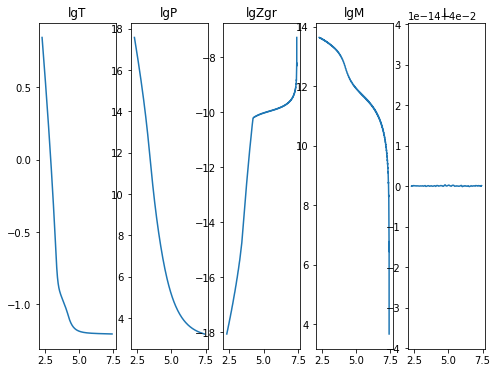

2020-12-06 05:07:54,330 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:07:55,180 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032031315
2020-12-06 05:07:55,181 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516525
2020-12-06 05:07:55,182 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-12-06 05:07:55,183 __main__ 0/1 INFO :: lgM iterate: 13.641115571532946
2020-12-06 05:07:55,184 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078614
2020-12-06 05:07:55,185 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-12-06 05:07:55,186 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


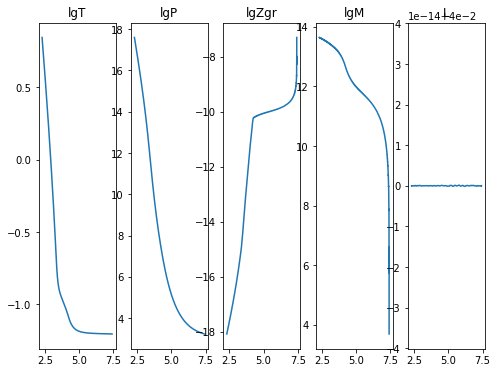

2020-12-06 05:07:58,960 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:07:59,929 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203233
2020-12-06 05:07:59,930 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800345
2020-12-06 05:07:59,931 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 05:07:59,931 __main__ 0/1 INFO :: lgM iterate: 13.641074669075103
2020-12-06 05:07:59,932 __main__ 0/1 INFO :: lgZgr iterate: -18.0699249569501
2020-12-06 05:07:59,933 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-12-06 05:07:59,934 __main__ 0/1 INFO :: L iterate: 0.04


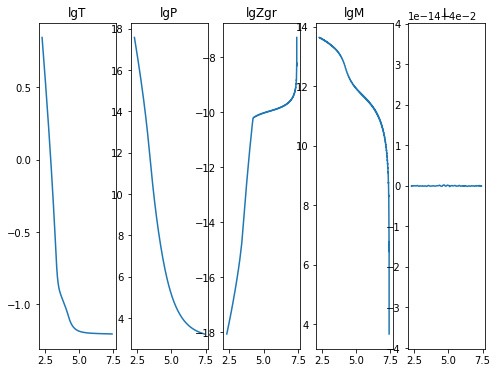

2020-12-06 05:08:03,607 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:08:04,382 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035047
2020-12-06 05:08:04,383 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516525
2020-12-06 05:08:04,384 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-12-06 05:08:04,384 __main__ 0/1 INFO :: lgM iterate: 13.641115571532957
2020-12-06 05:08:04,385 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078632
2020-12-06 05:08:04,386 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-12-06 05:08:04,387 __main__ 0/1 INFO :: L iterate: 0.04


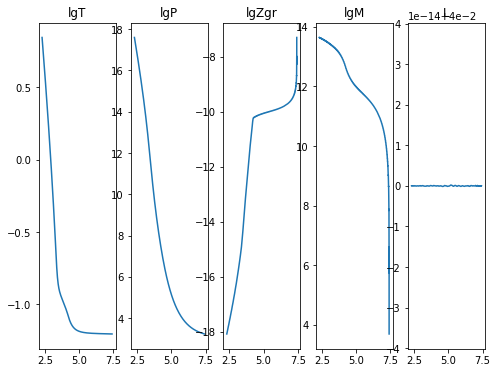

2020-12-06 05:08:08,086 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:08:09,044 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032036117
2020-12-06 05:08:09,045 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800379
2020-12-06 05:08:09,046 __main__ 0/1 INFO :: lgP iterate: 17.58155645290269
2020-12-06 05:08:09,047 __main__ 0/1 INFO :: lgM iterate: 13.641074669075136
2020-12-06 05:08:09,048 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950132
2020-12-06 05:08:09,049 __main__ 0/1 INFO :: m iterate: 5.5042563002594136e-05
2020-12-06 05:08:09,049 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


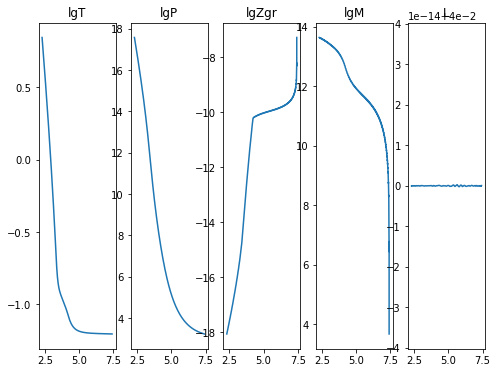

2020-12-06 05:08:12,700 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:08:13,521 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203986
2020-12-06 05:08:13,522 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516532
2020-12-06 05:08:13,523 __main__ 0/1 INFO :: lgP iterate: 17.596817720253295
2020-12-06 05:08:13,524 __main__ 0/1 INFO :: lgM iterate: 13.641115571532916
2020-12-06 05:08:13,525 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507859
2020-12-06 05:08:13,526 __main__ 0/1 INFO :: m iterate: 5.5876451733105625e-05
2020-12-06 05:08:13,526 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


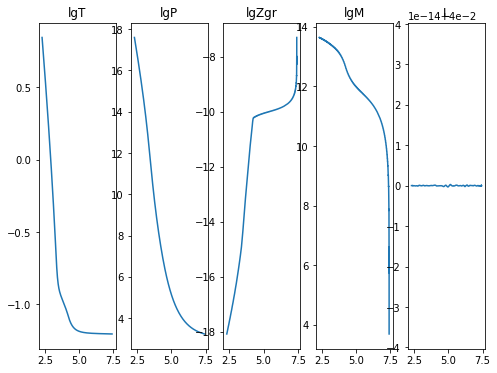

2020-12-06 05:08:17,284 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:08:18,660 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046074
2020-12-06 05:08:18,662 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800353
2020-12-06 05:08:18,663 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-12-06 05:08:18,663 __main__ 0/1 INFO :: lgM iterate: 13.641074669075149
2020-12-06 05:08:18,664 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950125
2020-12-06 05:08:18,665 __main__ 0/1 INFO :: m iterate: 5.504256300525867e-05
2020-12-06 05:08:18,666 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


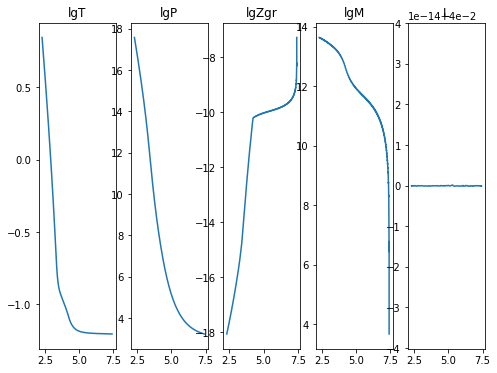

2020-12-06 05:08:23,496 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:08:24,411 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042945
2020-12-06 05:08:24,413 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516528
2020-12-06 05:08:24,413 __main__ 0/1 INFO :: lgP iterate: 17.596817720253288
2020-12-06 05:08:24,414 __main__ 0/1 INFO :: lgM iterate: 13.641115571532943
2020-12-06 05:08:24,415 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078596
2020-12-06 05:08:24,416 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 05:08:24,417 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


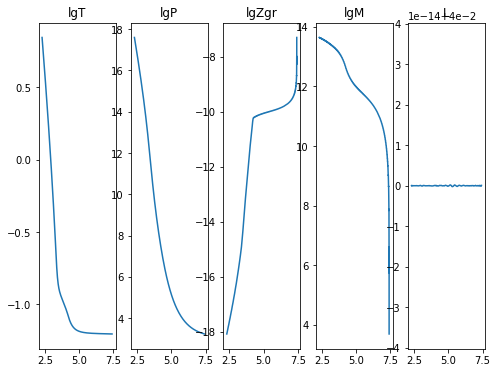

2020-12-06 05:08:28,362 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:08:29,256 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041104
2020-12-06 05:08:29,257 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800353
2020-12-06 05:08:29,258 __main__ 0/1 INFO :: lgP iterate: 17.581556452902664
2020-12-06 05:08:29,259 __main__ 0/1 INFO :: lgM iterate: 13.641074669075113
2020-12-06 05:08:29,260 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-12-06 05:08:29,261 __main__ 0/1 INFO :: m iterate: 5.504256300525867e-05
2020-12-06 05:08:29,262 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


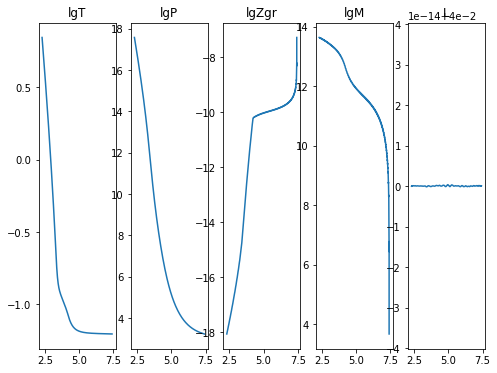

2020-12-06 05:08:33,235 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-12-06 05:08:34,089 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042024
2020-12-06 05:08:34,091 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-12-06 05:08:34,091 __main__ 0/1 INFO :: lgP iterate: 17.596817720253327
2020-12-06 05:08:34,092 __main__ 0/1 INFO :: lgM iterate: 13.641115571532971
2020-12-06 05:08:34,093 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507866
2020-12-06 05:08:34,094 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-12-06 05:08:34,095 __main__ 0/1 INFO :: L iterate: 0.04


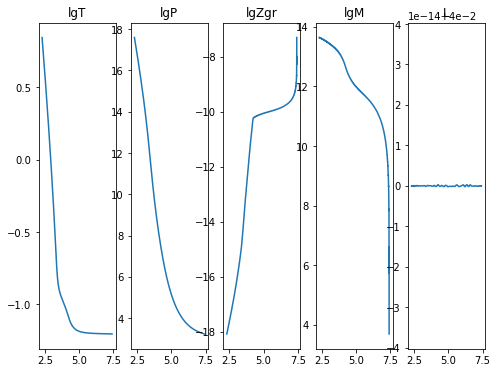

2020-12-06 05:08:38,087 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:08:39,111 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204221
2020-12-06 05:08:39,112 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800366
2020-12-06 05:08:39,114 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-12-06 05:08:39,115 __main__ 0/1 INFO :: lgM iterate: 13.6410746690751
2020-12-06 05:08:39,116 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-12-06 05:08:39,117 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-12-06 05:08:39,117 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


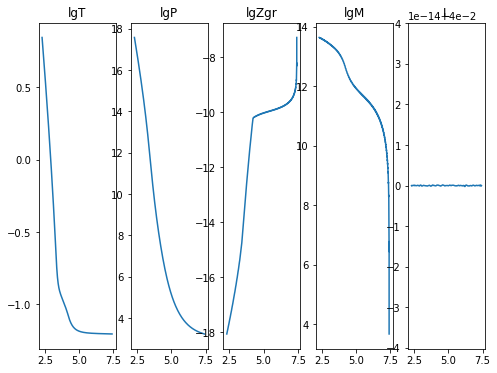

2020-12-06 05:08:42,927 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:08:43,768 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032045634
2020-12-06 05:08:43,769 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516537
2020-12-06 05:08:43,770 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-12-06 05:08:43,771 __main__ 0/1 INFO :: lgM iterate: 13.641115571532985
2020-12-06 05:08:43,771 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078664
2020-12-06 05:08:43,772 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-12-06 05:08:43,773 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


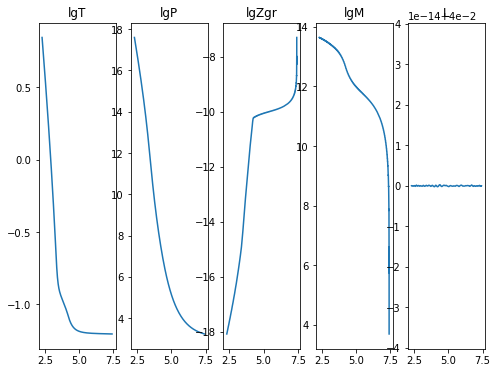

2020-12-06 05:08:47,544 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:08:48,422 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032045672
2020-12-06 05:08:48,423 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800375
2020-12-06 05:08:48,424 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 05:08:48,425 __main__ 0/1 INFO :: lgM iterate: 13.6410746690751
2020-12-06 05:08:48,426 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-12-06 05:08:48,426 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-12-06 05:08:48,427 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


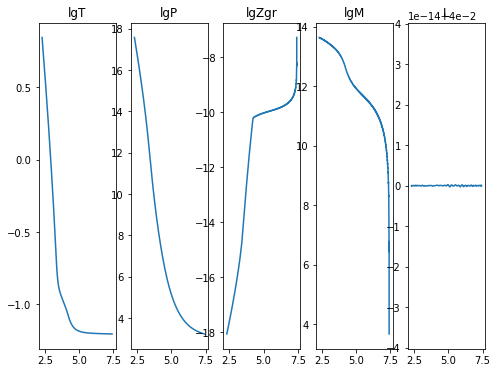

2020-12-06 05:08:52,224 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:08:53,068 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042557
2020-12-06 05:08:53,069 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516533
2020-12-06 05:08:53,070 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-12-06 05:08:53,070 __main__ 0/1 INFO :: lgM iterate: 13.641115571532925
2020-12-06 05:08:53,071 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-12-06 05:08:53,072 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-12-06 05:08:53,073 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


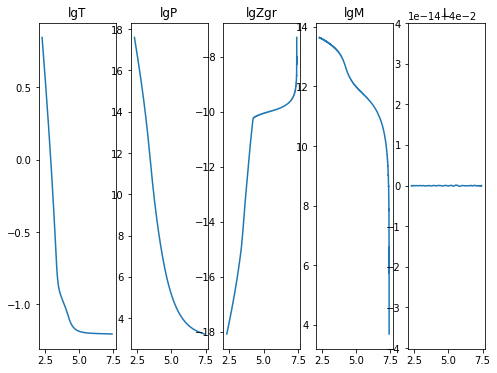

2020-12-06 05:08:56,854 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:08:57,901 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204326
2020-12-06 05:08:57,902 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800348
2020-12-06 05:08:57,903 __main__ 0/1 INFO :: lgP iterate: 17.58155645290265
2020-12-06 05:08:57,904 __main__ 0/1 INFO :: lgM iterate: 13.641074669075113
2020-12-06 05:08:57,905 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950082
2020-12-06 05:08:57,906 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-12-06 05:08:57,907 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


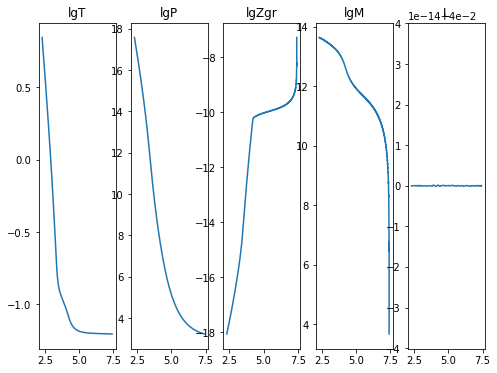

2020-12-06 05:09:01,582 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:09:02,366 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041953
2020-12-06 05:09:02,367 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-12-06 05:09:02,368 __main__ 0/1 INFO :: lgP iterate: 17.59681772025333
2020-12-06 05:09:02,369 __main__ 0/1 INFO :: lgM iterate: 13.641115571532962
2020-12-06 05:09:02,369 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078653
2020-12-06 05:09:02,370 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 05:09:02,371 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


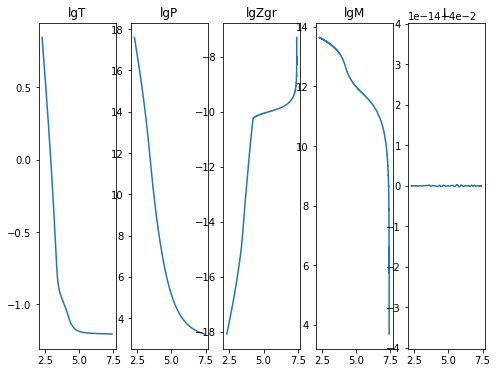

2020-12-06 05:09:06,060 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:09:07,071 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203729
2020-12-06 05:09:07,072 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800366
2020-12-06 05:09:07,073 __main__ 0/1 INFO :: lgP iterate: 17.58155645290269
2020-12-06 05:09:07,074 __main__ 0/1 INFO :: lgM iterate: 13.641074669075104
2020-12-06 05:09:07,075 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950114
2020-12-06 05:09:07,075 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-12-06 05:09:07,076 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


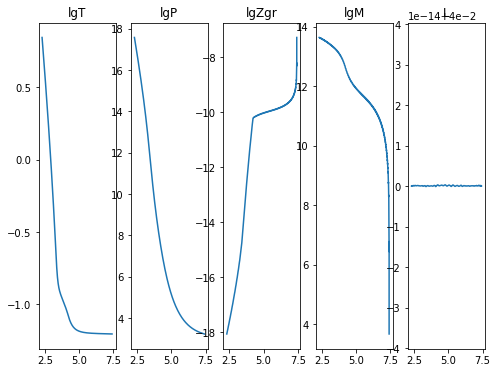

2020-12-06 05:09:10,789 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:09:11,643 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203602
2020-12-06 05:09:11,644 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516537
2020-12-06 05:09:11,646 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-12-06 05:09:11,647 __main__ 0/1 INFO :: lgM iterate: 13.641115571532948
2020-12-06 05:09:11,648 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507863
2020-12-06 05:09:11,649 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-12-06 05:09:11,650 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


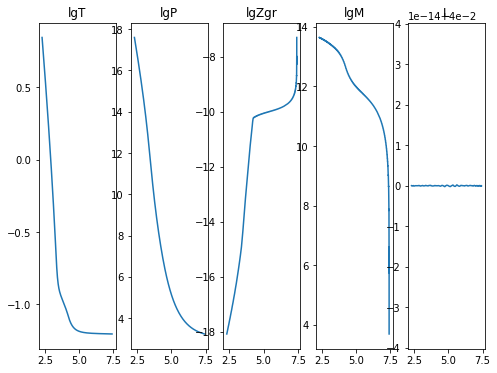

2020-12-06 05:09:15,436 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:09:16,416 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035231
2020-12-06 05:09:16,417 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800378
2020-12-06 05:09:16,418 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-12-06 05:09:16,419 __main__ 0/1 INFO :: lgM iterate: 13.641074669075131
2020-12-06 05:09:16,420 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950125
2020-12-06 05:09:16,421 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 05:09:16,422 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


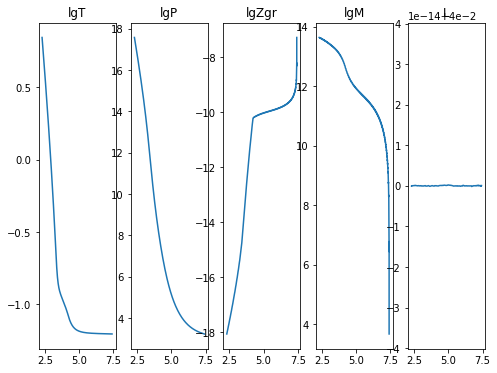

2020-12-06 05:09:20,295 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:09:21,192 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203272
2020-12-06 05:09:21,193 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516528
2020-12-06 05:09:21,194 __main__ 0/1 INFO :: lgP iterate: 17.596817720253277
2020-12-06 05:09:21,195 __main__ 0/1 INFO :: lgM iterate: 13.641115571532925
2020-12-06 05:09:21,196 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507857
2020-12-06 05:09:21,198 __main__ 0/1 INFO :: m iterate: 5.5876451733993804e-05
2020-12-06 05:09:21,199 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


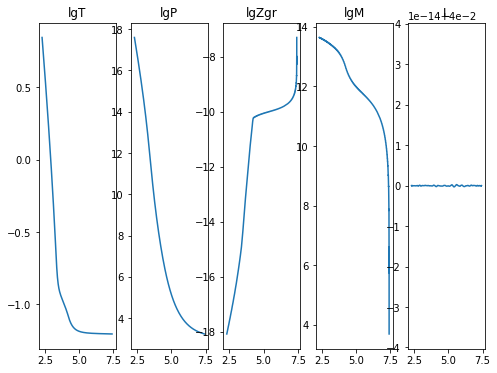

2020-12-06 05:09:24,909 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:09:25,881 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032034405
2020-12-06 05:09:25,882 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800358
2020-12-06 05:09:25,884 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-12-06 05:09:25,884 __main__ 0/1 INFO :: lgM iterate: 13.64107466907511
2020-12-06 05:09:25,885 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-12-06 05:09:25,886 __main__ 0/1 INFO :: m iterate: 5.5042563014140455e-05
2020-12-06 05:09:25,887 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


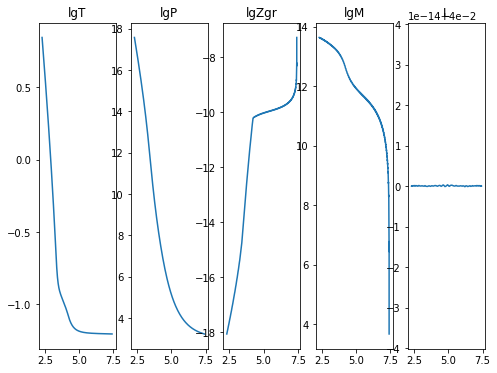

2020-12-06 05:09:29,615 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:09:30,433 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203658
2020-12-06 05:09:30,434 __main__ 0/1 INFO :: lgT iterate: 0.845552306051652
2020-12-06 05:09:30,435 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 05:09:30,436 __main__ 0/1 INFO :: lgM iterate: 13.641115571532938
2020-12-06 05:09:30,437 __main__ 0/1 INFO :: lgZgr iterate: -18.0842848950786
2020-12-06 05:09:30,438 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-12-06 05:09:30,439 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


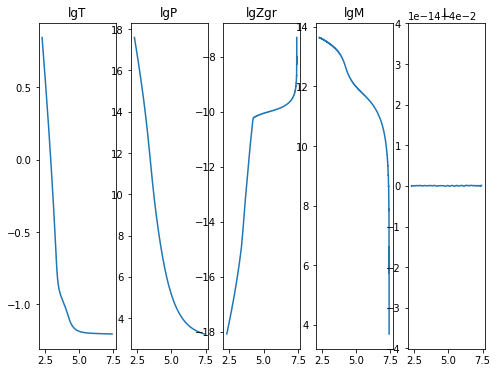

2020-12-06 05:09:34,204 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:09:35,180 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035793
2020-12-06 05:09:35,181 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800367
2020-12-06 05:09:35,182 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-12-06 05:09:35,183 __main__ 0/1 INFO :: lgM iterate: 13.641074669075149
2020-12-06 05:09:35,183 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950132
2020-12-06 05:09:35,184 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 05:09:35,185 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


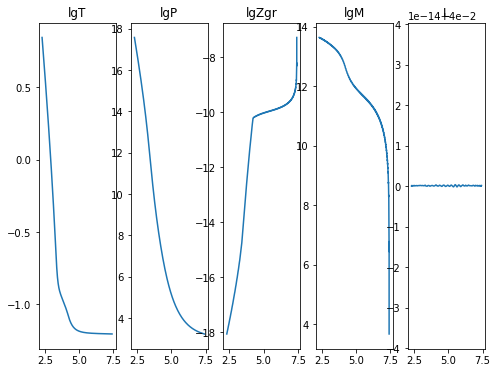

2020-12-06 05:09:38,853 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:09:39,705 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032034021
2020-12-06 05:09:39,706 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-12-06 05:09:39,706 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 05:09:39,707 __main__ 0/1 INFO :: lgM iterate: 13.641115571532852
2020-12-06 05:09:39,708 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507855
2020-12-06 05:09:39,709 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 05:09:39,710 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


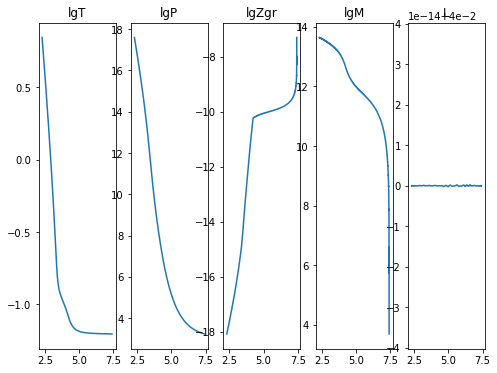

2020-12-06 05:09:43,408 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:09:44,383 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035722
2020-12-06 05:09:44,384 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800346
2020-12-06 05:09:44,385 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-12-06 05:09:44,385 __main__ 0/1 INFO :: lgM iterate: 13.641074669075122
2020-12-06 05:09:44,386 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-12-06 05:09:44,387 __main__ 0/1 INFO :: m iterate: 5.5042563002594136e-05
2020-12-06 05:09:44,388 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


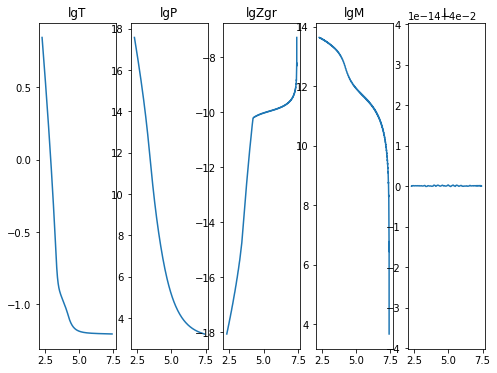

2020-12-06 05:09:48,092 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:09:48,914 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038766
2020-12-06 05:09:48,915 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516531
2020-12-06 05:09:48,916 __main__ 0/1 INFO :: lgP iterate: 17.596817720253327
2020-12-06 05:09:48,917 __main__ 0/1 INFO :: lgM iterate: 13.641115571532927
2020-12-06 05:09:48,918 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-12-06 05:09:48,919 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-12-06 05:09:48,919 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


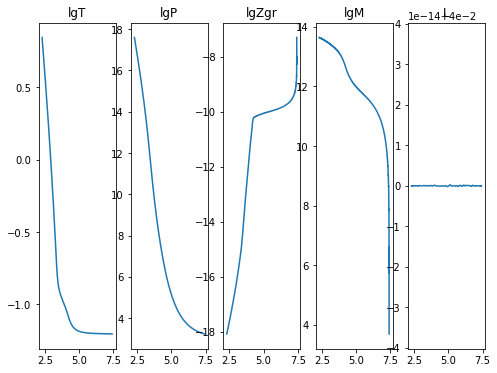

2020-12-06 05:09:52,690 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:09:53,709 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204018
2020-12-06 05:09:53,711 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800346
2020-12-06 05:09:53,711 __main__ 0/1 INFO :: lgP iterate: 17.581556452902653
2020-12-06 05:09:53,713 __main__ 0/1 INFO :: lgM iterate: 13.641074669075131
2020-12-06 05:09:53,714 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-12-06 05:09:53,715 __main__ 0/1 INFO :: m iterate: 5.504256300525867e-05
2020-12-06 05:09:53,716 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


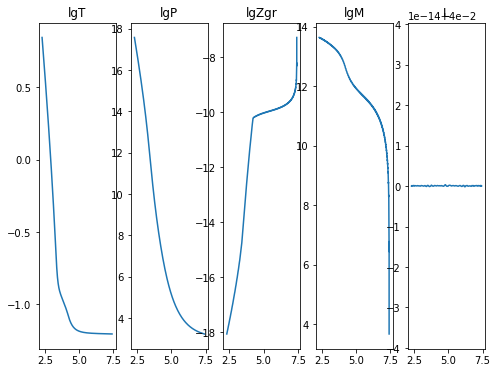

2020-12-06 05:09:57,419 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:09:58,211 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203788
2020-12-06 05:09:58,212 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516539
2020-12-06 05:09:58,213 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 05:09:58,214 __main__ 0/1 INFO :: lgM iterate: 13.641115571532914
2020-12-06 05:09:58,214 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507859
2020-12-06 05:09:58,215 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-12-06 05:09:58,216 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


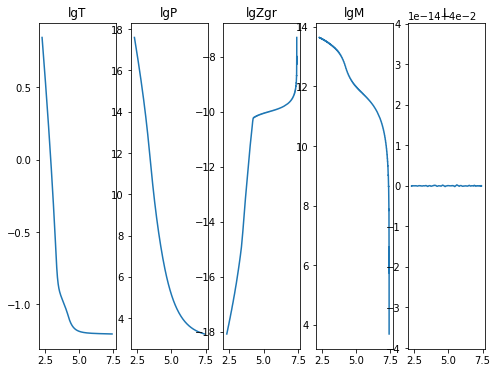

2020-12-06 05:10:01,902 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:10:02,847 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032034876
2020-12-06 05:10:02,850 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800336
2020-12-06 05:10:02,853 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-12-06 05:10:02,856 __main__ 0/1 INFO :: lgM iterate: 13.641074669075095
2020-12-06 05:10:02,859 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-12-06 05:10:02,860 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-12-06 05:10:02,865 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


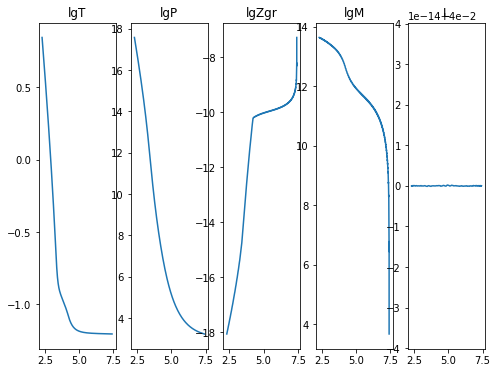

2020-12-06 05:10:06,579 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:10:07,437 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040862
2020-12-06 05:10:07,438 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516553
2020-12-06 05:10:07,439 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-12-06 05:10:07,440 __main__ 0/1 INFO :: lgM iterate: 13.641115571532954
2020-12-06 05:10:07,441 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507864
2020-12-06 05:10:07,442 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-12-06 05:10:07,443 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


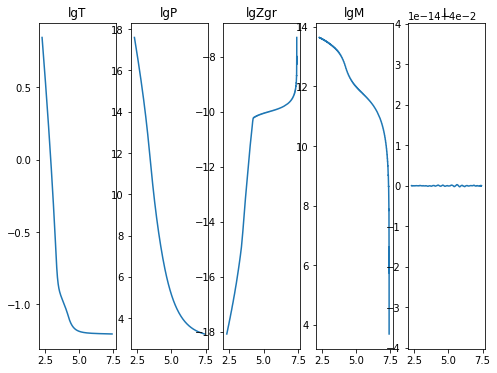

2020-12-06 05:10:11,260 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:10:12,208 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046984
2020-12-06 05:10:12,209 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800363
2020-12-06 05:10:12,210 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-12-06 05:10:12,211 __main__ 0/1 INFO :: lgM iterate: 13.64107466907507
2020-12-06 05:10:12,212 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695006
2020-12-06 05:10:12,214 __main__ 0/1 INFO :: m iterate: 5.504256301147592e-05
2020-12-06 05:10:12,215 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


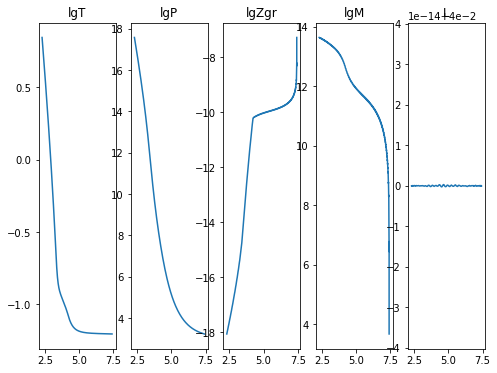

2020-12-06 05:10:15,931 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:10:16,771 __main__ 0/1 INFO :: Perturbation norm: 1.74046460320478
2020-12-06 05:10:16,772 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516525
2020-12-06 05:10:16,773 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-12-06 05:10:16,774 __main__ 0/1 INFO :: lgM iterate: 13.64111557153293
2020-12-06 05:10:16,775 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-12-06 05:10:16,776 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-12-06 05:10:16,777 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


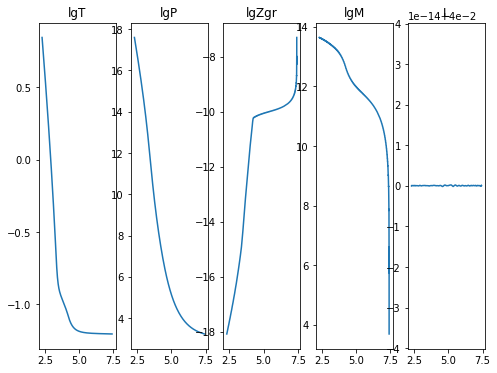

2020-12-06 05:10:20,530 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:10:21,530 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032049054
2020-12-06 05:10:21,531 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800356
2020-12-06 05:10:21,532 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-12-06 05:10:21,532 __main__ 0/1 INFO :: lgM iterate: 13.641074669075111
2020-12-06 05:10:21,533 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950093
2020-12-06 05:10:21,534 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-12-06 05:10:21,535 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


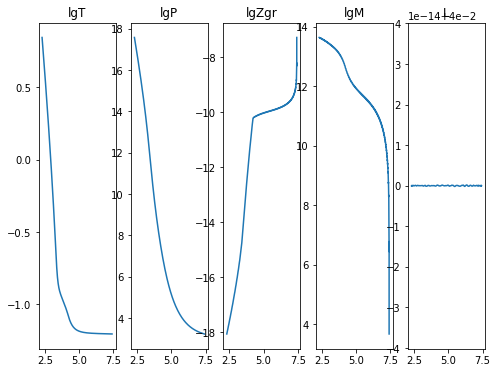

2020-12-06 05:10:25,254 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:10:26,085 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040936
2020-12-06 05:10:26,086 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516523
2020-12-06 05:10:26,087 __main__ 0/1 INFO :: lgP iterate: 17.596817720253277
2020-12-06 05:10:26,088 __main__ 0/1 INFO :: lgM iterate: 13.641115571532925
2020-12-06 05:10:26,088 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078582
2020-12-06 05:10:26,089 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-12-06 05:10:26,090 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


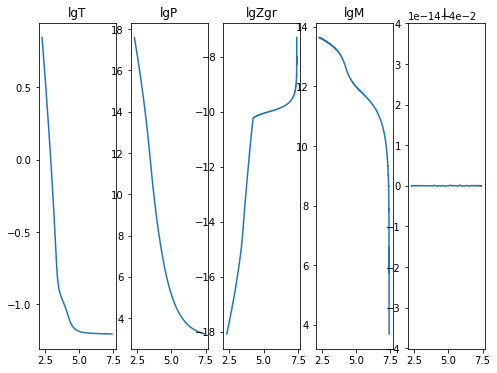

2020-12-06 05:10:29,875 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:10:30,840 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032036015
2020-12-06 05:10:30,841 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800365
2020-12-06 05:10:30,842 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-12-06 05:10:30,842 __main__ 0/1 INFO :: lgM iterate: 13.641074669075092
2020-12-06 05:10:30,843 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695008
2020-12-06 05:10:30,844 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-12-06 05:10:30,845 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


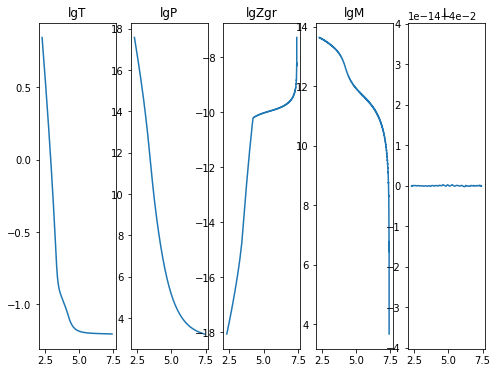

2020-12-06 05:10:34,585 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:10:35,422 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032034283
2020-12-06 05:10:35,423 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516528
2020-12-06 05:10:35,424 __main__ 0/1 INFO :: lgP iterate: 17.596817720253277
2020-12-06 05:10:35,425 __main__ 0/1 INFO :: lgM iterate: 13.641115571532954
2020-12-06 05:10:35,425 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078593
2020-12-06 05:10:35,426 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-12-06 05:10:35,427 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


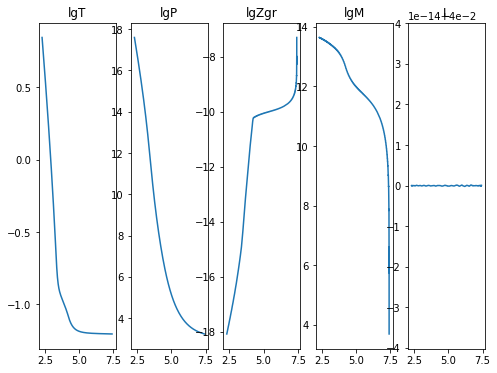

2020-12-06 05:10:39,117 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:10:40,067 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203161
2020-12-06 05:10:40,068 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800376
2020-12-06 05:10:40,069 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-12-06 05:10:40,070 __main__ 0/1 INFO :: lgM iterate: 13.64107466907512
2020-12-06 05:10:40,070 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950114
2020-12-06 05:10:40,071 __main__ 0/1 INFO :: m iterate: 5.504256300525867e-05
2020-12-06 05:10:40,072 __main__ 0/1 INFO :: L iterate: 0.04


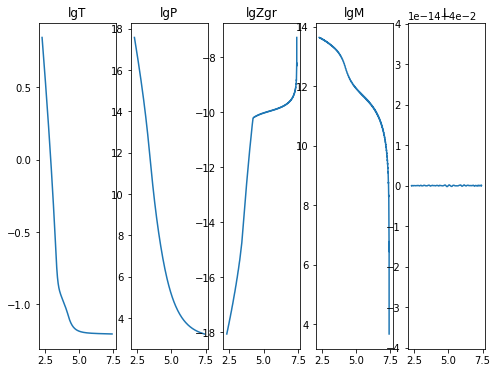

2020-12-06 05:10:43,775 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:10:44,586 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040287
2020-12-06 05:10:44,587 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516529
2020-12-06 05:10:44,588 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-12-06 05:10:44,589 __main__ 0/1 INFO :: lgM iterate: 13.64111557153297
2020-12-06 05:10:44,590 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078653
2020-12-06 05:10:44,591 __main__ 0/1 INFO :: m iterate: 5.587645172511202e-05
2020-12-06 05:10:44,592 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


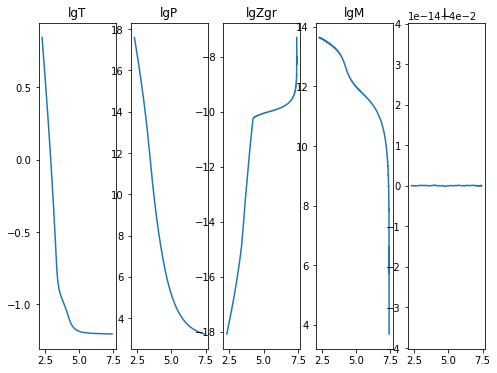

2020-12-06 05:10:48,382 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:10:49,336 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032045228
2020-12-06 05:10:49,338 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800353
2020-12-06 05:10:49,338 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 05:10:49,339 __main__ 0/1 INFO :: lgM iterate: 13.64107466907511
2020-12-06 05:10:49,340 __main__ 0/1 INFO :: lgZgr iterate: -18.0699249569501
2020-12-06 05:10:49,341 __main__ 0/1 INFO :: m iterate: 5.504256300437049e-05
2020-12-06 05:10:49,342 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


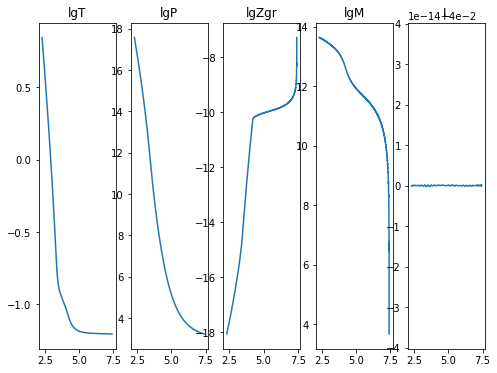

2020-12-06 05:10:53,042 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:10:53,934 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041469
2020-12-06 05:10:53,935 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516525
2020-12-06 05:10:53,936 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 05:10:53,936 __main__ 0/1 INFO :: lgM iterate: 13.641115571532925
2020-12-06 05:10:53,937 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078596
2020-12-06 05:10:53,938 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 05:10:53,939 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


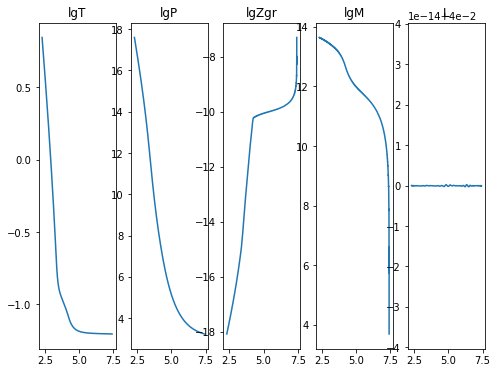

2020-12-06 05:10:57,761 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:10:58,867 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040476
2020-12-06 05:10:58,868 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800367
2020-12-06 05:10:58,869 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-12-06 05:10:58,870 __main__ 0/1 INFO :: lgM iterate: 13.641074669075135
2020-12-06 05:10:58,871 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695013
2020-12-06 05:10:58,872 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 05:10:58,873 __main__ 0/1 INFO :: L iterate: 0.04


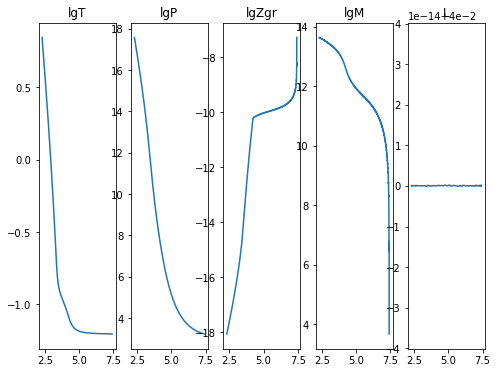

2020-12-06 05:11:02,550 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:11:03,367 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204117
2020-12-06 05:11:03,368 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516534
2020-12-06 05:11:03,369 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-12-06 05:11:03,370 __main__ 0/1 INFO :: lgM iterate: 13.641115571532946
2020-12-06 05:11:03,371 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-12-06 05:11:03,372 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-12-06 05:11:03,373 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


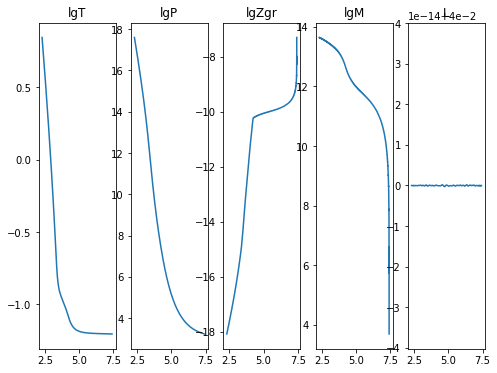

2020-12-06 05:11:07,140 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:11:08,111 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204178
2020-12-06 05:11:08,112 __main__ 0/1 INFO :: lgT iterate: 0.844929764780036
2020-12-06 05:11:08,113 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-12-06 05:11:08,114 __main__ 0/1 INFO :: lgM iterate: 13.64107466907513
2020-12-06 05:11:08,114 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950103
2020-12-06 05:11:08,115 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 05:11:08,116 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


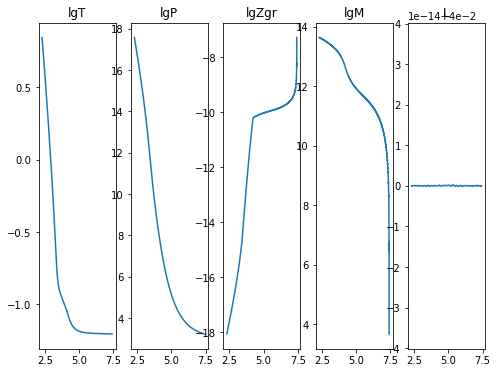

2020-12-06 05:11:11,807 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:11:12,649 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041944
2020-12-06 05:11:12,650 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516521
2020-12-06 05:11:12,651 __main__ 0/1 INFO :: lgP iterate: 17.596817720253284
2020-12-06 05:11:12,652 __main__ 0/1 INFO :: lgM iterate: 13.641115571532932
2020-12-06 05:11:12,652 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078582
2020-12-06 05:11:12,653 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-12-06 05:11:12,654 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


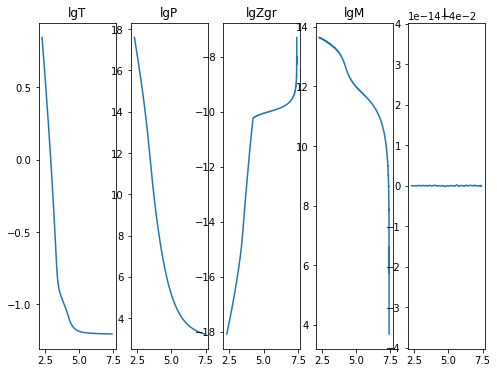

2020-12-06 05:11:16,386 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:11:17,338 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032045026
2020-12-06 05:11:17,339 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800328
2020-12-06 05:11:17,340 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 05:11:17,340 __main__ 0/1 INFO :: lgM iterate: 13.641074669075135
2020-12-06 05:11:17,341 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950118
2020-12-06 05:11:17,342 __main__ 0/1 INFO :: m iterate: 5.504256300170596e-05
2020-12-06 05:11:17,343 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


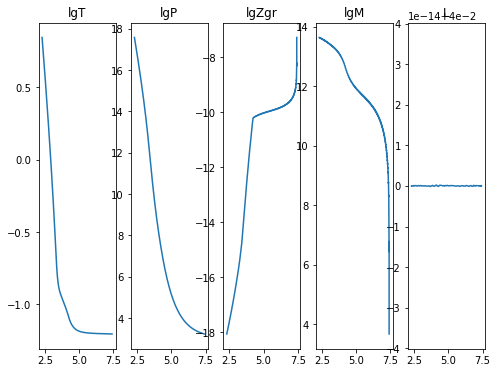

2020-12-06 05:11:21,229 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-12-06 05:11:22,041 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044047
2020-12-06 05:11:22,042 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516531
2020-12-06 05:11:22,043 __main__ 0/1 INFO :: lgP iterate: 17.596817720253288
2020-12-06 05:11:22,044 __main__ 0/1 INFO :: lgM iterate: 13.641115571532884
2020-12-06 05:11:22,045 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507856
2020-12-06 05:11:22,047 __main__ 0/1 INFO :: m iterate: 5.587645172511202e-05
2020-12-06 05:11:22,048 __main__ 0/1 INFO :: L iterate: 0.04


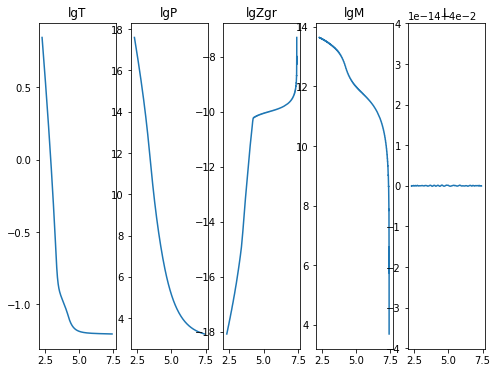

2020-12-06 05:11:25,848 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:11:26,853 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042699
2020-12-06 05:11:26,854 __main__ 0/1 INFO :: lgT iterate: 0.844929764780034
2020-12-06 05:11:26,855 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 05:11:26,856 __main__ 0/1 INFO :: lgM iterate: 13.641074669075058
2020-12-06 05:11:26,856 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695006
2020-12-06 05:11:26,857 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-12-06 05:11:26,858 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


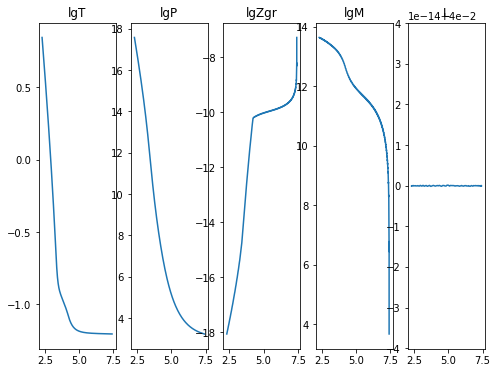

2020-12-06 05:11:30,627 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-12-06 05:11:31,449 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046012
2020-12-06 05:11:31,450 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516533
2020-12-06 05:11:31,450 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 05:11:31,451 __main__ 0/1 INFO :: lgM iterate: 13.64111557153298
2020-12-06 05:11:31,452 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078635
2020-12-06 05:11:31,453 __main__ 0/1 INFO :: m iterate: 5.587645173488198e-05
2020-12-06 05:11:31,454 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


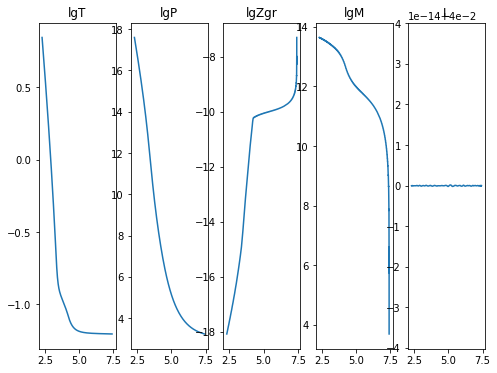

2020-12-06 05:11:35,164 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:11:36,119 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032047666
2020-12-06 05:11:36,120 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800351
2020-12-06 05:11:36,121 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-12-06 05:11:36,122 __main__ 0/1 INFO :: lgM iterate: 13.641074669075124
2020-12-06 05:11:36,123 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-12-06 05:11:36,124 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-12-06 05:11:36,124 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


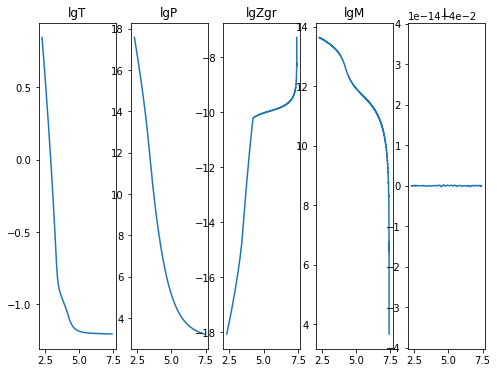

2020-12-06 05:11:39,818 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:11:40,644 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044848
2020-12-06 05:11:40,645 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516533
2020-12-06 05:11:40,646 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-12-06 05:11:40,646 __main__ 0/1 INFO :: lgM iterate: 13.641115571532971
2020-12-06 05:11:40,647 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078646
2020-12-06 05:11:40,648 __main__ 0/1 INFO :: m iterate: 5.587645173577016e-05
2020-12-06 05:11:40,649 __main__ 0/1 INFO :: L iterate: 0.04


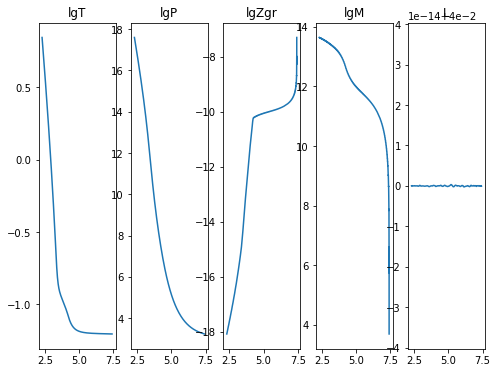

2020-12-06 05:11:44,433 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:11:45,374 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040767
2020-12-06 05:11:45,375 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800388
2020-12-06 05:11:45,376 __main__ 0/1 INFO :: lgP iterate: 17.58155645290269
2020-12-06 05:11:45,377 __main__ 0/1 INFO :: lgM iterate: 13.641074669075119
2020-12-06 05:11:45,378 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950114
2020-12-06 05:11:45,379 __main__ 0/1 INFO :: m iterate: 5.504256300437049e-05
2020-12-06 05:11:45,380 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


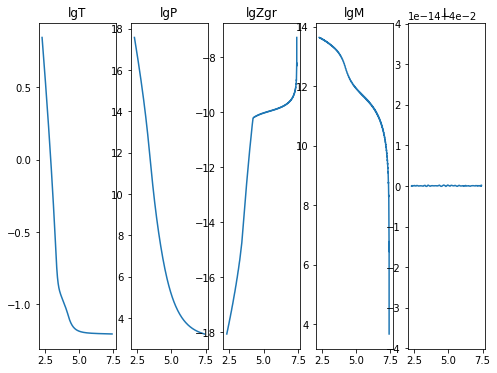

2020-12-06 05:11:49,084 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:11:49,886 __main__ 0/1 INFO :: Perturbation norm: 1.74046460320419
2020-12-06 05:11:49,887 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516521
2020-12-06 05:11:49,888 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-12-06 05:11:49,889 __main__ 0/1 INFO :: lgM iterate: 13.641115571532993
2020-12-06 05:11:49,889 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078646
2020-12-06 05:11:49,890 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-12-06 05:11:49,891 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


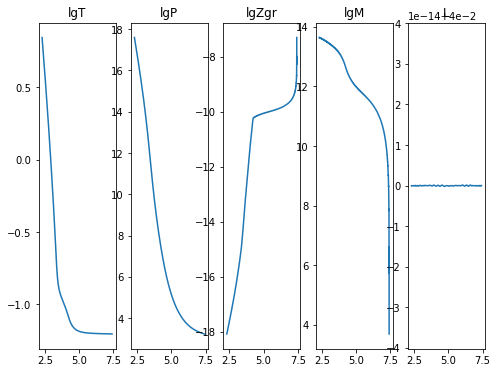

2020-12-06 05:11:53,576 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:11:54,484 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032047097
2020-12-06 05:11:54,485 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800351
2020-12-06 05:11:54,486 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-12-06 05:11:54,487 __main__ 0/1 INFO :: lgM iterate: 13.641074669075138
2020-12-06 05:11:54,488 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950114
2020-12-06 05:11:54,489 __main__ 0/1 INFO :: m iterate: 5.504256300437049e-05
2020-12-06 05:11:54,490 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


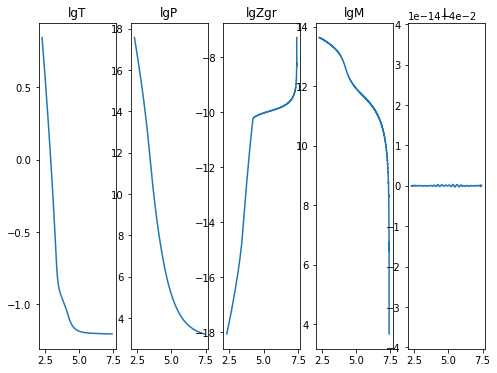

2020-12-06 05:11:58,187 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:11:59,019 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032047086
2020-12-06 05:11:59,020 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516525
2020-12-06 05:11:59,021 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-12-06 05:11:59,022 __main__ 0/1 INFO :: lgM iterate: 13.641115571532886
2020-12-06 05:11:59,023 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078582
2020-12-06 05:11:59,024 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-12-06 05:11:59,024 __main__ 0/1 INFO :: L iterate: 0.04


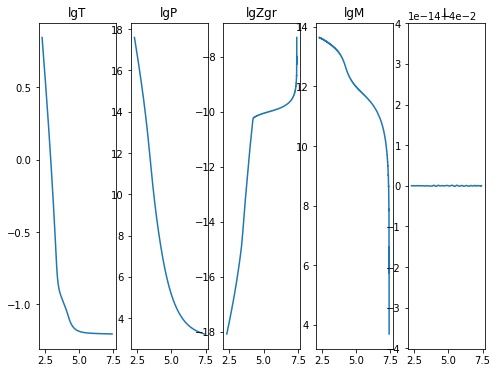

2020-12-06 05:12:02,794 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:12:03,770 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043853
2020-12-06 05:12:03,772 __main__ 0/1 INFO :: lgT iterate: 0.844929764780036
2020-12-06 05:12:03,772 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-12-06 05:12:03,773 __main__ 0/1 INFO :: lgM iterate: 13.64107466907505
2020-12-06 05:12:03,774 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695006
2020-12-06 05:12:03,775 __main__ 0/1 INFO :: m iterate: 5.504256300437049e-05
2020-12-06 05:12:03,776 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


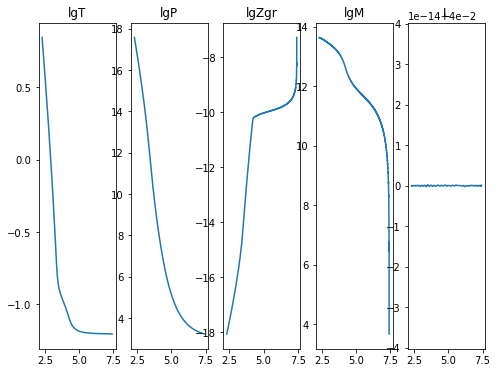

2020-12-06 05:12:07,486 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:12:08,319 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203834
2020-12-06 05:12:08,320 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516534
2020-12-06 05:12:08,321 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 05:12:08,322 __main__ 0/1 INFO :: lgM iterate: 13.641115571532925
2020-12-06 05:12:08,323 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078607
2020-12-06 05:12:08,324 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-12-06 05:12:08,325 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


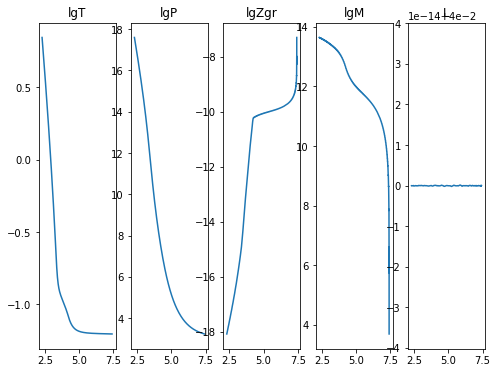

2020-12-06 05:12:12,340 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-12-06 05:12:13,324 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032033693
2020-12-06 05:12:13,325 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800378
2020-12-06 05:12:13,326 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-12-06 05:12:13,327 __main__ 0/1 INFO :: lgM iterate: 13.641074669075111
2020-12-06 05:12:13,328 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950103
2020-12-06 05:12:13,329 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-12-06 05:12:13,329 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


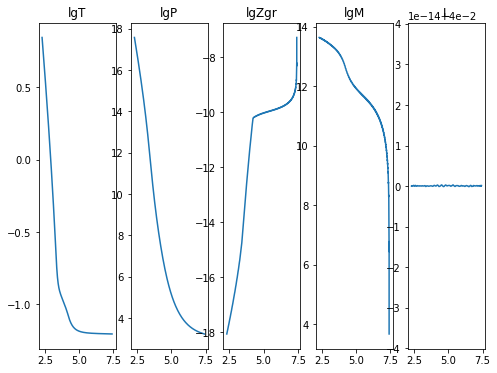

2020-12-06 05:12:17,062 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:12:17,924 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203371
2020-12-06 05:12:17,925 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516522
2020-12-06 05:12:17,926 __main__ 0/1 INFO :: lgP iterate: 17.596817720253316
2020-12-06 05:12:17,927 __main__ 0/1 INFO :: lgM iterate: 13.641115571532952
2020-12-06 05:12:17,929 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078635
2020-12-06 05:12:17,931 __main__ 0/1 INFO :: m iterate: 5.5876451733105625e-05
2020-12-06 05:12:17,932 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


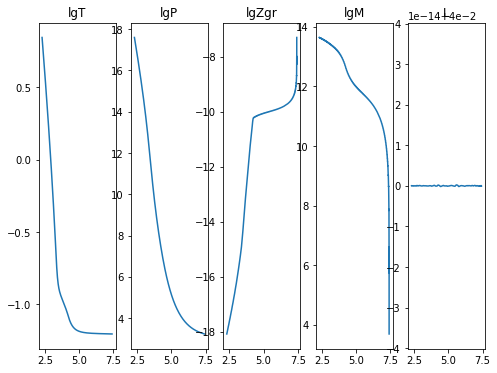

2020-12-06 05:12:21,704 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:12:22,670 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203408
2020-12-06 05:12:22,671 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800368
2020-12-06 05:12:22,672 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-12-06 05:12:22,672 __main__ 0/1 INFO :: lgM iterate: 13.641074669075135
2020-12-06 05:12:22,673 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-12-06 05:12:22,674 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-12-06 05:12:22,675 __main__ 0/1 INFO :: L iterate: 0.04


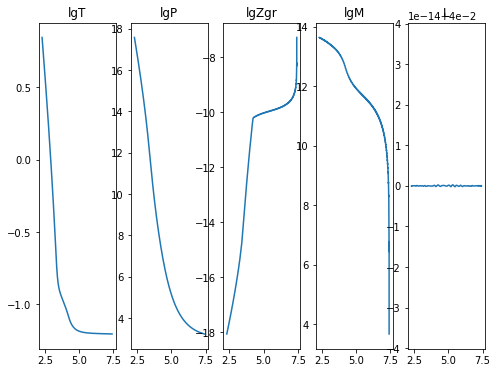

2020-12-06 05:12:26,372 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:12:27,200 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032033302
2020-12-06 05:12:27,201 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516515
2020-12-06 05:12:27,202 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 05:12:27,202 __main__ 0/1 INFO :: lgM iterate: 13.641115571532964
2020-12-06 05:12:27,203 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-12-06 05:12:27,204 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-12-06 05:12:27,205 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


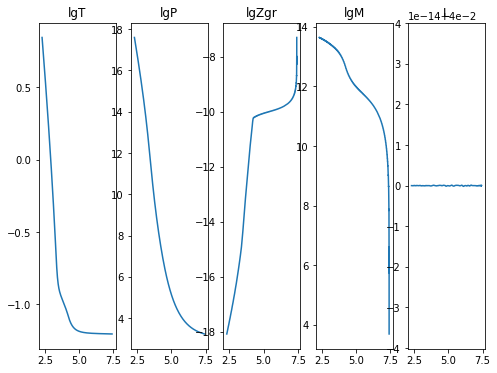

2020-12-06 05:12:30,933 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:12:31,930 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032034483
2020-12-06 05:12:31,932 __main__ 0/1 INFO :: lgT iterate: 0.844929764780036
2020-12-06 05:12:31,932 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-12-06 05:12:31,933 __main__ 0/1 INFO :: lgM iterate: 13.641074669075088
2020-12-06 05:12:31,934 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695007
2020-12-06 05:12:31,935 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-12-06 05:12:31,936 __main__ 0/1 INFO :: L iterate: 0.04


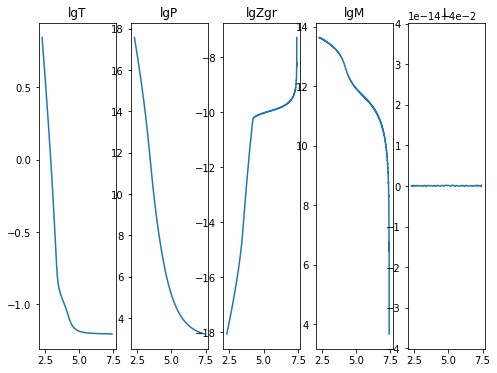

2020-12-06 05:12:35,631 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:12:36,453 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032034041
2020-12-06 05:12:36,454 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516505
2020-12-06 05:12:36,454 __main__ 0/1 INFO :: lgP iterate: 17.596817720253284
2020-12-06 05:12:36,455 __main__ 0/1 INFO :: lgM iterate: 13.641115571532964
2020-12-06 05:12:36,456 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078614
2020-12-06 05:12:36,457 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-12-06 05:12:36,457 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


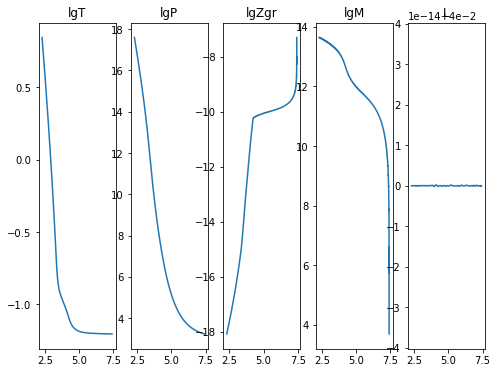

2020-12-06 05:12:40,230 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:12:41,193 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032032864
2020-12-06 05:12:41,194 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800372
2020-12-06 05:12:41,195 __main__ 0/1 INFO :: lgP iterate: 17.58155645290269
2020-12-06 05:12:41,195 __main__ 0/1 INFO :: lgM iterate: 13.64107466907516
2020-12-06 05:12:41,196 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950146
2020-12-06 05:12:41,197 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-12-06 05:12:41,198 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


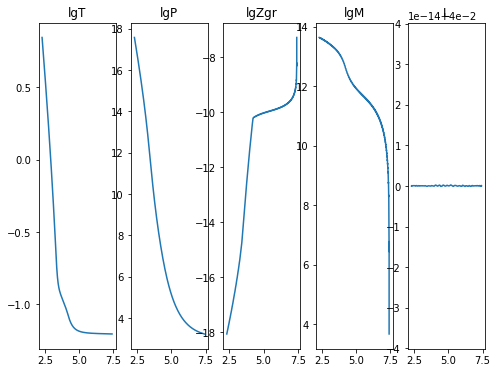

2020-12-06 05:12:44,909 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:12:45,739 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035485
2020-12-06 05:12:45,740 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516517
2020-12-06 05:12:45,741 __main__ 0/1 INFO :: lgP iterate: 17.596817720253288
2020-12-06 05:12:45,742 __main__ 0/1 INFO :: lgM iterate: 13.641115571532907
2020-12-06 05:12:45,743 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507857
2020-12-06 05:12:45,743 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-12-06 05:12:45,744 __main__ 0/1 INFO :: L iterate: 0.04000000000000004


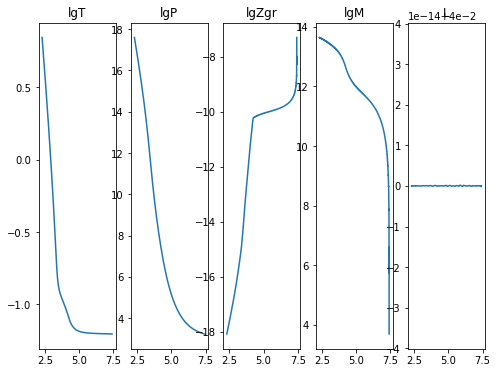

2020-12-06 05:12:49,435 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:12:50,444 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035975
2020-12-06 05:12:50,445 __main__ 0/1 INFO :: lgT iterate: 0.844929764780039
2020-12-06 05:12:50,446 __main__ 0/1 INFO :: lgP iterate: 17.581556452902696
2020-12-06 05:12:50,447 __main__ 0/1 INFO :: lgM iterate: 13.641074669075135
2020-12-06 05:12:50,448 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950135
2020-12-06 05:12:50,449 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-12-06 05:12:50,450 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


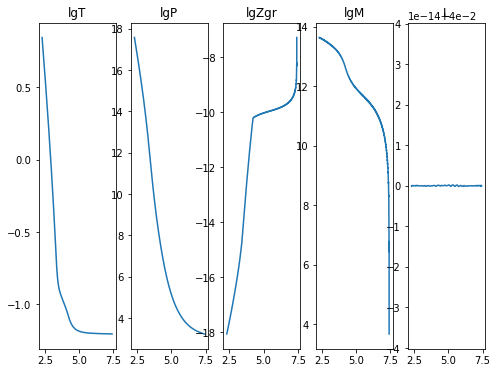

2020-12-06 05:12:54,165 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:12:55,038 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037308
2020-12-06 05:12:55,039 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516528
2020-12-06 05:12:55,040 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-12-06 05:12:55,041 __main__ 0/1 INFO :: lgM iterate: 13.641115571532936
2020-12-06 05:12:55,042 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-12-06 05:12:55,043 __main__ 0/1 INFO :: m iterate: 5.5876451733105625e-05
2020-12-06 05:12:55,044 __main__ 0/1 INFO :: L iterate: 0.039999999999999966


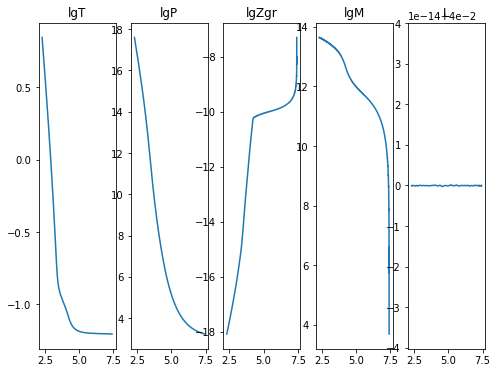

2020-12-06 05:12:58,820 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:12:59,808 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203983
2020-12-06 05:12:59,809 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800373
2020-12-06 05:12:59,810 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 05:12:59,811 __main__ 0/1 INFO :: lgM iterate: 13.641074669075133
2020-12-06 05:12:59,812 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950118
2020-12-06 05:12:59,813 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-12-06 05:12:59,814 __main__ 0/1 INFO :: L iterate: 0.03999999999999996


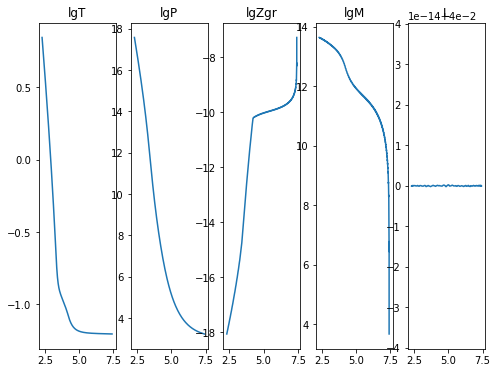

2020-12-06 05:13:03,521 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:13:04,322 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041668
2020-12-06 05:13:04,323 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-12-06 05:13:04,324 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-12-06 05:13:04,324 __main__ 0/1 INFO :: lgM iterate: 13.641115571532946
2020-12-06 05:13:04,325 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-12-06 05:13:04,326 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-12-06 05:13:04,327 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


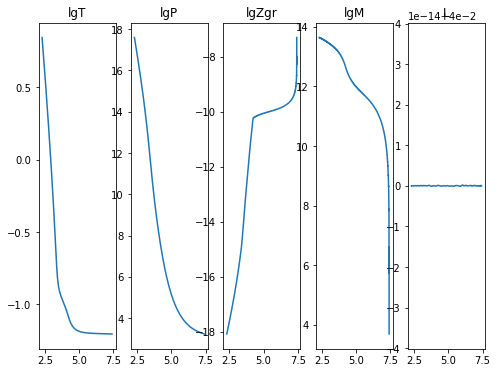

2020-12-06 05:13:08,026 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:13:08,989 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042945
2020-12-06 05:13:08,990 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800336
2020-12-06 05:13:08,991 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-12-06 05:13:08,992 __main__ 0/1 INFO :: lgM iterate: 13.641074669075099
2020-12-06 05:13:08,993 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950086
2020-12-06 05:13:08,994 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 05:13:08,994 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


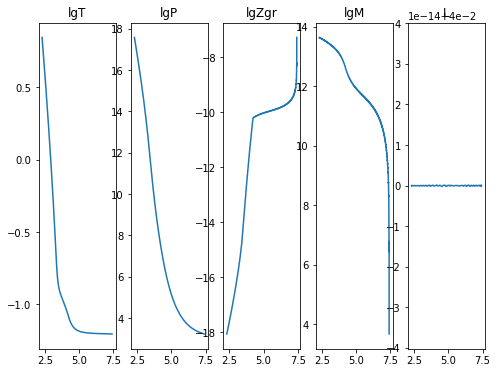

2020-12-06 05:13:12,697 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:13:13,521 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044329
2020-12-06 05:13:13,522 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516514
2020-12-06 05:13:13,523 __main__ 0/1 INFO :: lgP iterate: 17.596817720253327
2020-12-06 05:13:13,523 __main__ 0/1 INFO :: lgM iterate: 13.641115571532946
2020-12-06 05:13:13,524 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507864
2020-12-06 05:13:13,525 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 05:13:13,526 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


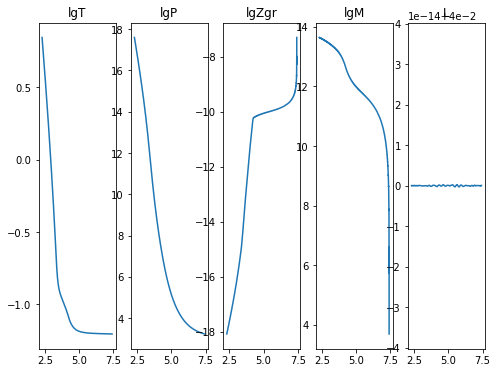

2020-12-06 05:13:17,311 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:13:18,427 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046176
2020-12-06 05:13:18,428 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800382
2020-12-06 05:13:18,429 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-12-06 05:13:18,430 __main__ 0/1 INFO :: lgM iterate: 13.641074669075067
2020-12-06 05:13:18,430 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950057
2020-12-06 05:13:18,431 __main__ 0/1 INFO :: m iterate: 5.5042563003482314e-05
2020-12-06 05:13:18,432 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


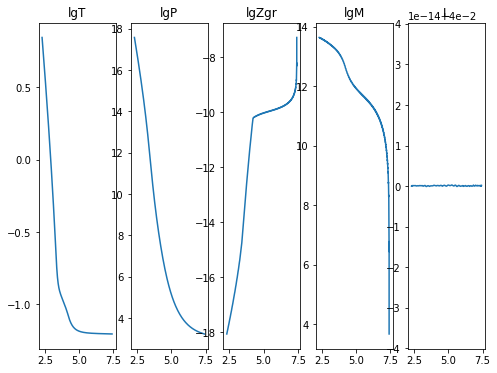

2020-12-06 05:13:22,414 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:13:23,263 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032045687
2020-12-06 05:13:23,264 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516529
2020-12-06 05:13:23,265 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 05:13:23,265 __main__ 0/1 INFO :: lgM iterate: 13.641115571532884
2020-12-06 05:13:23,266 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078568
2020-12-06 05:13:23,267 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 05:13:23,268 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


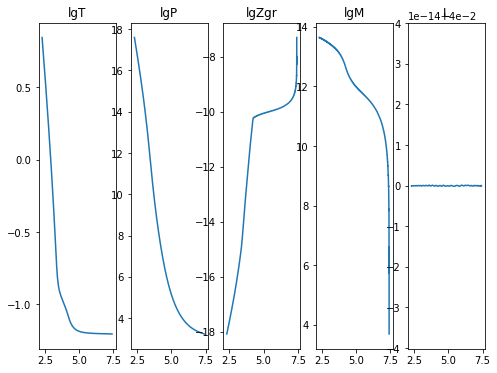

2020-12-06 05:13:27,127 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:13:28,195 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046538
2020-12-06 05:13:28,196 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800353
2020-12-06 05:13:28,197 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-12-06 05:13:28,198 __main__ 0/1 INFO :: lgM iterate: 13.641074669075131
2020-12-06 05:13:28,198 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950103
2020-12-06 05:13:28,199 __main__ 0/1 INFO :: m iterate: 5.5042563002594136e-05
2020-12-06 05:13:28,200 __main__ 0/1 INFO :: L iterate: 0.04


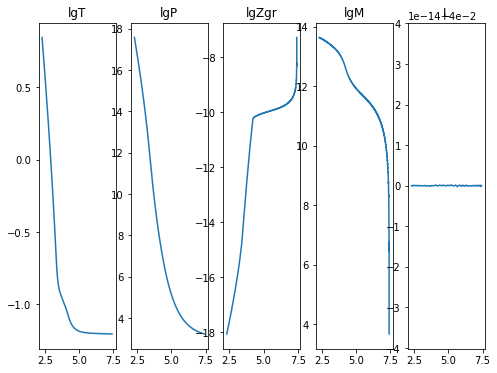

2020-12-06 05:13:32,047 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:13:32,873 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043973
2020-12-06 05:13:32,874 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516528
2020-12-06 05:13:32,875 __main__ 0/1 INFO :: lgP iterate: 17.596817720253316
2020-12-06 05:13:32,876 __main__ 0/1 INFO :: lgM iterate: 13.641115571532973
2020-12-06 05:13:32,876 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078643
2020-12-06 05:13:32,877 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-12-06 05:13:32,878 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


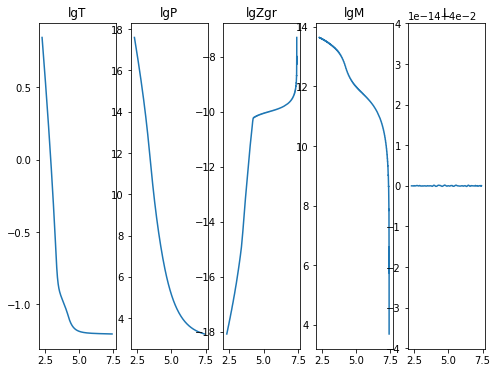

2020-12-06 05:13:36,776 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:13:37,862 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038964
2020-12-06 05:13:37,863 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800369
2020-12-06 05:13:37,864 __main__ 0/1 INFO :: lgP iterate: 17.581556452902685
2020-12-06 05:13:37,865 __main__ 0/1 INFO :: lgM iterate: 13.641074669075069
2020-12-06 05:13:37,865 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950082
2020-12-06 05:13:37,866 __main__ 0/1 INFO :: m iterate: 5.5042563003482314e-05
2020-12-06 05:13:37,867 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


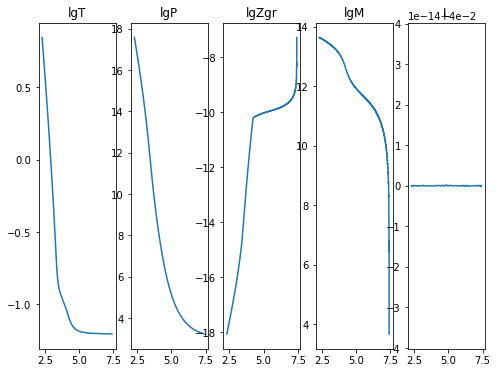

2020-12-06 05:13:41,693 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:13:42,608 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038886
2020-12-06 05:13:42,609 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516531
2020-12-06 05:13:42,610 __main__ 0/1 INFO :: lgP iterate: 17.59681772025331
2020-12-06 05:13:42,610 __main__ 0/1 INFO :: lgM iterate: 13.641115571532975
2020-12-06 05:13:42,611 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078646
2020-12-06 05:13:42,612 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-12-06 05:13:42,613 __main__ 0/1 INFO :: L iterate: 0.03999999999999996


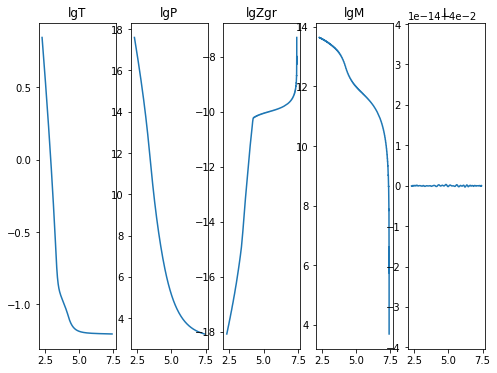

2020-12-06 05:13:46,439 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:13:47,451 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204101
2020-12-06 05:13:47,452 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800362
2020-12-06 05:13:47,453 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 05:13:47,454 __main__ 0/1 INFO :: lgM iterate: 13.641074669075117
2020-12-06 05:13:47,455 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-12-06 05:13:47,456 __main__ 0/1 INFO :: m iterate: 5.50425630123641e-05
2020-12-06 05:13:47,457 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


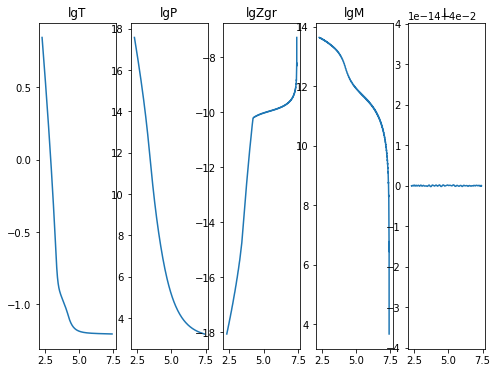

2020-12-06 05:13:51,269 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:13:52,119 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040634
2020-12-06 05:13:52,120 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516523
2020-12-06 05:13:52,121 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-12-06 05:13:52,122 __main__ 0/1 INFO :: lgM iterate: 13.641115571532964
2020-12-06 05:13:52,123 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078635
2020-12-06 05:13:52,124 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-12-06 05:13:52,125 __main__ 0/1 INFO :: L iterate: 0.039999999999999966


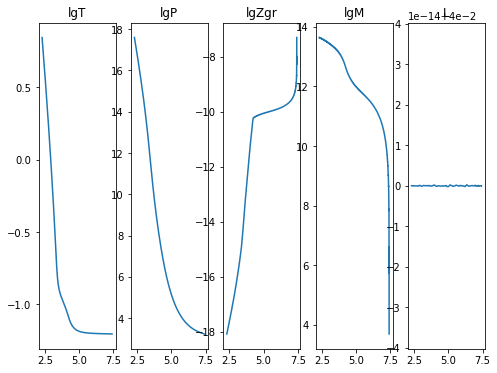

2020-12-06 05:13:56,002 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:13:56,978 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203694
2020-12-06 05:13:56,979 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800377
2020-12-06 05:13:56,980 __main__ 0/1 INFO :: lgP iterate: 17.581556452902703
2020-12-06 05:13:56,980 __main__ 0/1 INFO :: lgM iterate: 13.641074669075138
2020-12-06 05:13:56,981 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950146
2020-12-06 05:13:56,982 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-12-06 05:13:56,983 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


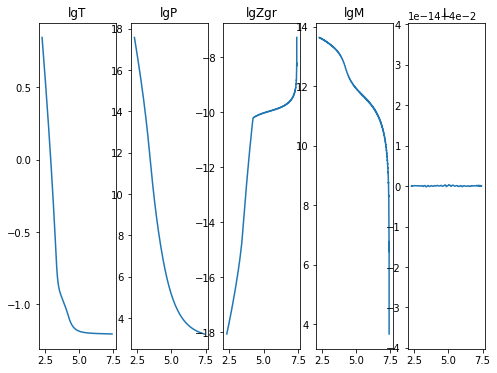

2020-12-06 05:14:00,787 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:14:01,619 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032036408
2020-12-06 05:14:01,620 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516529
2020-12-06 05:14:01,621 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-12-06 05:14:01,646 __main__ 0/1 INFO :: lgM iterate: 13.641115571532959
2020-12-06 05:14:01,647 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507864
2020-12-06 05:14:01,648 __main__ 0/1 INFO :: m iterate: 5.5876451733105625e-05
2020-12-06 05:14:01,649 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


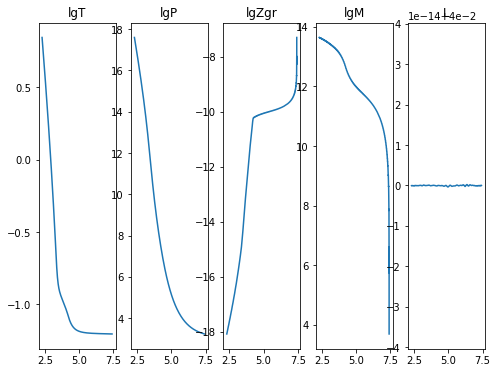

2020-12-06 05:14:05,482 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:14:06,448 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038218
2020-12-06 05:14:06,449 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800345
2020-12-06 05:14:06,450 __main__ 0/1 INFO :: lgP iterate: 17.581556452902696
2020-12-06 05:14:06,451 __main__ 0/1 INFO :: lgM iterate: 13.641074669075135
2020-12-06 05:14:06,452 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695014
2020-12-06 05:14:06,453 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-12-06 05:14:06,453 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


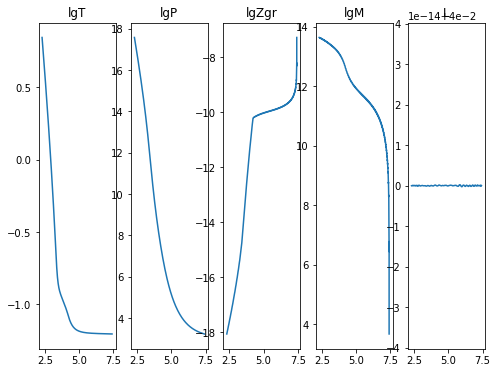

2020-12-06 05:14:10,273 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:14:11,113 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037572
2020-12-06 05:14:11,114 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516517
2020-12-06 05:14:11,115 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-12-06 05:14:11,116 __main__ 0/1 INFO :: lgM iterate: 13.64111557153298
2020-12-06 05:14:11,117 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078632
2020-12-06 05:14:11,117 __main__ 0/1 INFO :: m iterate: 5.587645173577016e-05
2020-12-06 05:14:11,118 __main__ 0/1 INFO :: L iterate: 0.04


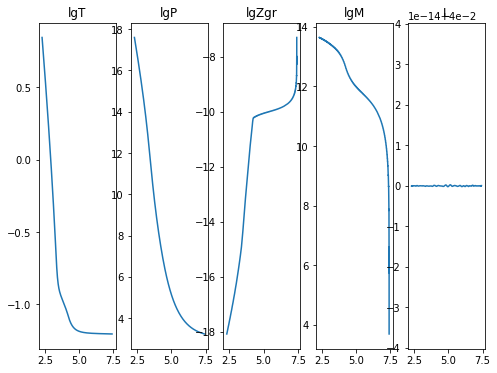

2020-12-06 05:14:15,004 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:14:15,997 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038311
2020-12-06 05:14:15,998 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800372
2020-12-06 05:14:15,999 __main__ 0/1 INFO :: lgP iterate: 17.581556452902685
2020-12-06 05:14:16,000 __main__ 0/1 INFO :: lgM iterate: 13.641074669075095
2020-12-06 05:14:16,001 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-12-06 05:14:16,002 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-12-06 05:14:16,002 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


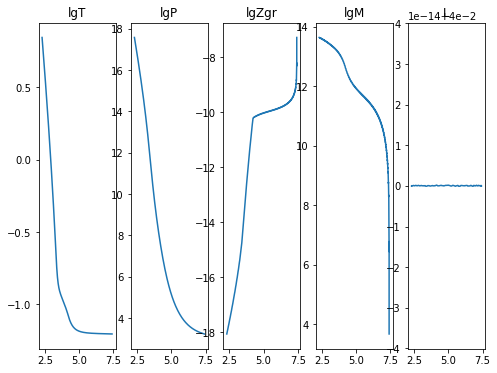

2020-12-06 05:14:19,846 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:14:20,694 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203676
2020-12-06 05:14:20,695 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516538
2020-12-06 05:14:20,696 __main__ 0/1 INFO :: lgP iterate: 17.596817720253288
2020-12-06 05:14:20,697 __main__ 0/1 INFO :: lgM iterate: 13.64111557153292
2020-12-06 05:14:20,698 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078593
2020-12-06 05:14:20,699 __main__ 0/1 INFO :: m iterate: 5.58764517260002e-05
2020-12-06 05:14:20,699 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


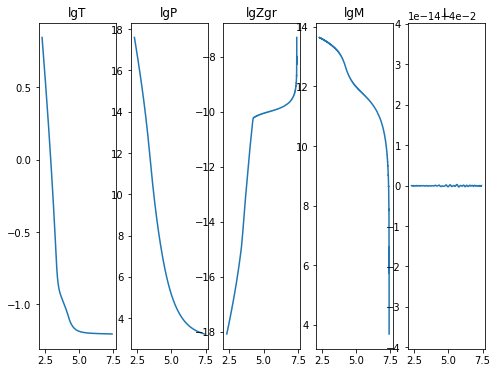

2020-12-06 05:14:24,503 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:14:25,524 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035822
2020-12-06 05:14:25,525 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800362
2020-12-06 05:14:25,525 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-12-06 05:14:25,526 __main__ 0/1 INFO :: lgM iterate: 13.6410746690751
2020-12-06 05:14:25,527 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-12-06 05:14:25,528 __main__ 0/1 INFO :: m iterate: 5.504256300437049e-05
2020-12-06 05:14:25,529 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


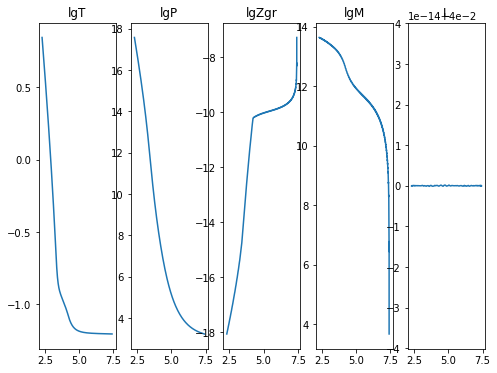

2020-12-06 05:14:29,353 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:14:30,157 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032032305
2020-12-06 05:14:30,158 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516497
2020-12-06 05:14:30,159 __main__ 0/1 INFO :: lgP iterate: 17.59681772025327
2020-12-06 05:14:30,160 __main__ 0/1 INFO :: lgM iterate: 13.641115571532922
2020-12-06 05:14:30,160 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078575
2020-12-06 05:14:30,161 __main__ 0/1 INFO :: m iterate: 5.587645173577016e-05
2020-12-06 05:14:30,162 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


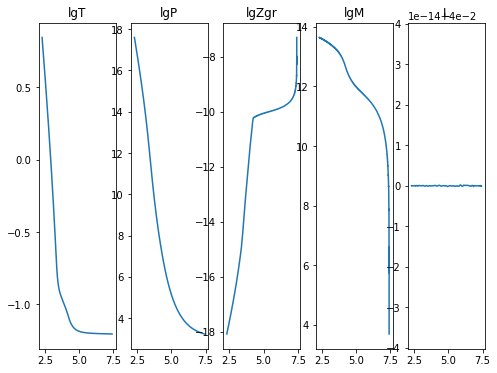

2020-12-06 05:14:34,654 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:14:36,016 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032030762
2020-12-06 05:14:36,018 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800378
2020-12-06 05:14:36,018 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-12-06 05:14:36,019 __main__ 0/1 INFO :: lgM iterate: 13.641074669075138
2020-12-06 05:14:36,021 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950125
2020-12-06 05:14:36,022 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 05:14:36,023 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


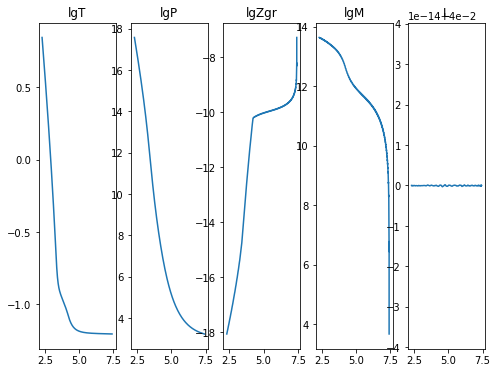

2020-12-06 05:14:40,734 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:14:41,754 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037399
2020-12-06 05:14:41,755 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516522
2020-12-06 05:14:41,756 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-12-06 05:14:41,757 __main__ 0/1 INFO :: lgM iterate: 13.641115571532957
2020-12-06 05:14:41,758 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078635
2020-12-06 05:14:41,759 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-12-06 05:14:41,760 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


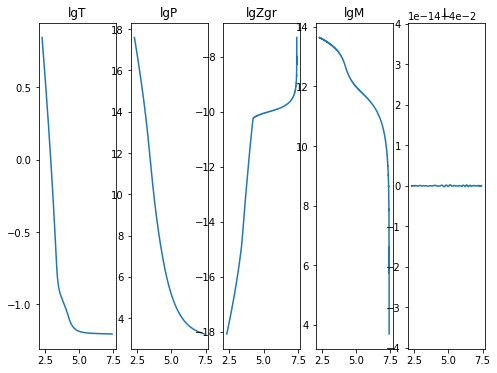

2020-12-06 05:14:45,623 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:14:46,633 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040083
2020-12-06 05:14:46,634 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800356
2020-12-06 05:14:46,634 __main__ 0/1 INFO :: lgP iterate: 17.581556452902685
2020-12-06 05:14:46,635 __main__ 0/1 INFO :: lgM iterate: 13.641074669075126
2020-12-06 05:14:46,636 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695012
2020-12-06 05:14:46,637 __main__ 0/1 INFO :: m iterate: 5.504256300081778e-05
2020-12-06 05:14:46,638 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


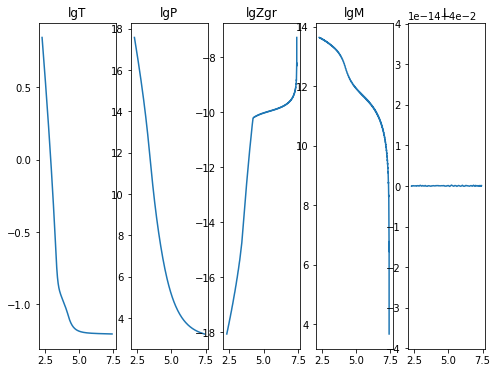

2020-12-06 05:14:50,748 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:14:51,633 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035425
2020-12-06 05:14:51,634 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516522
2020-12-06 05:14:51,635 __main__ 0/1 INFO :: lgP iterate: 17.596817720253295
2020-12-06 05:14:51,636 __main__ 0/1 INFO :: lgM iterate: 13.641115571532904
2020-12-06 05:14:51,637 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078575
2020-12-06 05:14:51,640 __main__ 0/1 INFO :: m iterate: 5.587645173488198e-05
2020-12-06 05:14:51,641 __main__ 0/1 INFO :: L iterate: 0.04


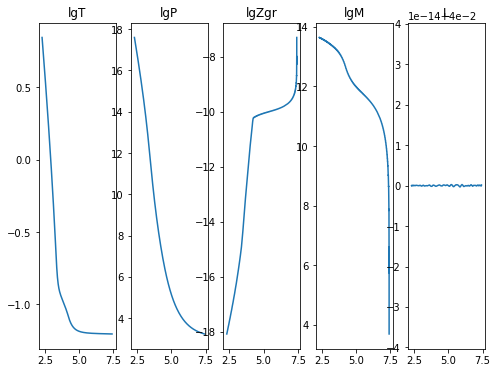

2020-12-06 05:14:55,545 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:14:56,669 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032033644
2020-12-06 05:14:56,670 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800358
2020-12-06 05:14:56,671 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-12-06 05:14:56,672 __main__ 0/1 INFO :: lgM iterate: 13.641074669075099
2020-12-06 05:14:56,673 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950075
2020-12-06 05:14:56,675 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-12-06 05:14:56,676 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


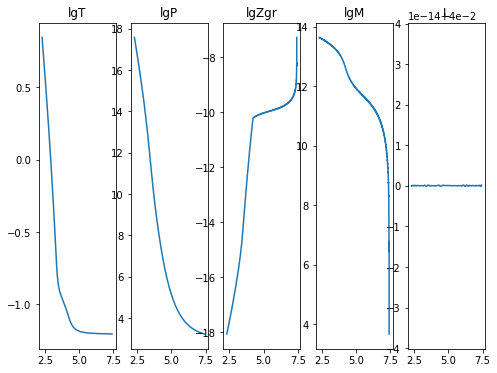

2020-12-06 05:15:00,553 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:15:01,492 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035866
2020-12-06 05:15:01,493 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516534
2020-12-06 05:15:01,494 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-12-06 05:15:01,494 __main__ 0/1 INFO :: lgM iterate: 13.641115571532898
2020-12-06 05:15:01,495 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078575
2020-12-06 05:15:01,496 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-12-06 05:15:01,496 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


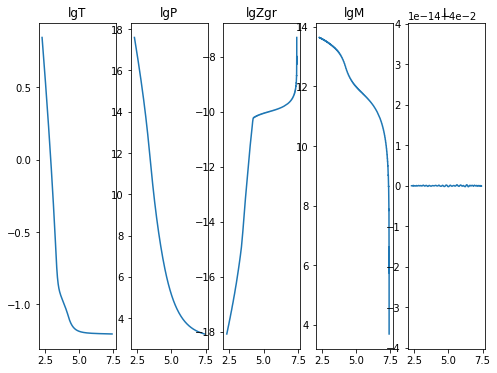

2020-12-06 05:15:05,494 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-12-06 05:15:06,555 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039672
2020-12-06 05:15:06,556 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800348
2020-12-06 05:15:06,557 __main__ 0/1 INFO :: lgP iterate: 17.581556452902642
2020-12-06 05:15:06,558 __main__ 0/1 INFO :: lgM iterate: 13.64107466907507
2020-12-06 05:15:06,558 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695005
2020-12-06 05:15:06,559 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-12-06 05:15:06,560 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


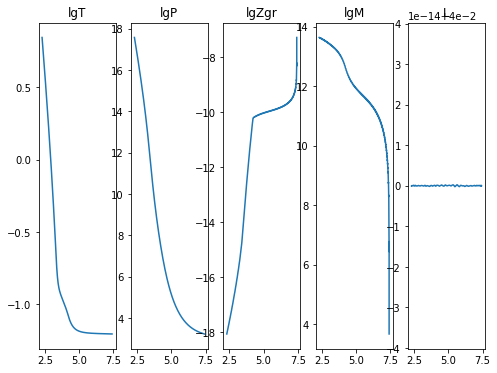

2020-12-06 05:15:10,303 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:15:11,142 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039794
2020-12-06 05:15:11,143 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516524
2020-12-06 05:15:11,144 __main__ 0/1 INFO :: lgP iterate: 17.596817720253284
2020-12-06 05:15:11,145 __main__ 0/1 INFO :: lgM iterate: 13.641115571532952
2020-12-06 05:15:11,146 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078603
2020-12-06 05:15:11,147 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-12-06 05:15:11,148 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


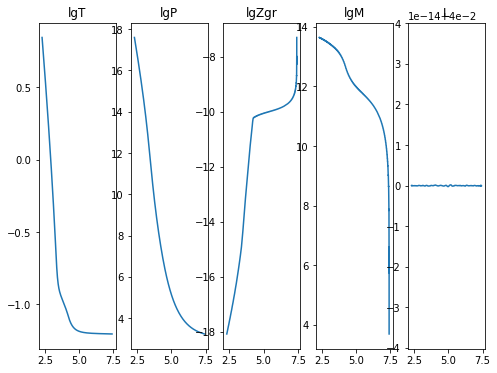

2020-12-06 05:15:14,938 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:15:15,919 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039777
2020-12-06 05:15:15,920 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800357
2020-12-06 05:15:15,921 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-12-06 05:15:15,921 __main__ 0/1 INFO :: lgM iterate: 13.641074669075124
2020-12-06 05:15:15,922 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-12-06 05:15:15,923 __main__ 0/1 INFO :: m iterate: 5.504256300525867e-05
2020-12-06 05:15:15,924 __main__ 0/1 INFO :: L iterate: 0.04


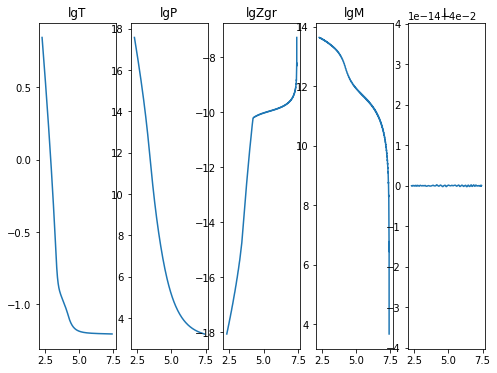

2020-12-06 05:15:20,498 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.7e+00/s
2020-12-06 05:15:21,910 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044937
2020-12-06 05:15:21,913 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516538
2020-12-06 05:15:21,916 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-12-06 05:15:21,919 __main__ 0/1 INFO :: lgM iterate: 13.641115571532936
2020-12-06 05:15:21,923 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507863
2020-12-06 05:15:21,927 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-12-06 05:15:21,930 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


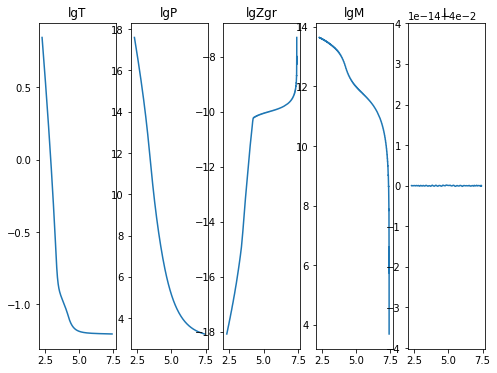

2020-12-06 05:15:27,302 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.7e+00/s
2020-12-06 05:15:28,572 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044035
2020-12-06 05:15:28,573 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800386
2020-12-06 05:15:28,574 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-12-06 05:15:28,575 __main__ 0/1 INFO :: lgM iterate: 13.641074669075106
2020-12-06 05:15:28,575 __main__ 0/1 INFO :: lgZgr iterate: -18.0699249569501
2020-12-06 05:15:28,577 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-12-06 05:15:28,577 __main__ 0/1 INFO :: L iterate: 0.04


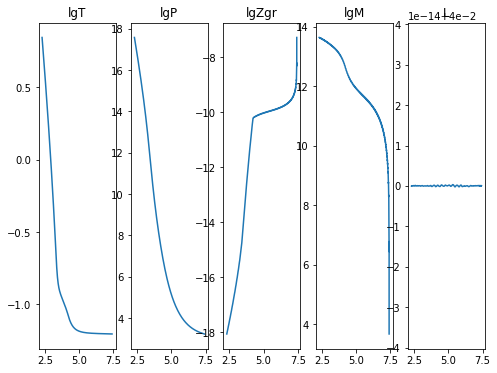

2020-12-06 05:15:33,105 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-12-06 05:15:34,001 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044353
2020-12-06 05:15:34,002 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516524
2020-12-06 05:15:34,003 __main__ 0/1 INFO :: lgP iterate: 17.596817720253323
2020-12-06 05:15:34,003 __main__ 0/1 INFO :: lgM iterate: 13.641115571532982
2020-12-06 05:15:34,004 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507866
2020-12-06 05:15:34,005 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-12-06 05:15:34,006 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


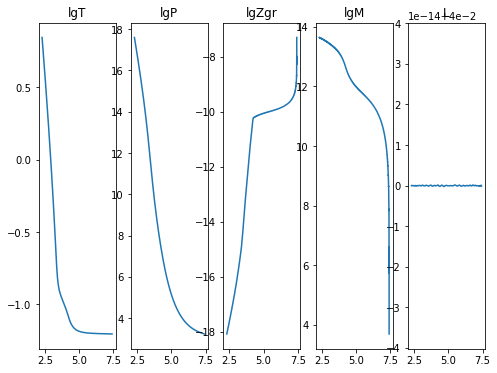

2020-12-06 05:15:38,026 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-12-06 05:15:38,987 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032047264
2020-12-06 05:15:38,988 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800371
2020-12-06 05:15:38,989 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-12-06 05:15:38,990 __main__ 0/1 INFO :: lgM iterate: 13.641074669075106
2020-12-06 05:15:38,990 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-12-06 05:15:38,991 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-12-06 05:15:38,992 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


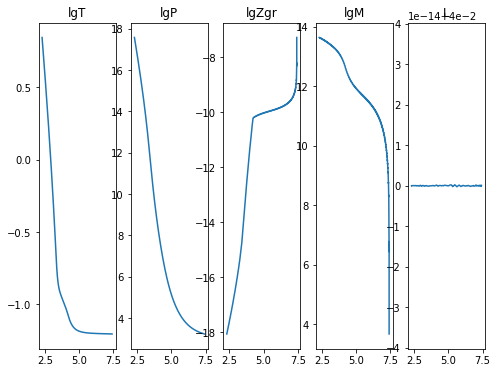

2020-12-06 05:15:42,731 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:15:43,544 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032048479
2020-12-06 05:15:43,545 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516535
2020-12-06 05:15:43,546 __main__ 0/1 INFO :: lgP iterate: 17.596817720253288
2020-12-06 05:15:43,547 __main__ 0/1 INFO :: lgM iterate: 13.641115571532925
2020-12-06 05:15:43,547 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078575
2020-12-06 05:15:43,548 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-12-06 05:15:43,549 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


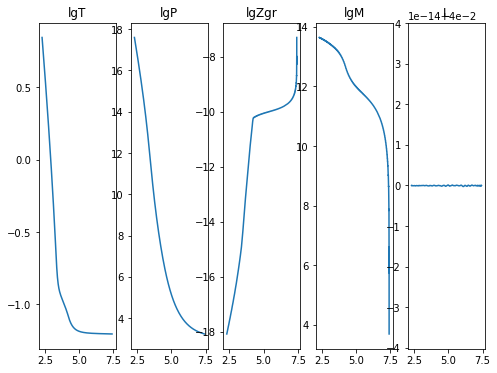

2020-12-06 05:15:47,258 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:15:48,212 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032053088
2020-12-06 05:15:48,213 __main__ 0/1 INFO :: lgT iterate: 0.844929764780035
2020-12-06 05:15:48,214 __main__ 0/1 INFO :: lgP iterate: 17.58155645290265
2020-12-06 05:15:48,215 __main__ 0/1 INFO :: lgM iterate: 13.641074669075053
2020-12-06 05:15:48,215 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695004
2020-12-06 05:15:48,216 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-12-06 05:15:48,217 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


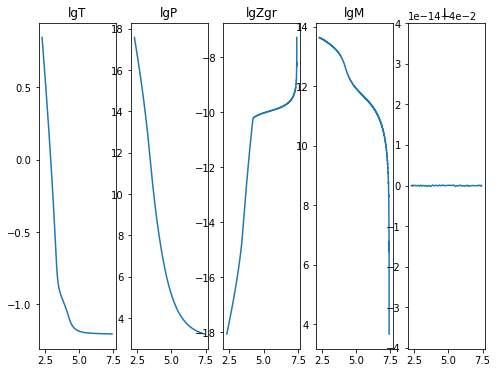

2020-12-06 05:15:51,920 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:15:52,747 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032047468
2020-12-06 05:15:52,749 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516529
2020-12-06 05:15:52,749 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-12-06 05:15:52,750 __main__ 0/1 INFO :: lgM iterate: 13.641115571533007
2020-12-06 05:15:52,751 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507866
2020-12-06 05:15:52,752 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-12-06 05:15:52,753 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


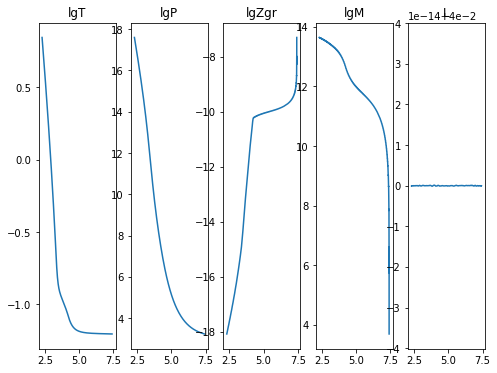

2020-12-06 05:15:56,571 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:15:57,547 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041127
2020-12-06 05:15:57,548 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800369
2020-12-06 05:15:57,549 __main__ 0/1 INFO :: lgP iterate: 17.58155645290265
2020-12-06 05:15:57,550 __main__ 0/1 INFO :: lgM iterate: 13.641074669075088
2020-12-06 05:15:57,551 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695006
2020-12-06 05:15:57,552 __main__ 0/1 INFO :: m iterate: 5.5042563002594136e-05
2020-12-06 05:15:57,553 __main__ 0/1 INFO :: L iterate: 0.04


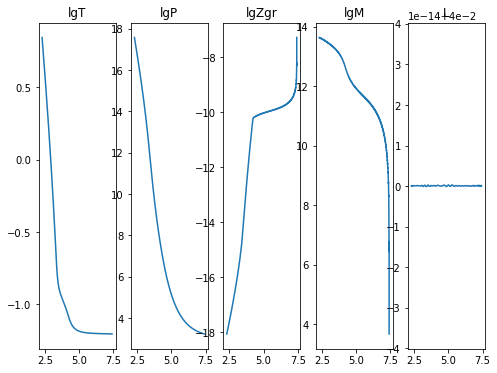

2020-12-06 05:16:01,294 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:16:02,149 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035673
2020-12-06 05:16:02,150 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516517
2020-12-06 05:16:02,151 __main__ 0/1 INFO :: lgP iterate: 17.59681772025328
2020-12-06 05:16:02,152 __main__ 0/1 INFO :: lgM iterate: 13.641115571532975
2020-12-06 05:16:02,152 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-12-06 05:16:02,153 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-12-06 05:16:02,154 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


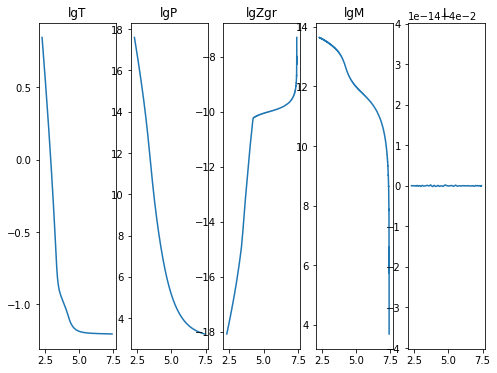

2020-12-06 05:16:05,875 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:16:06,907 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203011
2020-12-06 05:16:06,909 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800358
2020-12-06 05:16:06,909 __main__ 0/1 INFO :: lgP iterate: 17.58155645290269
2020-12-06 05:16:06,910 __main__ 0/1 INFO :: lgM iterate: 13.641074669075142
2020-12-06 05:16:06,911 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950132
2020-12-06 05:16:06,912 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 05:16:06,913 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


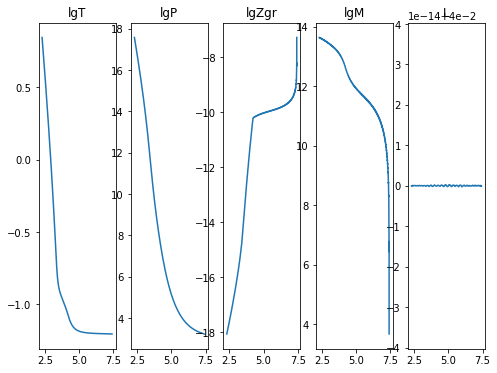

2020-12-06 05:16:10,660 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:16:11,511 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203739
2020-12-06 05:16:11,512 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516528
2020-12-06 05:16:11,513 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 05:16:11,514 __main__ 0/1 INFO :: lgM iterate: 13.641115571532923
2020-12-06 05:16:11,515 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078596
2020-12-06 05:16:11,516 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-12-06 05:16:11,517 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


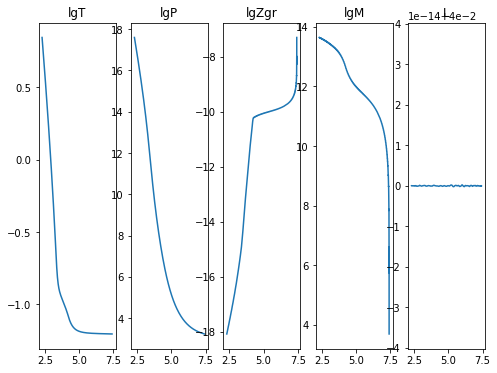

2020-12-06 05:16:15,333 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:16:16,233 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204435
2020-12-06 05:16:16,234 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800365
2020-12-06 05:16:16,235 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 05:16:16,236 __main__ 0/1 INFO :: lgM iterate: 13.641074669075099
2020-12-06 05:16:16,237 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-12-06 05:16:16,238 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 05:16:16,238 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


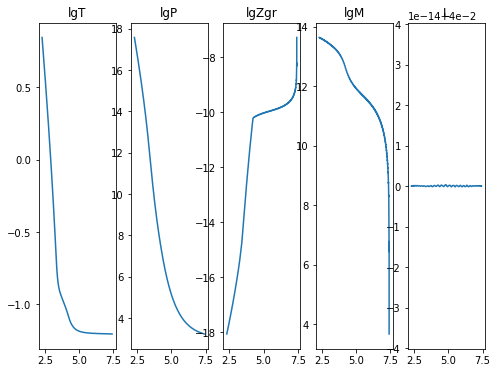

2020-12-06 05:16:20,018 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:16:20,859 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032047075
2020-12-06 05:16:20,860 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516521
2020-12-06 05:16:20,861 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 05:16:20,862 __main__ 0/1 INFO :: lgM iterate: 13.641115571532945
2020-12-06 05:16:20,863 __main__ 0/1 INFO :: lgZgr iterate: -18.0842848950786
2020-12-06 05:16:20,864 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-12-06 05:16:20,864 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


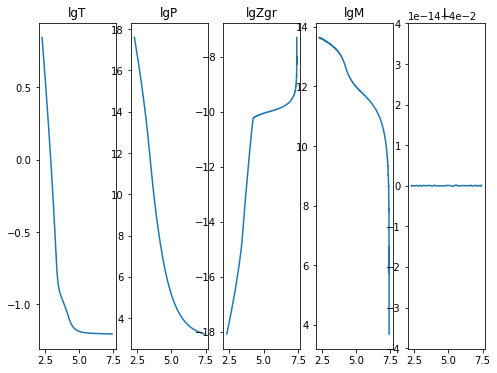

2020-12-06 05:16:24,588 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-12-06 05:16:25,517 __main__ 0/1 INFO :: Perturbation norm: 1.74046460320512
2020-12-06 05:16:25,518 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800333
2020-12-06 05:16:25,519 __main__ 0/1 INFO :: lgP iterate: 17.581556452902657
2020-12-06 05:16:25,520 __main__ 0/1 INFO :: lgM iterate: 13.64107466907512
2020-12-06 05:16:25,521 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-12-06 05:16:25,522 __main__ 0/1 INFO :: m iterate: 5.5042563002594136e-05
2020-12-06 05:16:25,523 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


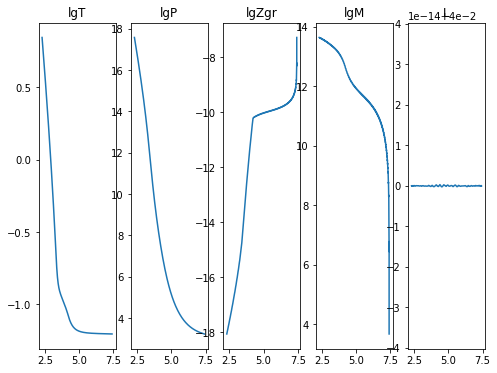

2020-12-06 05:16:29,257 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:16:30,076 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204538
2020-12-06 05:16:30,078 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516541
2020-12-06 05:16:30,078 __main__ 0/1 INFO :: lgP iterate: 17.596817720253295
2020-12-06 05:16:30,079 __main__ 0/1 INFO :: lgM iterate: 13.64111557153295
2020-12-06 05:16:30,080 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-12-06 05:16:30,081 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 05:16:30,082 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


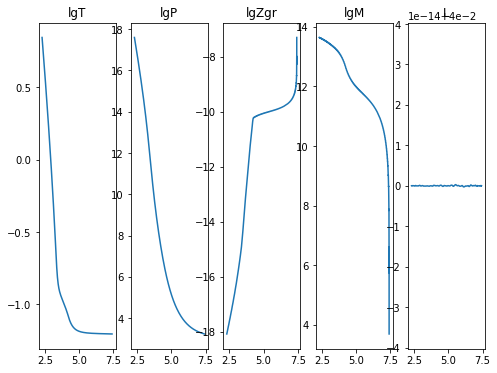

2020-12-06 05:16:35,205 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.9e+00/s
2020-12-06 05:16:36,705 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041309
2020-12-06 05:16:36,706 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800369
2020-12-06 05:16:36,707 __main__ 0/1 INFO :: lgP iterate: 17.581556452902653
2020-12-06 05:16:36,708 __main__ 0/1 INFO :: lgM iterate: 13.641074669075113
2020-12-06 05:16:36,709 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695008
2020-12-06 05:16:36,710 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-12-06 05:16:36,711 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


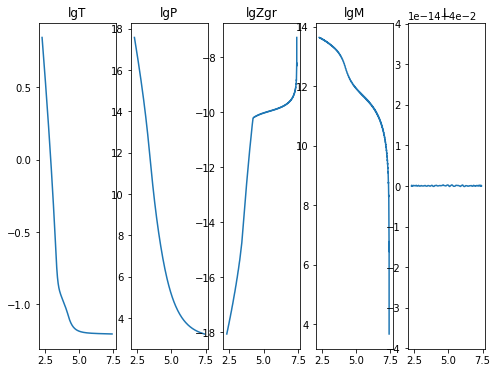

2020-12-06 05:16:41,531 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:16:42,356 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042872
2020-12-06 05:16:42,358 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516523
2020-12-06 05:16:42,359 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-12-06 05:16:42,360 __main__ 0/1 INFO :: lgM iterate: 13.641115571532943
2020-12-06 05:16:42,362 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078614
2020-12-06 05:16:42,363 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 05:16:42,364 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


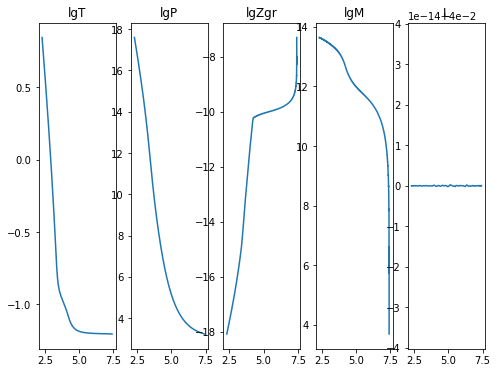

2020-12-06 05:16:46,388 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:16:47,406 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042277
2020-12-06 05:16:47,407 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800365
2020-12-06 05:16:47,408 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-12-06 05:16:47,409 __main__ 0/1 INFO :: lgM iterate: 13.641074669075172
2020-12-06 05:16:47,409 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695013
2020-12-06 05:16:47,410 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-12-06 05:16:47,411 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


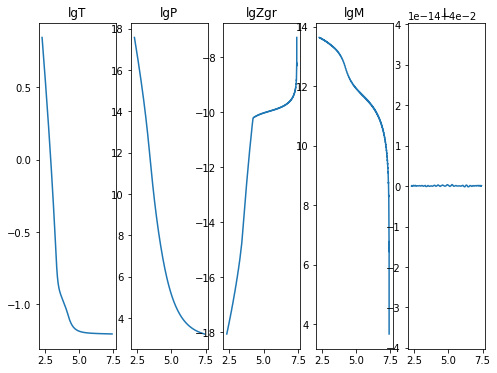

2020-12-06 05:16:51,848 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-12-06 05:16:52,805 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203608
2020-12-06 05:16:52,806 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516527
2020-12-06 05:16:52,807 __main__ 0/1 INFO :: lgP iterate: 17.596817720253284
2020-12-06 05:16:52,807 __main__ 0/1 INFO :: lgM iterate: 13.641115571532943
2020-12-06 05:16:52,808 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078596
2020-12-06 05:16:52,809 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-12-06 05:16:52,810 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


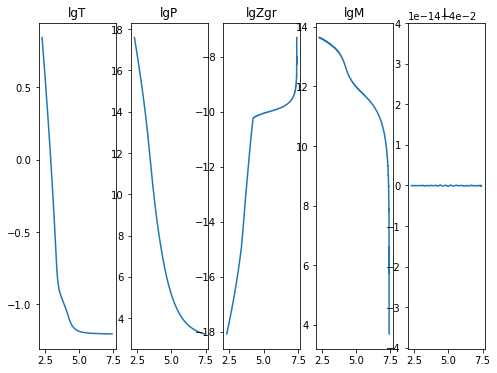

2020-12-06 05:16:57,158 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-12-06 05:16:58,191 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032026792
2020-12-06 05:16:58,192 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800369
2020-12-06 05:16:58,192 __main__ 0/1 INFO :: lgP iterate: 17.581556452902692
2020-12-06 05:16:58,193 __main__ 0/1 INFO :: lgM iterate: 13.641074669075099
2020-12-06 05:16:58,194 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-12-06 05:16:58,195 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-12-06 05:16:58,195 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


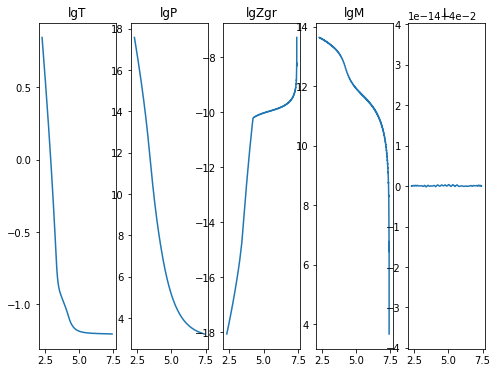

2020-12-06 05:17:02,704 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.1e+00/s
2020-12-06 05:17:03,950 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032032494
2020-12-06 05:17:03,956 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516532
2020-12-06 05:17:03,960 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-12-06 05:17:03,964 __main__ 0/1 INFO :: lgM iterate: 13.641115571532954
2020-12-06 05:17:03,968 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-12-06 05:17:03,973 __main__ 0/1 INFO :: m iterate: 5.58764517260002e-05
2020-12-06 05:17:03,976 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


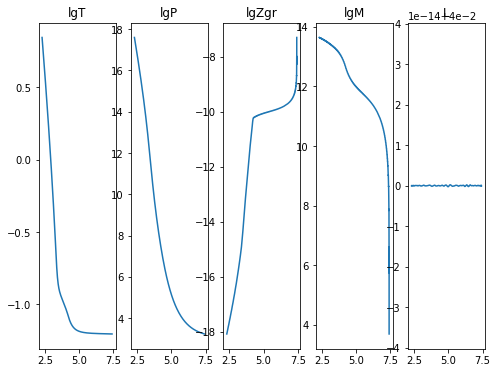

2020-12-06 05:17:08,640 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:17:09,621 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038815
2020-12-06 05:17:09,622 __main__ 0/1 INFO :: lgT iterate: 0.844929764780036
2020-12-06 05:17:09,624 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-12-06 05:17:09,624 __main__ 0/1 INFO :: lgM iterate: 13.641074669075156
2020-12-06 05:17:09,625 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695013
2020-12-06 05:17:09,626 __main__ 0/1 INFO :: m iterate: 5.504256300525867e-05
2020-12-06 05:17:09,627 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


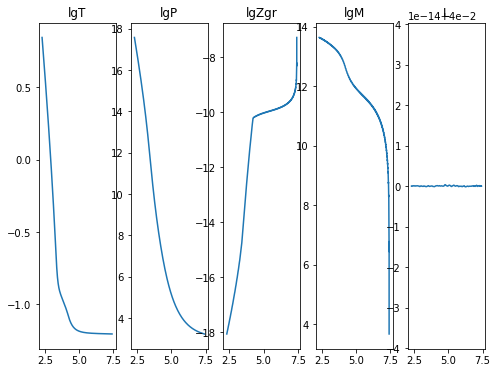

2020-12-06 05:17:13,721 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.1e+00/s
2020-12-06 05:17:14,702 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042208
2020-12-06 05:17:14,703 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516525
2020-12-06 05:17:14,704 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-12-06 05:17:14,705 __main__ 0/1 INFO :: lgM iterate: 13.641115571532929
2020-12-06 05:17:14,706 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-12-06 05:17:14,707 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-12-06 05:17:14,708 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


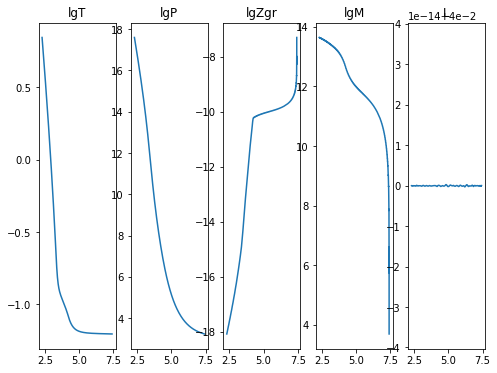

2020-12-06 05:17:19,057 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:17:20,080 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046305
2020-12-06 05:17:20,081 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800355
2020-12-06 05:17:20,082 __main__ 0/1 INFO :: lgP iterate: 17.581556452902664
2020-12-06 05:17:20,083 __main__ 0/1 INFO :: lgM iterate: 13.641074669075117
2020-12-06 05:17:20,083 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950093
2020-12-06 05:17:20,084 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-12-06 05:17:20,085 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


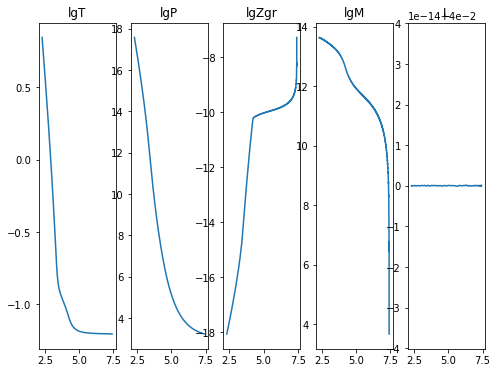

2020-12-06 05:17:23,946 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-12-06 05:17:24,860 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038946
2020-12-06 05:17:24,861 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516523
2020-12-06 05:17:24,862 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-12-06 05:17:24,863 __main__ 0/1 INFO :: lgM iterate: 13.641115571532943
2020-12-06 05:17:24,864 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078603
2020-12-06 05:17:24,865 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-12-06 05:17:24,866 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


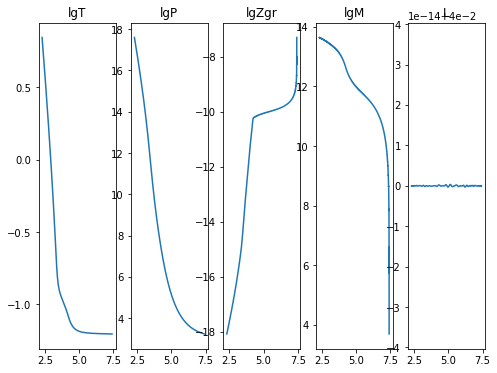

2020-12-06 05:17:28,829 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-12-06 05:17:29,801 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032031126
2020-12-06 05:17:29,802 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800362
2020-12-06 05:17:29,802 __main__ 0/1 INFO :: lgP iterate: 17.58155645290269
2020-12-06 05:17:29,803 __main__ 0/1 INFO :: lgM iterate: 13.641074669075133
2020-12-06 05:17:29,804 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950135
2020-12-06 05:17:29,805 __main__ 0/1 INFO :: m iterate: 5.504256300525867e-05
2020-12-06 05:17:29,806 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


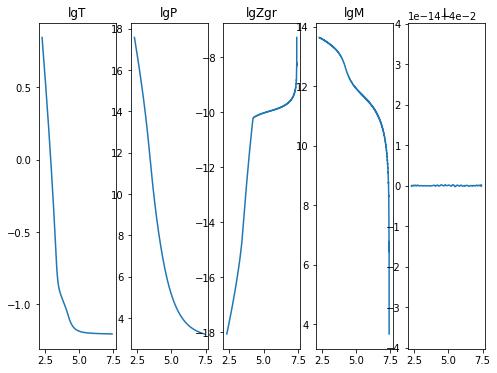

2020-12-06 05:17:34,216 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-12-06 05:17:35,220 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203176
2020-12-06 05:17:35,222 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516539
2020-12-06 05:17:35,223 __main__ 0/1 INFO :: lgP iterate: 17.59681772025331
2020-12-06 05:17:35,223 __main__ 0/1 INFO :: lgM iterate: 13.641115571532954
2020-12-06 05:17:35,224 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-12-06 05:17:35,225 __main__ 0/1 INFO :: m iterate: 5.5876451733105625e-05
2020-12-06 05:17:35,226 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


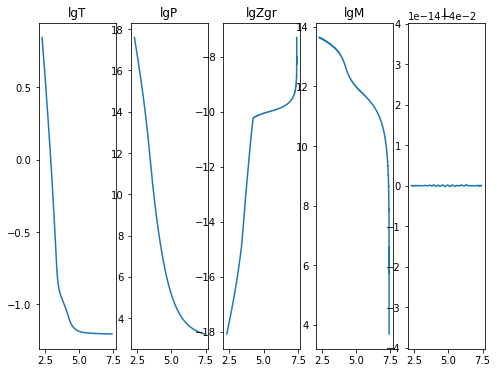

KeyboardInterrupt: 

In [19]:
# Iterations

i = 0

pert = solver.perturbations.data
pert.fill(1+tolerance)
start_time = time.time()
while np.sum(np.abs(pert)) > tolerance:
    solver.newton_iteration()
    lgT_list.append(np.copy(lgT1['g'])) # save
    lgP_list.append(np.copy(lgP1['g']))
    lgZgr_list.append(np.copy(lgZgr1['g'])) 
    lgM_list.append(np.copy(lgM1['g'])) 
    L_list.append(np.copy(L1['g']))
    m_list.append(np.copy(m['g']))
    logger.info('Perturbation norm: {}'.format(np.sum(np.abs(pert))))
    logger.info('lgT iterate: {}'.format(lgT1['g'][0]))
    logger.info('lgP iterate: {}'.format(lgP1['g'][0]))
    logger.info('lgM iterate: {}'.format(lgM1['g'][0]))
    logger.info('lgZgr iterate: {}'.format(lgZgr1['g'][0]))
    logger.info('m iterate: {}'.format(m1['g'][0]))
    logger.info('L iterate: {}'.format(L1['g'][0]))
    
    plt.figure(figsize=(8,6))
    plt.subplot(1,5,1)
    plt.plot(domain.grid(0),lgT1['g'])
    plt.title("lgT")
    plt.subplot(1,5,2)
    plt.plot(domain.grid(0), lgP1['g'])
    plt.title("lgP")
    plt.subplot(1,5,3)
    plt.plot(domain.grid(0),lgZgr1['g'])
    plt.title("lgZgr")
    plt.subplot(1,5,4)
    plt.plot(domain.grid(0), lgM1['g'])
    plt.title("lgM")
    plt.subplot(1,5,5)
    plt.plot(domain.grid(0), L1['g'])
    plt.title("L")
    plt.show()
    
end_time = time.time()

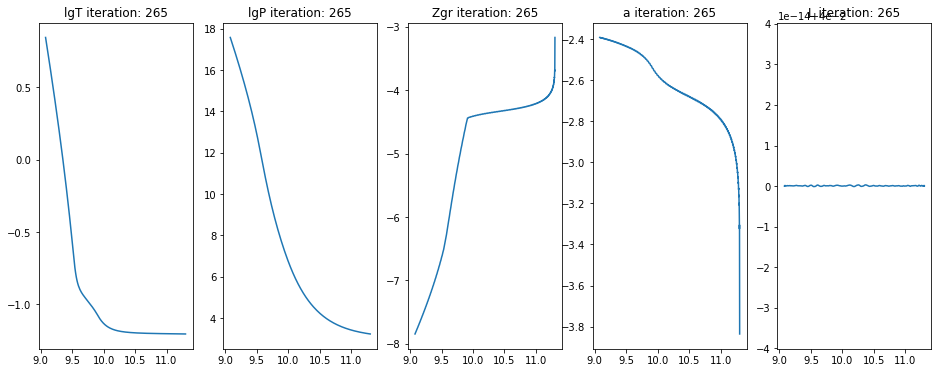

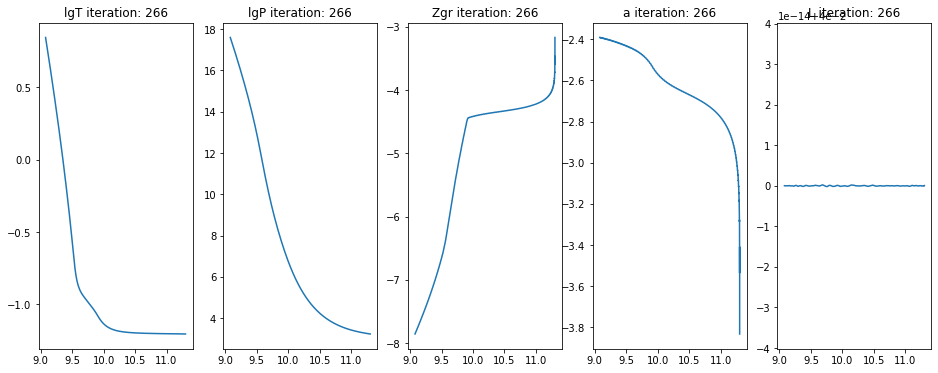

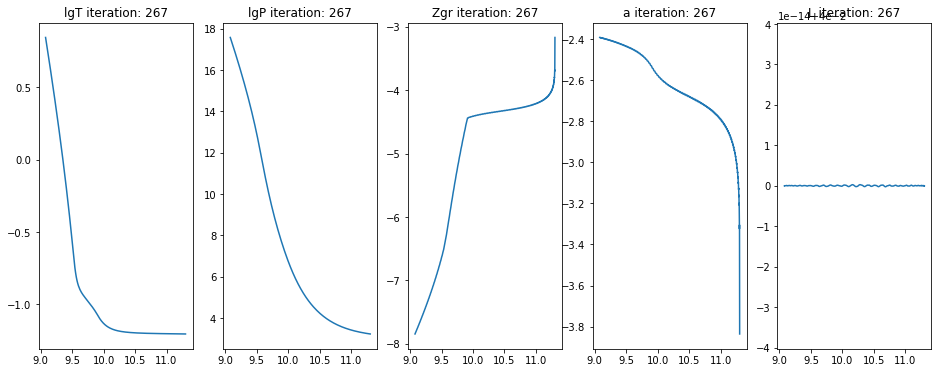

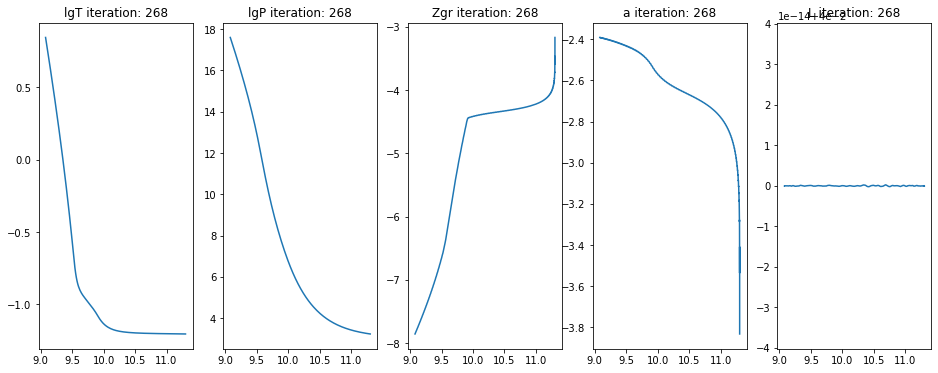

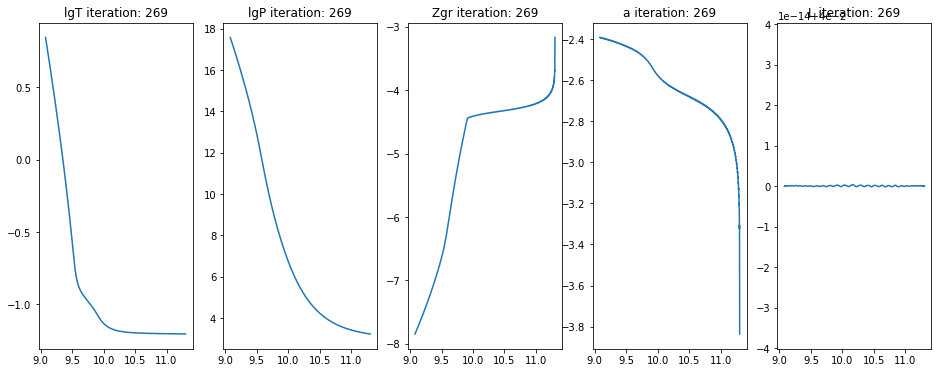

...

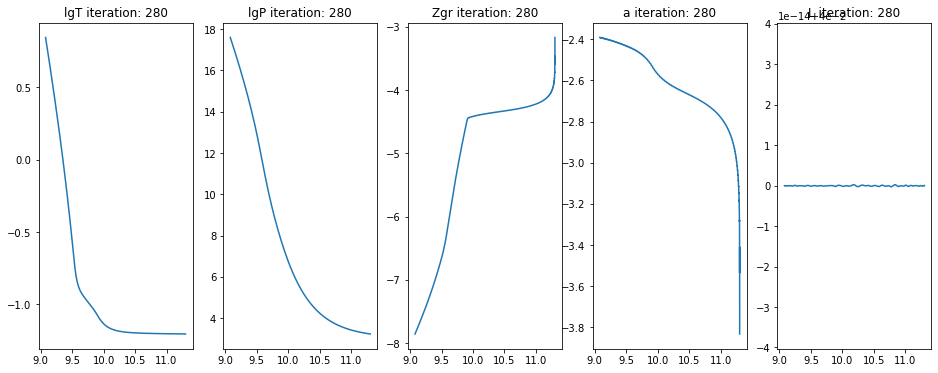

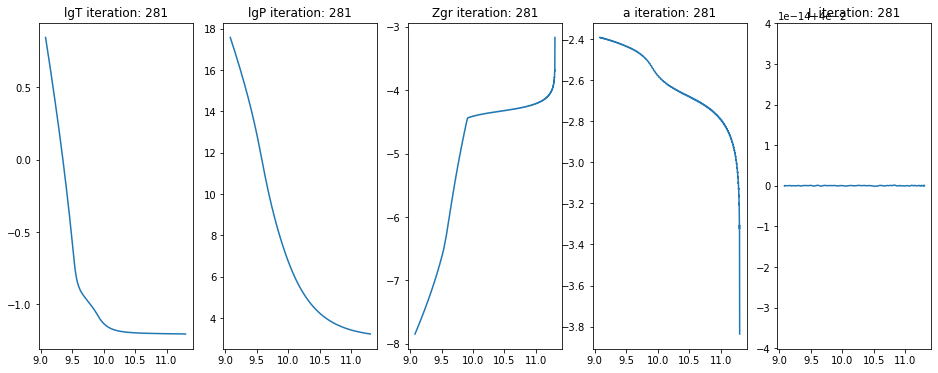

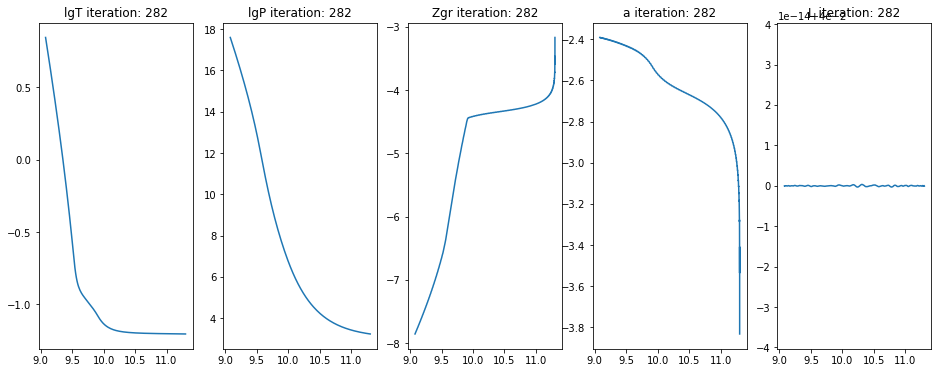

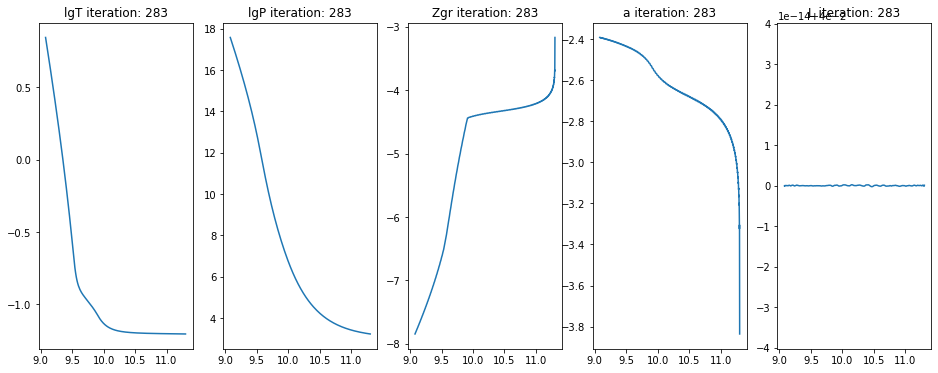

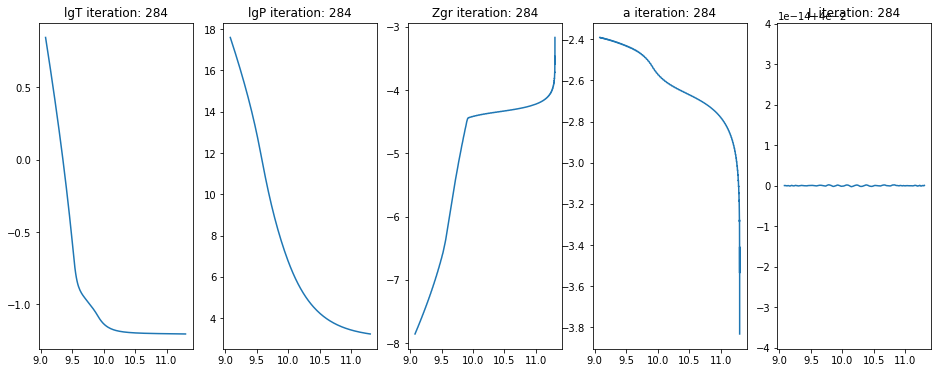

In [20]:
lower = 0 
if len(lgT_list) > 20:
    lower = len(lgT_list) - 20

R = np.log10(np.exp(domain.grid(0))*r_0)

for i in range(lower,len(lgT_list)):
        plt.figure(figsize=(16,6))
        
        plt.subplot(1,5,1)
        plt.plot(R,lgT_list[i])
        plt.title("lgT iteration: " + str(i))
        
        plt.subplot(1,5,2)
        plt.plot(R, lgP_list[i])
        plt.title("lgP iteration: " + str(i))
        
        plt.subplot(1,5,3)
        plt.plot(R, np.log10(np.exp(lgZgr_list[i])))
        plt.title("Zgr iteration: " + str(i))
        
        # Grain size 
        plt.subplot(1,5,4)
        plt.plot(R, np.log10((np.exp(lgM_list[i])*M_0/(4*np.pi))**(1/3)))
        plt.title("a iteration: " + str(i))
        
#         plt.subplot(1,5,5)
#         plt.plot(R, m_list[i])
#         plt.title("m iteration: " + str(i))

        plt.subplot(1,5,5)
        plt.plot(R, L_list[i])
        plt.title("L iteration: " + str(i))
        
        

In [21]:
lgP['g'] = lgP_list[-1]
lgT['g'] = lgT_list[-1]
lgZgr['g'] = lgZgr_list[-1]
lgM['g'] = lgM_list[-1]
m['g'] = m_list[-1]
L['g'] = L_list[-1]

Text(0.5, 1.0, 'Grad')

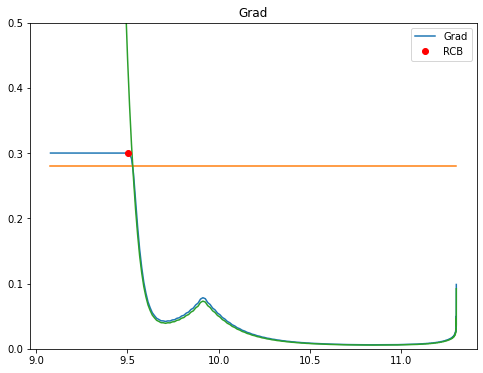

In [22]:
# Grad

Grad = grad.evaluate()
Grad.require_grid_space()
Grad_rad = grad_rad.evaluate()
Grad_rad.require_grid_space()

RCB = 0
epsilon = 0.0001
for i in range(0, len(Grad['g'] - 1)):
    if np.abs(Grad['g'][i] - Grad['g'][0]) >  epsilon:
        RCB = i
        break

plt.figure(figsize=(8,6))
plt.plot(R, Grad['g'], label='Grad')
plt.plot(R, grad_ad*np.ones(len(R)))
plt.plot(R, Grad_rad['g'])
plt.plot(R[RCB], Grad['g'][RCB], 'ro', label = 'RCB')
plt.ylim(0, 0.5)
plt.legend()

plt.title('Grad')

Text(0.5, 1.0, 'Tstop')

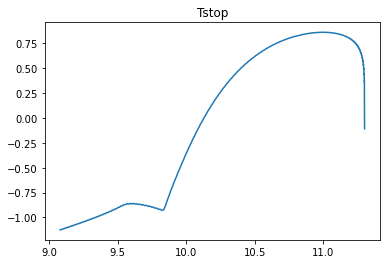

In [23]:
TStop = Tstop.evaluate()
TStop.require_grid_space()
plt.plot(R, np.log10(TStop['g']))
plt.title('Tstop')

Text(0.5, 1.0, 'Tgrow')

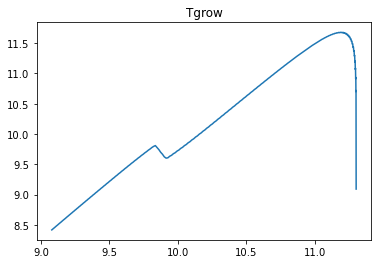

In [24]:
Tgrow = 1/Tgrow_inv
TGrow = Tgrow.evaluate()
TGrow.require_grid_space()
plt.plot(R, np.log10(TGrow['g']))
plt.title('Tgrow')

# New analysis section (Jan 30)


Trcb_set = 7.10055320858833 yr
Tbondi_set = 618.8149401145491 yr
Tout_set = 39203.28002388679 yr


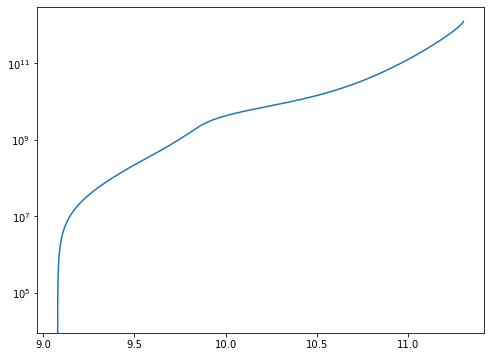

In [25]:
Bondi = r_Bondi # cm
# Bondi = 3.7e11 # cm
# Tsettl = r/vsettl 
def find_nearest_index(A, x):
    i = (np.abs(A - x)).argmin()
    return i

bondi = find_nearest_index(R, np.log10(Bondi))
Vsettl = v_set.evaluate()
Vsettl.require_grid_space()
Vset = Vsettl['g']

Tsettl = np.ones(len(R))

for i in range(0, len(R)):
    Tsettl[i] = np.trapz(1/Vset[0:i], S[0:i]) # Ormel integral definition 
    
# Tsettl = np.exp(r['g'])*r_0/Vset 
    
plt.figure(figsize=(8,6))
plt.plot(R, Tsettl)
plt.yscale('log')


Trcb_set = Tsettl[RCB]
Tbondi_set = Tsettl[bondi]
Tout_set = Tsettl[-1]

yr = 3.154e+7

print("Trcb_set = {} yr".format(Trcb_set/yr))
print("Tbondi_set = {} yr".format(Tbondi_set/yr))
print("Tout_set = {} yr".format(Tout_set/yr))



Trcb_set = 7.10055320858833 yr
Tbondi_set = 3047.6460753838037 yr
Tout_set = 39203.28002388679 yr


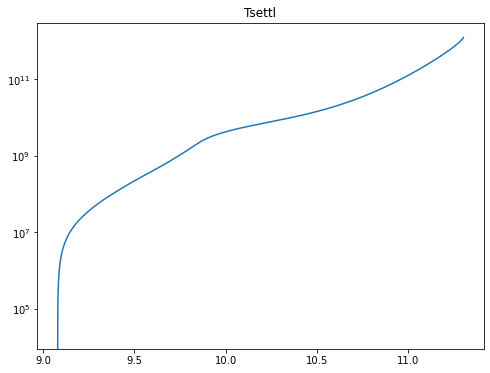

In [26]:
Bondi = 3.7e11 # cm
Bondi = 8.9442713e10
# Tsettl = r/vsettl 
def find_nearest_index(A, x):
    i = (np.abs(A - x)).argmin()
    return i

bondi = find_nearest_index(R, np.log10(Bondi))
Vsettl = v_set.evaluate()
Vsettl.require_grid_space()
Vset = Vsettl['g']


Tsettl = np.ones(len(R))


for i in range(0, len(R)):
    Tsettl[i] = np.trapz(1/Vset[0:i], S[0:i]) # Ormel integral definition 
    
# Tsettl = np.exp(r['g'])*r_0/Vset 
    
plt.figure(figsize=(8,6))
plt.plot(R, Tsettl)
plt.yscale('log')
plt.title('Tsettl')

Trcb_set = Tsettl[RCB]
Tbondi_set = Tsettl[bondi]
Tout_set = Tsettl[-1]

yr = 3.154e+7

print("Trcb_set = {} yr".format(Trcb_set/yr))
print("Tbondi_set = {} yr".format(Tbondi_set/yr))
print("Tout_set = {} yr".format(Tout_set/yr))

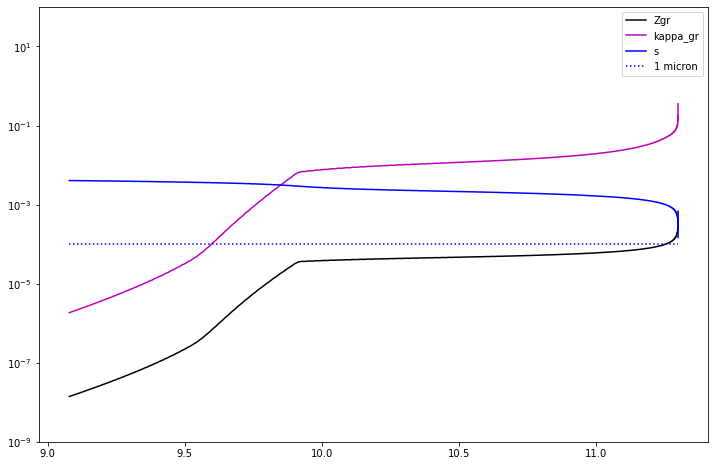

In [27]:
# Ormel profile
size = s.evaluate()
size.require_grid_space()
kappa_gr = Qk_geo.evaluate()
kappa_gr.require_grid_space()


plt.figure(figsize=(12,8))
plt.plot(R, np.exp(lgZgr['g']), 'k-', label='Zgr')
plt.plot(R, kappa_gr['g'], 'm-', label='kappa_gr')
plt.plot(R, size['g'], 'b-', label='s')
plt.plot(R, R/R*1e-4, 'b:', label='1 micron')
plt.yscale('log')
plt.ylim((1e-9, 1e2))
plt.legend()

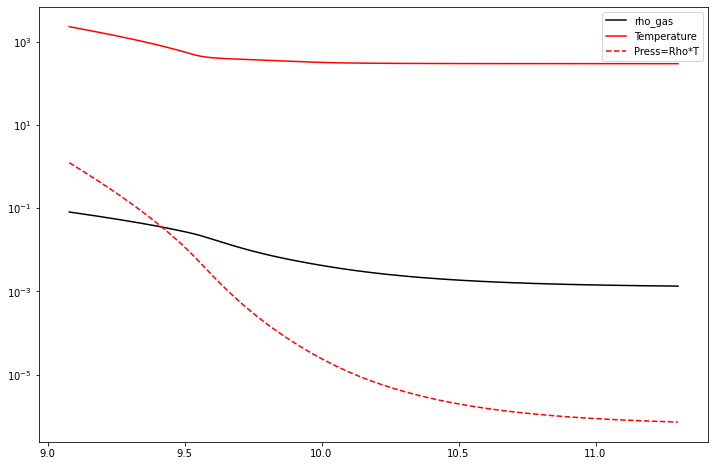

In [28]:
rho_gas = rho_g.evaluate()
rho_gas.require_grid_space()

lgt = lgT_list[-1]


plt.figure(figsize=(12,8)) # I don't know Ormel's normalization values 
plt.plot(R, (rho_gas['g'])**(1/3), 'k-', label='rho_gas')
plt.plot(R, np.exp(lgt)*T_0, 'r-', label='Temperature') 
plt.plot(R, np.exp(lgt)*T_0 *rho_gas['g'] , 'r--', label='Press=Rho*T')
plt.yscale('log')
plt.legend()

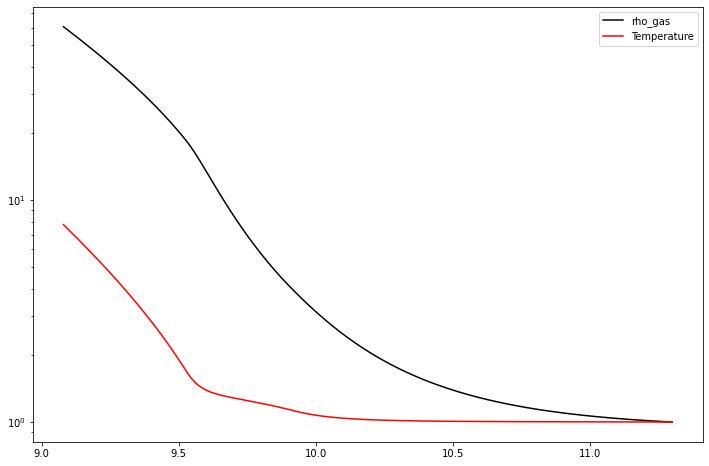

In [29]:
plt.figure(figsize=(12,8)) # I don't know Ormel's normalization values 
plt.plot(R, (rho_gas['g']/rhodisk)**(1/3) , 'k-', label='rho_gas')
plt.plot(R, np.exp(lgt)*T_0 / Tdisk, 'r-', label='Temperature') 
plt.yscale('log')
plt.legend()

Envelope mass (g): 1.033661e+26


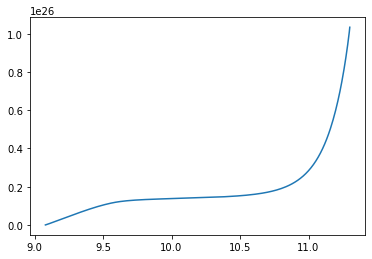

In [30]:
Env = np.zeros(len(R))

En = 4*np.pi*(np.exp(r)*r_0)**2 *rho_g 

m = En.evaluate()
m.require_grid_space()

for i in range(0, len(R)):
    Env[i] = np.trapz(m['g'][0:i], S[0:i]) 
    
    
plt.plot(R, Env)
env_mass = Env[-1]
print("Envelope mass (g): {:e}".format(env_mass))

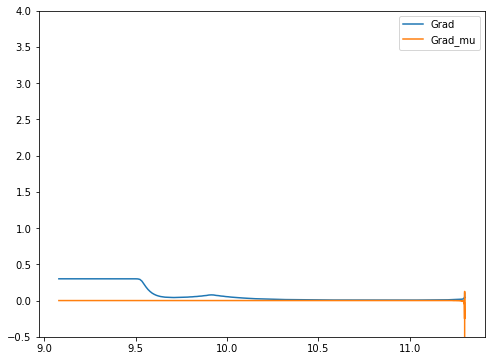

In [31]:
dlgZgr = lgZgr.differentiate('r')
dlgP = lgP.differentiate('r')

# Multiply dlgZgr by Zgr to get dZgr (as a proxy for dmu = d(1+Zgr) = dZgr)
grad_mu= dlgZgr['g']/ dlgP['g'] 
grad_mu *= np.exp(lgZgr['g'])

#grad_mu.evaluate()
#grad_mu.require_grid_space()

plt.figure(figsize=(8,6))
plt.plot(R, Grad['g'], label='Grad')
#plt.plot(R, dlgZgr['g'] / dlgP['g'], label='Grad_mu')
plt.plot(R, grad_mu, label='Grad_mu')
plt.ylim(-0.5, 4)
plt.legend()

(-4.0, 4.0)

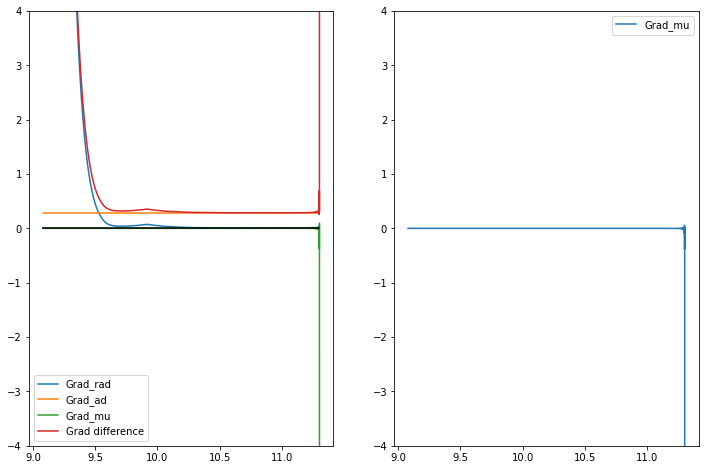

In [32]:
lgMu = np.log(1+np.exp(lgZgr))
dlgMu = log_basis.Differentiate(lgMu)
dlgP = log_basis.Differentiate(np.log(np.exp(lgP) *P_0))

grad_mu = dlgMu/dlgP

# grad_mu1 = np.diff( np.log(1+np.exp(lgZgr['g'])))/ np.diff(np.log(np.exp(lgP['g']) *P_0)) 
Grad_mu = grad_mu.evaluate()
Grad_mu.require_grid_space()

grad_diff = grad_rad - grad_mu - (-grad_ad) 
Grad_diff = grad_diff.evaluate() 
Grad_diff.require_grid_space() 


plt.figure(figsize = (12,8))
plt.subplot(1,2,1)
# plt.plot(R, Grad_diff['g'])
# plt.plot(R,Grad_mu['g'])
plt.plot(R, Grad_rad['g'], label = 'Grad_rad')
plt.plot(R, grad_ad*np.ones(len(R)), label = 'Grad_ad')
plt.plot(R, Grad_mu['g'], label = 'Grad_mu')
plt.plot(R, Grad_diff['g'], label = 'Grad difference')
plt.plot(R, np.zeros(len(R)), 'k-') 
plt.legend()
plt.ylim((-4, 4))
plt.subplot(1,2,2)
plt.plot(R, Grad_mu['g'], label = 'Grad_mu')
# plt.plot(R[1:], grad_mu1)
plt.legend()
plt.ylim((-4, 4))

<ipython-input-33-47634ba53436>:5: RuntimeWarning: invalid value encountered in log10
  plt.plot(R, np.log10(R_0), label='log10(R_0)')


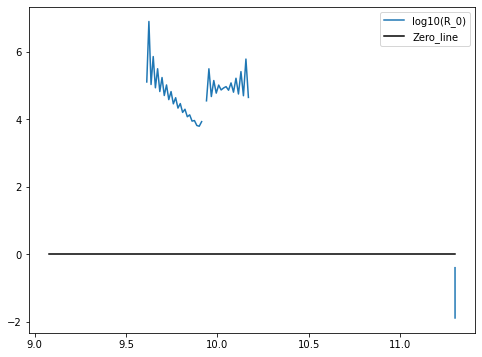

In [33]:
# Plot R_0 for fingering convection
R_0 = (Grad['g'] - grad_ad)/Grad_mu['g']

plt.figure(figsize=(8,6))
plt.plot(R, np.log10(R_0), label='log10(R_0)')
plt.plot(R, 0*R , 'k-', label='Zero_line')
#plt.ylim(-1.0, 1000.0)
plt.legend()


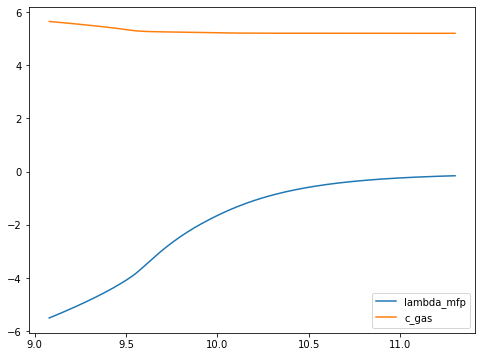

In [34]:
# Profile of nu and Xi for Prandtl number
c_gas=np.sqrt(8.32e7 * np.exp(lgt)*T_0 )
cross_sect_H2=2e-15 #cgs H2 cross section
lambda_mfp= 1./ (cross_sect_H2 * rho_gas['g'] / 2 / 1.67e-24)
nu_visc= lambda_mfp * c_gas

plt.figure(figsize=(8,6))
plt.plot(R, np.log10(lambda_mfp), label='lambda_mfp')
plt.plot(R, np.log10(c_gas), label='c_gas')

#plt.ylim(-0.1, 0.1)
plt.legend()       

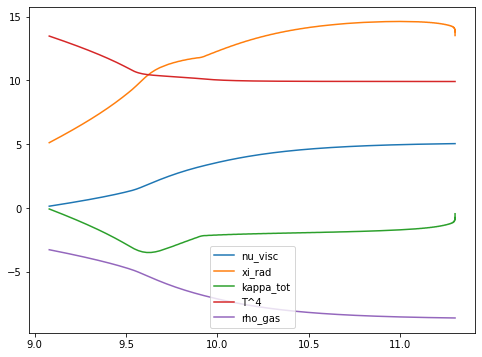

In [35]:
gas_gamma=7./5.
kappa_tot =  kappa.evaluate()
kappa_tot.require_grid_space()
#xi_rad= 16./3. * (gas_gamma-1)/gas_gamma * 5.670367e-5 * (np.exp(lgt['g'])*T_0)**4.  / rho_gas['g'] / np.exp(lgP['g']) 
xi_rad= 16./3. * (gas_gamma-1)/gas_gamma * 5.670367e-5 * (np.exp(lgt)*T_0)**4.  / rho_gas['g'] / kappa_tot['g']/ np.exp(lgP['g'])

plt.figure(figsize=(8,6))
plt.plot(R, np.log10(nu_visc), label='nu_visc')
plt.plot(R, np.log10(xi_rad), label='xi_rad')

plt.plot(R, np.log10(kappa_tot['g']), label='kappa_tot')

plt.plot(R, np.log10((np.exp(lgt)*T_0)**4.), label='T^4')
plt.plot(R, np.log10(rho_gas['g']), label='rho_gas')

#plt.ylim(-0.1, 0.1)
plt.legend()

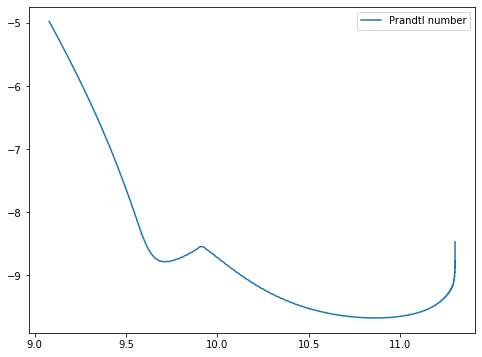

In [36]:
# Profile of Prandtl number
plt.figure(figsize=(8,6))
plt.plot(R, np.log10(nu_visc/xi_rad), label='Prandtl number')
#plt.plot(R, np.log10(xi_rad), label='xi_rad')

#plt.ylim(-0.1, 0.1)
plt.legend()

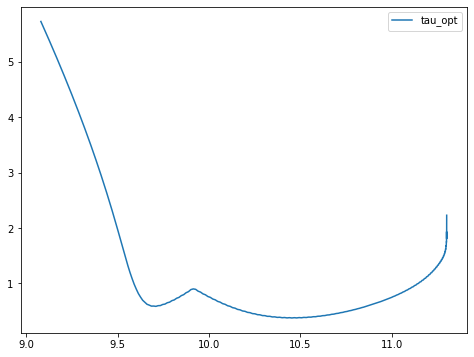

In [37]:
# Optical thickness to 'surface'
tau_opt= 10.**R * rho_gas['g'] *kappa_tot['g'] # Approximation to true integral of rho.dz

plt.figure(figsize=(8,6))
plt.plot(R, np.log10(tau_opt), label='tau_opt')
#plt.plot(R, np.log10(xi_rad), label='xi_rad')

#plt.ylim(-0.1, 0.1)
plt.legend()


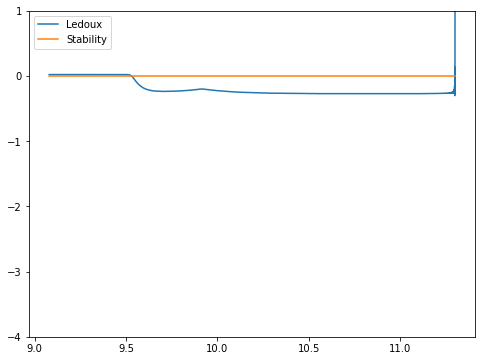

In [38]:
plt.figure(figsize=(8,6))
plt.plot(R, Grad['g'] - Grad_mu['g'] - grad_ad, label='Ledoux')
plt.plot(R, 0*R , label='Stability')
plt.ylim(-4, 1)
plt.legend()

# Oct 4 stuff

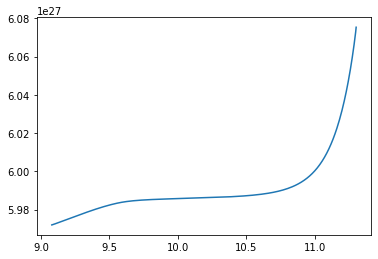

In [39]:
# This should be the mass 
plt.plot(R, Core_mass+Env)
plt.show()

In [40]:
Cs = cg.evaluate() # sound speed, which we previously used 
Cs.require_grid_space()
Cs = Cs['g']

Nth = np.sqrt((G*(Core_mass+Env)/(10**R)**2)**2/Cs**2*(grad_ad-Grad_rad['g'])) # I changed grad_rad to be positive now
d_finger= ((nu_visc*xi_rad)/Nth**2)**(1/4)
tau_cool = d_finger**2/xi_rad

Rgas = 8.32e7 / 2.3 # You gave me this value, but the wikipedia one in cgs doesnt have the /2.3 
Sigma = 5.7e-5
tau_cool_thin = Rgas/(16*kappa_tot['g']*Sigma*(np.exp(lgt)*T_0)**3)

Prandtl = nu_visc/xi_rad 

v_coll = d_finger/(np.sqrt(Prandtl)*tau_cool)

<ipython-input-40-66f5853697de>:5: RuntimeWarning: invalid value encountered in sqrt
  Nth = np.sqrt((G*(Core_mass+Env)/(10**R)**2)**2/Cs**2*(grad_ad-Grad_rad['g'])) # I changed grad_rad to be positive now


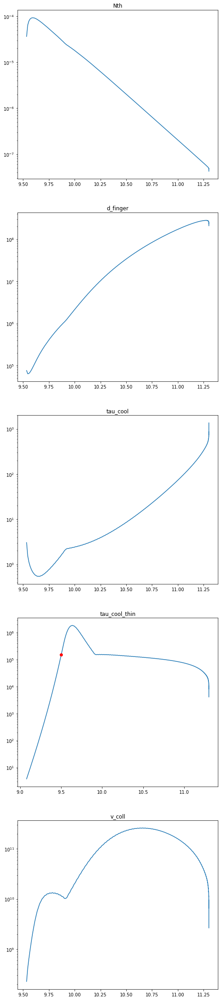

In [41]:
# red dot marks where grad transitions to grad_rad

plt.figure(figsize=(8,8*5))

plt.subplot(5,1,1)
plt.plot(R, Nth)
plt.plot(R[RCB], Nth[RCB], 'ro')
plt.yscale('log')
plt.title('Nth')

plt.subplot(5,1,2)
plt.plot(R,d_finger)
plt.plot(R[RCB], d_finger[RCB], 'ro')
plt.title('d_finger')
plt.yscale('log')

plt.subplot(5,1,3)
plt.plot(R,tau_cool)
plt.plot(R[RCB], tau_cool[RCB], 'ro')
plt.title('tau_cool')
plt.yscale('log')

plt.subplot(5,1,4)
plt.plot(R,tau_cool_thin)
plt.plot(R[RCB], tau_cool_thin[RCB], 'ro')
plt.title('tau_cool_thin')
plt.yscale('log')

plt.subplot(5,1,5)
plt.plot(R,v_coll)
plt.plot(R[RCB], v_coll[RCB], 'ro')
plt.title('v_coll')
plt.yscale('log')

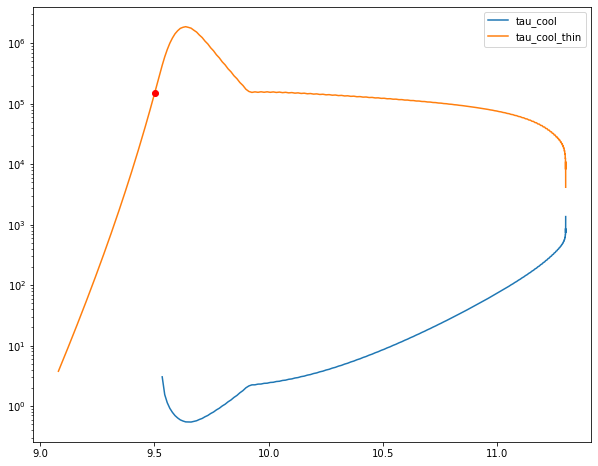

In [42]:
plt.figure(figsize=(10,8))
plt.plot(R,tau_cool, label='tau_cool')
plt.plot(R, tau_cool_thin, label='tau_cool_thin')
plt.plot(R[RCB], tau_cool[RCB], 'ro')
plt.plot(R[RCB], tau_cool_thin[RCB], 'ro')
plt.yscale('log')
plt.legend()
plt.show()

In [43]:
np.savetxt("NPressure_dep.txt", lgP_list[-1])
np.savetxt("NTemperature_dep.txt", lgT_list[-1])
np.savetxt("NZgr_dep.txt", lgZgr_list[-1])
np.savetxt("NM_dep.txt", lgM_list[-1])
np.savetxt("Nm_dep.txt",  m_list[-1])
np.savetxt("NL_dep.txt", L_list[-1])

In [44]:
prefix = '1_1_'

np.savetxt('saved/'+prefix+'Ngrad.txt', Grad['g'])
np.savetxt('saved/'+prefix+'Ngrad_rad.txt', Grad_rad['g'])
np.savetxt('saved/'+prefix+'NTstop.txt', np.log10(TStop['g']))
np.savetxt('saved/'+prefix+'NTgrow.txt', np.log10(TGrow['g']))
np.savetxt('saved/'+prefix+'NTsettl.txt', Tsettl) 
np.savetxt('saved/'+prefix+'NZgr.txt', np.exp(lgZgr['g'])) 
np.savetxt('saved/'+prefix+'Nkappa_gr.txt', kappa_gr['g']) 
np.savetxt('saved/'+prefix+'Nsize.txt', size['g'])
np.savetxt('saved/'+prefix+'Nrho_gas_cbrt.txt', (rho_gas['g'])**(1/3))
np.savetxt('saved/'+prefix+'NTemperature.txt', np.exp(lgt)*T_0)
np.savetxt('saved/'+prefix+'NPress.txt', np.exp(lgt)*T_0 *rho_gas['g'])
np.savetxt('saved/'+prefix+'Nrho_gas_norm.txt', (rho_gas['g']/rhodisk)**(1/3))
np.savetxt('saved/'+prefix+'NTemperature_norm.txt',np.exp(lgt)*T_0 / Tdisk)
np.savetxt('saved/'+prefix+'NEnv.txt', Env)
np.savetxt('saved/'+prefix+'Ngrad_mu.txt', Grad_mu['g'])
np.savetxt('saved/'+prefix+'Ngrad_ad.txt', grad_ad*np.ones(len(R)))
np.savetxt('saved/'+prefix+'Ngrad_diff.txt',  Grad_diff['g'])
np.savetxt('saved/'+prefix+'Nlog10(R_0).txt',  np.log10(R_0))
np.savetxt('saved/'+prefix+'Nlambda_mfp.txt',  np.log10(lambda_mfp))
np.savetxt('saved/'+prefix+'Nc_gas.txt',  np.log10(c_gas))
np.savetxt('saved/'+prefix+'Nnu_visc.txt',  np.log10(nu_visc))
np.savetxt('saved/'+prefix+'Nxi_rad.txt',  np.log10(xi_rad))
np.savetxt('saved/'+prefix+'Nkappa_tot.txt',  np.log10(kappa_tot['g']))
np.savetxt('saved/'+prefix+'NTfourth.txt',  np.log10((np.exp(lgt)*T_0)**4.))
np.savetxt('saved/'+prefix+'Nrho_gas.txt',  np.log10(rho_gas['g']))
np.savetxt('saved/'+prefix+'NPrandtl_number.txt',  np.log10(nu_visc/xi_rad))
np.savetxt('saved/'+prefix+'Ntau_opt.txt',  np.log10(tau_opt))
np.savetxt('saved/'+prefix+'NLedoux.txt',  Grad['g'] - Grad_mu['g'] - grad_ad)
d_finger
Nth
tau_cool
tau_cool_thin
np.savetxt('saved/'+prefix+'NR.txt', R)

<ipython-input-44-d0de884ecbab>:20: RuntimeWarning: invalid value encountered in log10
  np.savetxt('saved/'+prefix+'Nlog10(R_0).txt',  np.log10(R_0))


In [45]:
np.savetxt('saved/NR.txt', R)

# New section Oct 13 (Kristen - evaluate diffusion times vs settling)

In [46]:
# Growth time of fingers (thick/thin)
#tau_growth_thick = np.sqrt(Prandtl) * tau_cool
#tau_growth_thin  = np.sqrt(Prandtl) * tau_cool_thin
tau_growth_thick = 1./np.sqrt(Prandtl / R_0) * tau_cool
tau_growth_thin  = 1./np.sqrt(Prandtl / R_0) * tau_cool_thin



# Diffusion coeff from fingers (thick/thin)
diff_thick = d_finger**2 / tau_growth_thick
diff_thin = d_finger**2 / tau_growth_thin

# Local Diffusion time from fingers (thick/thin)
tau_diff_thick = (10**R)**2 / diff_thick 
tau_diff_thin = (10**R)**2 / diff_thin

# Collision velocity
v_coll_thick = d_finger / tau_growth_thick

<ipython-input-46-333f650762b7>:4: RuntimeWarning: invalid value encountered in sqrt
  tau_growth_thick = 1./np.sqrt(Prandtl / R_0) * tau_cool
<ipython-input-46-333f650762b7>:5: RuntimeWarning: invalid value encountered in sqrt
  tau_growth_thin  = 1./np.sqrt(Prandtl / R_0) * tau_cool_thin


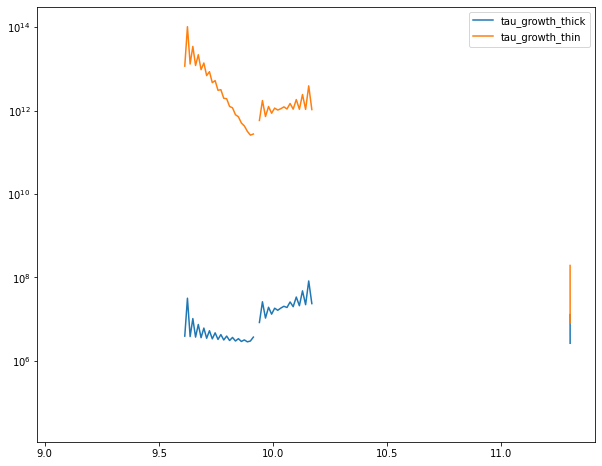

In [47]:
plt.figure(figsize=(10,8))
plt.plot(R,tau_growth_thick, label='tau_growth_thick')
plt.plot(R, tau_growth_thin, label='tau_growth_thin')
#plt.plot(R[RCB], tau_cool[RCB], 'ro')
#plt.plot(R[RCB], tau_cool_thin[RCB], 'ro')
plt.yscale('log')
plt.legend()
plt.show()

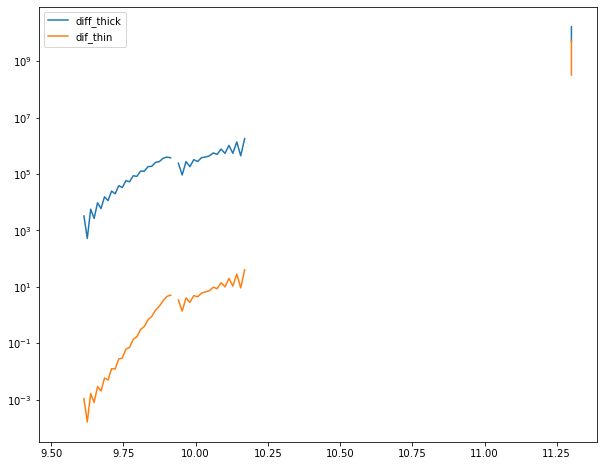

In [48]:
plt.figure(figsize=(10,8))
plt.plot(R,diff_thick, label='diff_thick')
plt.plot(R, diff_thin, label='dif_thin')
#plt.plot(R[RCB], tau_cool[RCB], 'ro')
#plt.plot(R[RCB], tau_cool_thin[RCB], 'ro')
plt.yscale('log')
plt.legend()
plt.show()

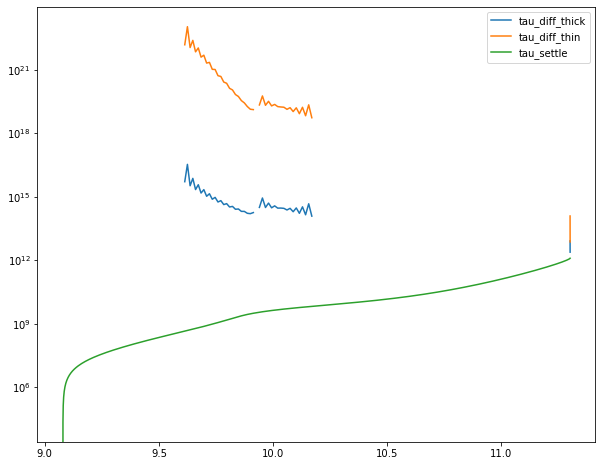

In [49]:
plt.figure(figsize=(10,8))
plt.plot(R,tau_diff_thick, label='tau_diff_thick')
plt.plot(R, tau_diff_thin, label='tau_diff_thin')
plt.plot(R, Tsettl, label='tau_settle')
#plt.plot(R[RCB], tau_cool[RCB], 'ro')
#plt.plot(R[RCB], tau_cool_thin[RCB], 'ro')
plt.yscale('log')
plt.legend()
plt.show()


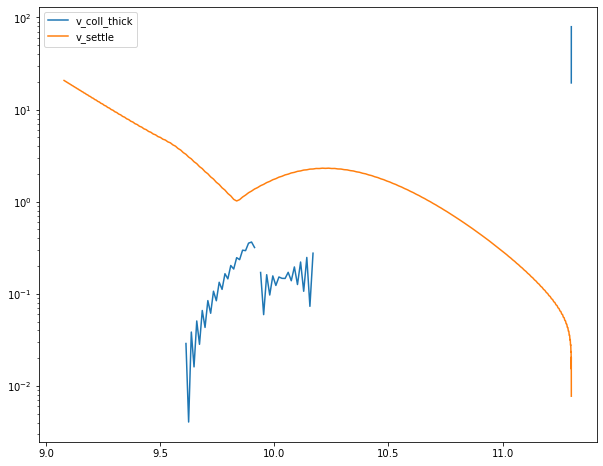

In [50]:
plt.figure(figsize=(10,8))
plt.plot(R,v_coll_thick, label='v_coll_thick')
plt.plot(R,Vset, label='v_settle')
#plt.plot(R[RCB], d_finger[RCB], 'ro')
#plt.title('d_finger')
plt.yscale('log')
plt.legend()
plt.show()

# New section Oct 14 (using a new optically thin expression for finger size + optically-thin cooling time)

In [51]:
new_d_finger = np.sqrt(nu_visc / Nth**2 / tau_cool_thin)

# Growth time of fingers 
#new_tau_growth_thin  = np.sqrt(Prandtl) * tau_cool_thin
new_tau_growth_thin  = 1./np.sqrt(Prandtl/R_0) * tau_cool_thin

# Diffusion coeff from fingers 
new_diff_thin = new_d_finger**2 / new_tau_growth_thin

# Local Diffusion time from fingers 
new_tau_diff_thin = (10**R)**2 / new_diff_thin

# Collision velocity
new_v_coll = new_d_finger / new_tau_growth_thin

<ipython-input-51-93ceda7b252a>:5: RuntimeWarning: invalid value encountered in sqrt
  new_tau_growth_thin  = 1./np.sqrt(Prandtl/R_0) * tau_cool_thin


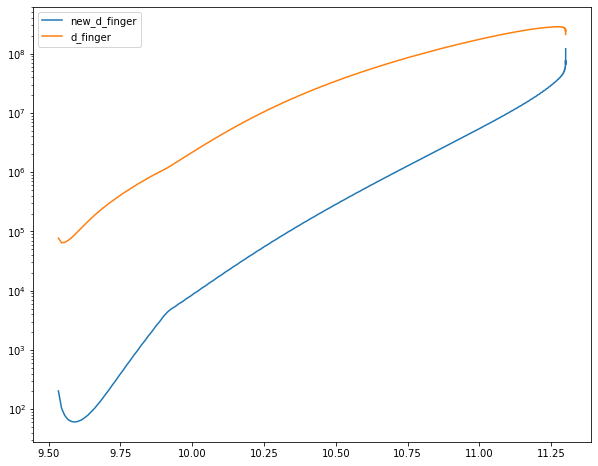

In [52]:
plt.figure(figsize=(10,8))
plt.plot(R,new_d_finger, label='new_d_finger')
plt.plot(R,d_finger, label='d_finger')
#plt.plot(R[RCB], d_finger[RCB], 'ro')
#plt.title('d_finger')
plt.yscale('log')
plt.legend()
plt.show()

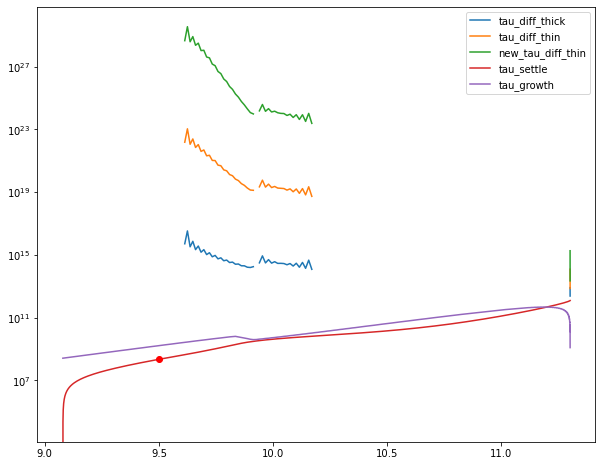

In [53]:
plt.figure(figsize=(10,8))
plt.plot(R, tau_diff_thick, label='tau_diff_thick')
plt.plot(R, tau_diff_thin, label='tau_diff_thin')
plt.plot(R, new_tau_diff_thin, label='new_tau_diff_thin')
plt.plot(R, Tsettl, label='tau_settle')
plt.plot(R, TGrow['g'], label='tau_growth')
plt.plot(R[RCB], Tsettl[RCB], 'ro')

plt.yscale('log')
plt.legend()
plt.show()

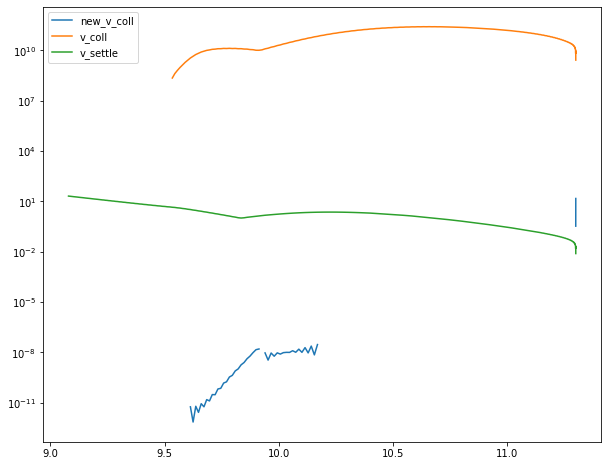

In [54]:
plt.figure(figsize=(10,8))
plt.plot(R,new_v_coll, label='new_v_coll')
plt.plot(R,v_coll, label='v_coll')
plt.plot(R,Vset, label='v_settle')
#plt.plot(R[RCB], d_finger[RCB], 'ro')
#plt.title('d_finger')
plt.yscale('log')
plt.legend()
plt.show()

# New section Oct 26: fingers must be larger to cool more slowly.

# Just make fingers larger for slower cooling time (to avoid viscous dissipation), keep all other scalings as original Brown+ theory

In [55]:
# From: tau_cool = d_finger**2/xi_rad
d_finger_eff = np.sqrt(xi_rad * tau_cool_thin)

# 

tau_cool_eff = tau_cool_thin # effective cooling time is tau_cool_thin

# Then use all optically thick formalism with d_finger_eff (cooling time is now thin one):

# Growth time of fingers 
#tau_growth_eff =  tau_cool_eff
tau_growth_eff = 1./np.sqrt(Prandtl) * tau_cool_eff
#tau_growth_eff = 1./np.sqrt(Prandtl / R_0) * tau_cool_eff  

# Diffusion coeff from fingers 
diff_eff = d_finger_eff**2 / tau_growth_eff

#diff_theory = np.sqrt(xi_rad**2 * Prandtl)
#diff_eff = diff_theory

# Local Diffusion time from fingers 
tau_diff_eff = (10**R)**2 / diff_eff 

# Velocity collision
v_coll_eff = d_finger_eff / tau_growth_eff

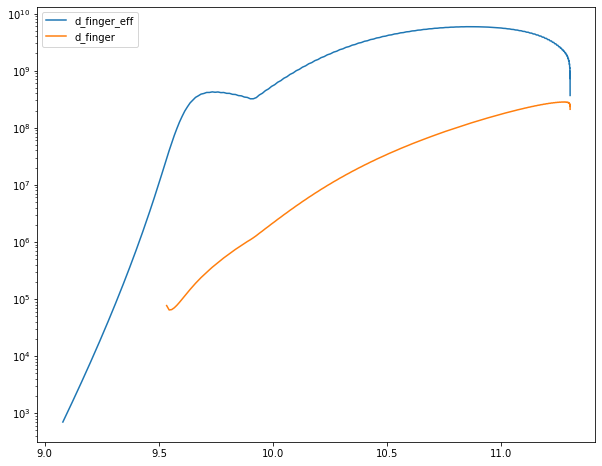

In [56]:
plt.figure(figsize=(10,8))
plt.plot(R,d_finger_eff, label='d_finger_eff')
plt.plot(R,d_finger, label='d_finger')
#plt.plot(R[RCB], d_finger[RCB], 'ro')
#plt.title('d_finger')
plt.yscale('log')
plt.legend()
plt.show()


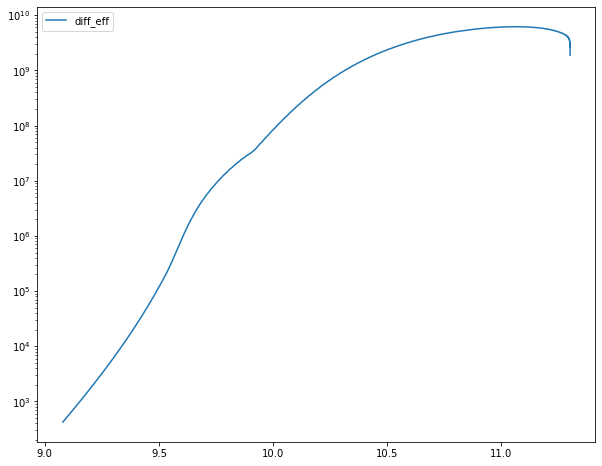

In [57]:
plt.figure(figsize=(10,8))
plt.plot(R,diff_eff, label='diff_eff')
#plt.plot(R,d_finger, label='d_finger')
#plt.plot(R[RCB], d_finger[RCB], 'ro')
#plt.title('d_finger')
plt.yscale('log')
plt.legend()
plt.show()


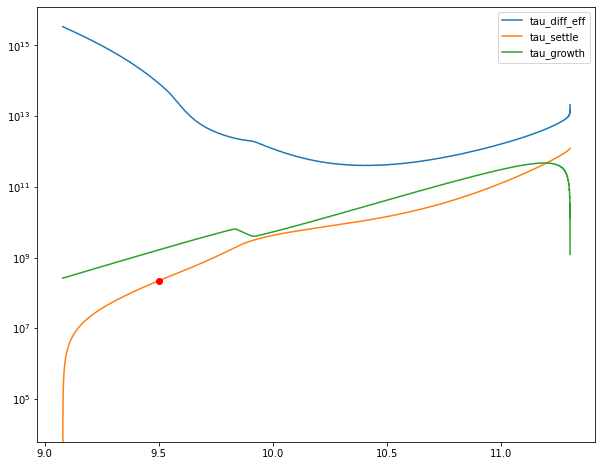

In [58]:
plt.figure(figsize=(10,8))
plt.plot(R, tau_diff_eff, label='tau_diff_eff')
plt.plot(R, Tsettl, label='tau_settle')
plt.plot(R, TGrow['g'], label='tau_growth')
plt.plot(R[RCB], Tsettl[RCB], 'ro')

plt.yscale('log')
plt.legend()
plt.show()

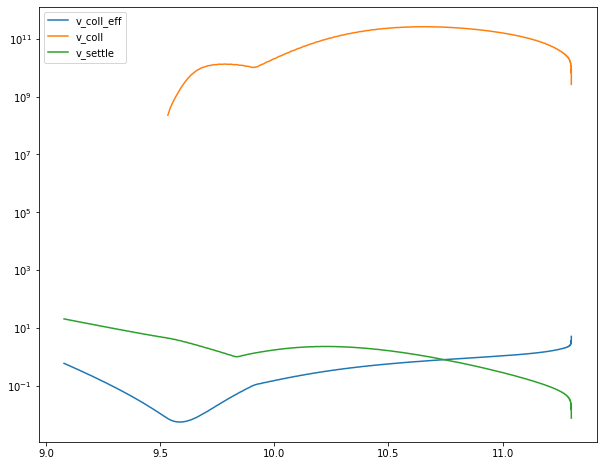

In [59]:
plt.figure(figsize=(10,8))
plt.plot(R,v_coll_eff, label='v_coll_eff')
plt.plot(R,v_coll, label='v_coll')
plt.plot(R,Vset, label='v_settle')
#plt.plot(R[RCB], d_finger[RCB], 'ro')
#plt.title('d_finger')
plt.yscale('log')
plt.legend()
plt.show()

# New section Oct 27: Stern number from Brown + 2013

In [60]:
# We use intermediate regime Tau,Prandtl << r << 1. Eqns 36 & 37 of Brown+ 

X_mu =1.0e0 # reduction factor for compositional of dust, relative to viscosity
Prandtl_mu = X_mu * Prandtl # written Tau in Brown : ratio of compositional diffusion to thermal diffusion
r_Brown = (R_0 -1) / (1./Prandtl_mu - 1)


C = 7.0 # Calibration constant

Nusselt_T = 1 + C**2 * Prandtl * Prandtl_mu * (1 + Prandtl_mu / Prandtl) / r_Brown
Nusselt_mu = 1 + C**2 * np.sqrt(Prandtl / Prandtl_mu) * np.sqrt((1 + Prandtl_mu / Prandtl) / r_Brown)

<ipython-input-60-f1b807cc0ac1>:11: RuntimeWarning: invalid value encountered in sqrt
  Nusselt_mu = 1 + C**2 * np.sqrt(Prandtl / Prandtl_mu) * np.sqrt((1 + Prandtl_mu / Prandtl) / r_Brown)


In [61]:
# Stern number A

gamma_turb = R_0 * (Nusselt_T -1) /  (Nusselt_mu -1) / Prandtl_mu
A = (Nusselt_T -1) * (1./gamma_turb -1) / Prandtl / (1 - 1./R_0)

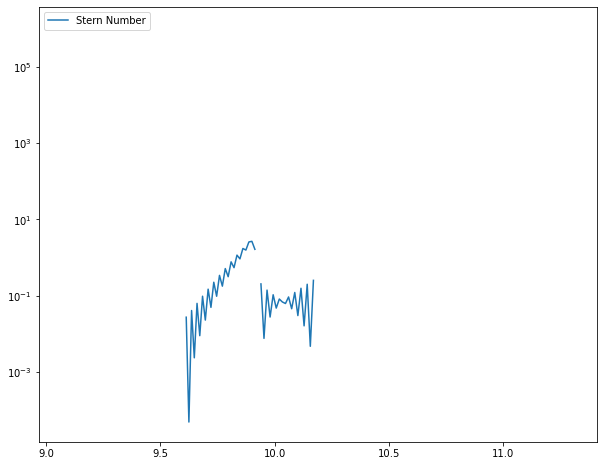

In [62]:
plt.figure(figsize=(10,8))
plt.plot(R,A, label='Stern Number')

plt.yscale('log')
plt.legend()
plt.show()

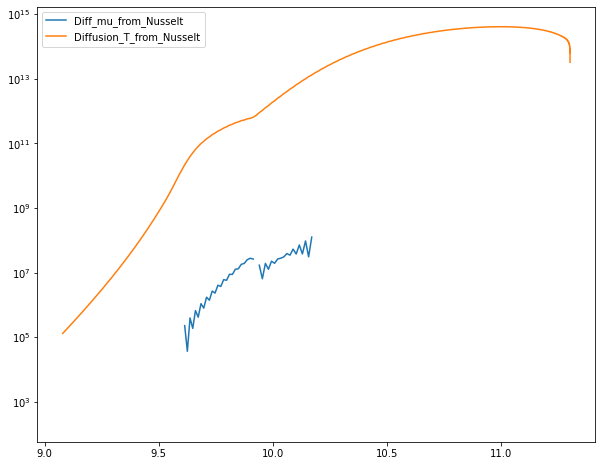

In [63]:
plt.figure(figsize=(10,8))
plt.plot(R,Nusselt_mu * Prandtl * xi_rad , label='Diff_mu_from_Nusselt')
plt.plot(R,Nusselt_T * xi_rad, label='Diffusion_T_from_Nusselt')
plt.yscale('log')
plt.legend()
plt.show()